In [1]:
import requests
from pathlib import Path
import pandas as pd
from tqdm.auto import tqdm
import zipfile
import os

# -------------------------------------------------
# 1. Download Metadata
# -------------------------------------------------
print("Downloading metadata...")

url = "https://doi.org/10.1594/PANGAEA.980773"
r = requests.get(
    url,
    headers={"Accept": "text/tab-separated-values"},
    allow_redirects=True,
    timeout=120
)

meta_path = Path("/kaggle/working/DARTIS_2019.tab")
meta_path.write_bytes(r.content)
print(f"✅ Metadata saved ({len(r.content)/1e6:.1f} MB)")

# -------------------------------------------------
# 2. Read Metadata
# -------------------------------------------------
df = pd.read_csv(meta_path, sep="\t", skiprows=49, low_memory=False)
print(f"Total records: {len(df)}")
print(df.columns.tolist()[:12])

✅ Metadata saved (2.4 MB)
Total records: 5515
['Image set (subset; oc : oil/coast; ow : ...)', 'IMAGE (jpg_file)', 'Binary (xml_file)', 'ID (tag)', 'ID (patch_name)', 'Date/Time (start_time)', 'Date/Time (end_time)', 'ID (Sentinel_ID)', 'Width [pixel] (patch_width)', 'Height [pixel] (patch_height)', 'Longitude (patch_ul_lon)', 'Latitude (patch_ul_lat)']


In [2]:
import requests
from pathlib import Path
import pandas as pd
from tqdm.auto import tqdm
import time

# -------------------------------------------------
# 1. Load metadata
# -------------------------------------------------
meta_path = Path("/kaggle/working/DARTIS_2019.tab")
df = pd.read_csv(meta_path, sep="\t", skiprows=49, low_memory=False)

print(f"Total images in metadata: {len(df)}")
print(df["IMAGE (jpg_file)"].head())

# -------------------------------------------------
# 2. Create folder
# -------------------------------------------------
img_dir = Path("/kaggle/working/dartis_images")
img_dir.mkdir(exist_ok=True)

# -------------------------------------------------
# 3. Download images one by one
# -------------------------------------------------
# First download only 50 images for testing (change later)
sample_df = df.head(50)   # ← testing ke liye 50 images. Baad mein df kar dena pure ke liye

success = 0
failed = 0

for idx, row in tqdm(sample_df.iterrows(), total=len(sample_df)):
    filename = str(row["IMAGE (jpg_file)"]).strip()
    
    if not filename.endswith((".jpg", ".png", ".tif")):
        continue
        
    out_path = img_dir / filename
    
    # Skip if already downloaded
    if out_path.exists():
        success += 1
        continue
    
    url = f"https://download.pangaea.de/dataset/980773/files/{filename}"
    
    try:
        r = requests.get(url, timeout=30)
        if r.status_code == 200:
            out_path.write_bytes(r.content)
            success += 1
        else:
            print(f"Failed: {filename} | Status: {r.status_code}")
            failed += 1
    except Exception as e:
        print(f"Error: {filename} | {e}")
        failed += 1
    
    time.sleep(0.3)  

print(f"\n✅ Downloaded: {success}")
print(f"❌ Failed: {failed}")
print(f"Images saved in: {img_dir}")

Total images in metadata: 5515
0    ow-0001.jpg
1    ow-0002.jpg
2    ow-0003.jpg
3    ow-0004.jpg
4    ow-0004.jpg
Name: IMAGE (jpg_file), dtype: object


  0%|          | 0/50 [00:00<?, ?it/s]


✅ Downloaded: 50
❌ Failed: 0
Images saved in: /kaggle/working/dartis_images


In [3]:
!pip install -q segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.2 MB/s eta 0:00:00


In [4]:
import torch
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
import segmentation_models_pytorch as smp
from typing import Dict, Optional, Tuple

# ============================================================
# 1. CONFIG
# ============================================================
MODEL_PATH = "/kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt"  
THRESHOLD = 0.5
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ============================================================
# 2. LOAD MODEL
# ============================================================
print("Loading model...")

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
    activation=None
)

ckpt = torch.load(MODEL_PATH, map_location=DEVICE, weights_only=False)
state = ckpt.get("model_state_dict") or ckpt.get("state_dict") or ckpt
model.load_state_dict(state)
model.to(DEVICE)
model.eval()
print(f"✅ Model loaded on {DEVICE}")

# ============================================================
# 3. LOAD METADATA
# ============================================================
meta_path = Path("/kaggle/working/DARTIS_2019.tab")
df_meta = pd.read_csv(meta_path, sep="\t", skiprows=49, low_memory=False)
print(f"✅ Metadata loaded: {len(df_meta)} records")

# ============================================================
# 4. HELPER: Pixel → Lat/Lon conversion
# ============================================================
def pixel_to_latlon(
    px: float, 
    py: float, 
    img_w: int, 
    img_h: int,
    ul_lon: float, ul_lat: float,
    ur_lon: float, ur_lat: float,
    br_lon: float, br_lat: float,
    bl_lon: float, bl_lat: float
) -> Tuple[float, float]:
    """
    Convert pixel coordinates to approximate latitude/longitude
    using bilinear interpolation from 4 corners.
    """
    # Normalized coordinates (0 to 1)
    x = px / max(img_w - 1, 1)
    y = py / max(img_h - 1, 1)

    # Bilinear interpolation
    top_lon = ul_lon + (ur_lon - ul_lon) * x
    top_lat = ul_lat + (ur_lat - ul_lat) * x
    bot_lon = bl_lon + (br_lon - bl_lon) * x
    bot_lat = bl_lat + (br_lat - bl_lat) * x

    lon = top_lon + (bot_lon - top_lon) * y
    lat = top_lat + (bot_lat - top_lat) * y

    return round(lat, 6), round(lon, 6)

# ============================================================
# 5. MAIN DETECTION FUNCTION
# ============================================================
def detect_oil(
    image_path: str,
    threshold: float = THRESHOLD
) -> Dict:
    
    image_path = Path(image_path)
    filename = image_path.name

    # ----- Read Image -----
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return {"error": f"Cannot read image: {filename}"}

    original_h, original_w = img.shape

    # ----- Preprocess -----
    img_resized = cv2.resize(img, (256, 256), interpolation=cv2.INTER_LINEAR)
    x = img_resized.astype(np.float32) / 255.0
    x = (x - 0.5) / 0.5
    x = torch.from_numpy(x).float().unsqueeze(0).unsqueeze(0).to(DEVICE)

    # ----- Predict -----
    with torch.no_grad():
        logits = model(x)
        prob = torch.sigmoid(logits).squeeze().cpu().numpy()
        mask = (prob >= threshold).astype(np.uint8)

    oil_pixels = int(mask.sum())
    oil_detected = oil_pixels > 80
    confidence = float(prob[mask == 1].mean()) if oil_pixels > 0 else 0.0

    result = {
        "image_name": filename,
        "oil_detected": oil_detected,
        "confidence": round(confidence, 4),
        "oil_pixels": oil_pixels,
        "oil_fraction": round(oil_pixels / (256*256), 5),
        "bbox_pixel": None,
        "centroid_pixel": None,
        "bbox_latlon": None,
        "centroid_latlon": None,
    }

    if not oil_detected:
        return result

    # ----- Find largest oil region -----
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return result

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)

    # Scale back to original image size
    scale_x = original_w / 256
    scale_y = original_h / 256

    xmin = int(x * scale_x)
    ymin = int(y * scale_y)
    xmax = int((x + w) * scale_x)
    ymax = int((y + h) * scale_y)
    cx = (xmin + xmax) // 2
    cy = (ymin + ymax) // 2

    result["bbox_pixel"] = [xmin, ymin, xmax, ymax]
    result["centroid_pixel"] = [cx, cy]

    # ----- Get geo info from metadata -----
    match = df_meta[df_meta["IMAGE (jpg_file)"] == filename]

    if len(match) == 0:
        result["warning"] = "No geo metadata found for this image"
        return result

    row = match.iloc[0]

    try:
        ul_lon = float(row["Longitude (patch_ul_lon)"])
        ul_lat = float(row["Latitude (patch_ul_lat)"])
        ur_lon = float(row["Longitude (patch_ur_lon)"])
        ur_lat = float(row["Latitude (patch_ur_lat)"])
        br_lon = float(row["Longitude (patch_br_lon)"])
        br_lat = float(row["Latitude (patch_br_lat)"])
        bl_lon = float(row["Longitude (patch_bl_lon)"])
        bl_lat = float(row["Latitude (patch_bl_lat)"])

        # Convert centroid
        lat, lon = pixel_to_latlon(cx, cy, original_w, original_h,
                                   ul_lon, ul_lat, ur_lon, ur_lat,
                                   br_lon, br_lat, bl_lon, bl_lat)
        result["centroid_latlon"] = {"lat": lat, "lon": lon}

        # Convert bbox corners
        lat1, lon1 = pixel_to_latlon(xmin, ymin, original_w, original_h,
                                     ul_lon, ul_lat, ur_lon, ur_lat,
                                     br_lon, br_lat, bl_lon, bl_lat)
        lat2, lon2 = pixel_to_latlon(xmax, ymax, original_w, original_h,
                                     ul_lon, ul_lat, ur_lon, ur_lat,
                                     br_lon, br_lat, bl_lon, bl_lat)

        result["bbox_latlon"] = {
            "min_lat": min(lat1, lat2),
            "max_lat": max(lat1, lat2),
            "min_lon": min(lon1, lon2),
            "max_lon": max(lon1, lon2)
        }

    except Exception as e:
        result["warning"] = f"Geo conversion failed: {str(e)}"

    return result

# ============================================================
# 6. TEST
# ============================================================
# Test on one image
test_images = list(Path("/kaggle/working/dartis_images").glob("*.jpg"))
print(f"Found {len(test_images)} images")

if test_images:
    result = detect_oil(str(test_images[0]))
    print("\n========== RESULT ==========")
    for k, v in result.items():
        print(f"{k:20}: {v}")

Loading model...
✅ Model loaded on cuda
✅ Metadata loaded: 5515 records
Found 17 images

========== RESULT ==========
image_name          : ow-0015.jpg
oil_detected        : True
confidence          : 0.5418
oil_pixels          : 5278
oil_fraction        : 0.08054
bbox_pixel          : [639, 610, 985, 927]
centroid_pixel      : [812, 768]
bbox_latlon         : {'min_lat': 32.849821, 'max_lat': 32.917718, 'min_lon': 31.328817, 'max_lon': 31.389711}
centroid_latlon     : {'lat': 32.88368, 'lon': 31.359283}


In [5]:
!pip install -q segmentation-models-pytorch

In [6]:
import torch
import segmentation_models_pytorch as smp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", device)

Device: cuda


In [7]:
BEST_FINAL = "/kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt"

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
    activation=None
)

state_dict = torch.load(
    BEST_FINAL,
    map_location=device,
    weights_only=True
)

model.load_state_dict(state_dict)

model = model.to(device)
model.eval()

print("✅ Final adapted model loaded.")
print("Device:", device)

✅ Final adapted model loaded.
Device: cuda


In [8]:
print(type(state_dict))
print(len(state_dict))
print(next(model.parameters()).shape)

<class 'collections.OrderedDict'>
278
torch.Size([64, 1, 7, 7])


In [9]:
import pandas as pd

DARTIS_TAB = "/kaggle/working/DARTIS_2019.tab"

test_df = pd.read_csv(
    DARTIS_TAB,
    sep="\t",
    skiprows=49,
    low_memory=False
)

print("Metadata loaded:")
print(test_df.shape)
print(test_df.columns.tolist())

Metadata loaded:
(5515, 31)
['Image set (subset; oc : oil/coast; ow : ...)', 'IMAGE (jpg_file)', 'Binary (xml_file)', 'ID (tag)', 'ID (patch_name)', 'Date/Time (start_time)', 'Date/Time (end_time)', 'ID (Sentinel_ID)', 'Width [pixel] (patch_width)', 'Height [pixel] (patch_height)', 'Longitude (patch_ul_lon)', 'Latitude (patch_ul_lat)', 'Longitude (patch_ur_lon)', 'Latitude (patch_ur_lat)', 'Longitude (patch_br_lon)', 'Latitude (patch_br_lat)', 'Longitude (patch_bl_lon)', 'Latitude (patch_bl_lat)', 'Longitude (obj_ul_lon)', 'Latitude (obj_ul_lat)', 'Longitude (obj_ur_lon)', 'Latitude (obj_ur_lat)', 'Longitude (obj_br_lon)', 'Latitude (obj_br_lat)', 'Longitude (obj_bl_lon)', 'Latitude (obj_bl_lat)', 'Pos X [pixel] (obj_patchloc_xmin)', 'Pos Y [pixel] (obj_patchloc_ymin)', 'Pos X [pixel] (obj_patchloc_xmax)', 'Pos Y [pixel] (obj_patchloc_ymax)', 'Size [pixel] (label_size)']


In [10]:
from pathlib import Path

IMAGE_DIR = Path("/kaggle/working/dartis_images")

images = sorted(
    list(IMAGE_DIR.rglob("*.jpg")) +
    list(IMAGE_DIR.rglob("*.jpeg")) +
    list(IMAGE_DIR.rglob("*.png")) +
    list(IMAGE_DIR.rglob("*.tif")) +
    list(IMAGE_DIR.rglob("*.tiff"))
)

print("Total images:", len(images))
print("\nFirst 20 images:")
for p in images[:20]:
    print(p)

Total images: 17

First 20 images:
/kaggle/working/dartis_images/ow-0001.jpg
/kaggle/working/dartis_images/ow-0002.jpg
/kaggle/working/dartis_images/ow-0003.jpg
/kaggle/working/dartis_images/ow-0004.jpg
/kaggle/working/dartis_images/ow-0005.jpg
/kaggle/working/dartis_images/ow-0006.jpg
/kaggle/working/dartis_images/ow-0007.jpg
/kaggle/working/dartis_images/ow-0008.jpg
/kaggle/working/dartis_images/ow-0009.jpg
/kaggle/working/dartis_images/ow-0010.jpg
/kaggle/working/dartis_images/ow-0011.jpg
/kaggle/working/dartis_images/ow-0012.jpg
/kaggle/working/dartis_images/ow-0013.jpg
/kaggle/working/dartis_images/ow-0014.jpg
/kaggle/working/dartis_images/ow-0015.jpg
/kaggle/working/dartis_images/ow-0016.jpg
/kaggle/working/dartis_images/ow-0017.jpg


In [11]:
print("\nDARTIS metadata:")
print(test_df.shape if "test_df" in globals() else "test_df not loaded")

print("\nColumns:")
if "test_df" in globals():
    print(test_df.columns.tolist())


DARTIS metadata:
(5515, 31)

Columns:
['Image set (subset; oc : oil/coast; ow : ...)', 'IMAGE (jpg_file)', 'Binary (xml_file)', 'ID (tag)', 'ID (patch_name)', 'Date/Time (start_time)', 'Date/Time (end_time)', 'ID (Sentinel_ID)', 'Width [pixel] (patch_width)', 'Height [pixel] (patch_height)', 'Longitude (patch_ul_lon)', 'Latitude (patch_ul_lat)', 'Longitude (patch_ur_lon)', 'Latitude (patch_ur_lat)', 'Longitude (patch_br_lon)', 'Latitude (patch_br_lat)', 'Longitude (patch_bl_lon)', 'Latitude (patch_bl_lat)', 'Longitude (obj_ul_lon)', 'Latitude (obj_ul_lat)', 'Longitude (obj_ur_lon)', 'Latitude (obj_ur_lat)', 'Longitude (obj_br_lon)', 'Latitude (obj_br_lat)', 'Longitude (obj_bl_lon)', 'Latitude (obj_bl_lat)', 'Pos X [pixel] (obj_patchloc_xmin)', 'Pos Y [pixel] (obj_patchloc_ymin)', 'Pos X [pixel] (obj_patchloc_xmax)', 'Pos Y [pixel] (obj_patchloc_ymax)', 'Size [pixel] (label_size)']


In [12]:
import pandas as pd
import numpy as np
import cv2
import json
from pathlib import Path

# ---------------------------------------------------------
# Paths
# ---------------------------------------------------------
IMAGE_DIR = Path("/kaggle/working/dartis_images")
META_PATH = "/kaggle/working/DARTIS_2019.tab"

# ---------------------------------------------------------
# Load metadata
# ---------------------------------------------------------
df = pd.read_csv(
    META_PATH,
    sep="\t",
    skiprows=49,
    low_memory=False
)

print("Metadata:", df.shape)

# ---------------------------------------------------------
# Check the downloaded images
# ---------------------------------------------------------
images = sorted(IMAGE_DIR.glob("*.jpg"))

print("Images:", len(images))
for p in images[:5]:
    print(" ", p.name)

# ---------------------------------------------------------
# Pick first image
# ---------------------------------------------------------
test_image = images[0]

print("\nTesting:", test_image)

# ---------------------------------------------------------
# Find metadata row for this image
# ---------------------------------------------------------
image_col = "IMAGE (jpg_file)"

matches = df[
    df[image_col]
    .astype(str)
    .str.strip()
    .str.lower()
    == test_image.name.lower()
]

print("Metadata matches:", len(matches))

if len(matches) == 0:
    print("\nTrying filename contains match...")
    matches = df[
        df[image_col]
        .astype(str)
        .str.contains(
            test_image.stem,
            case=False,
            na=False
        )
    ]

print("Final matches:", len(matches))

if len(matches) > 0:
    row = matches.iloc[0]

    print("\nIMAGE:", row[image_col])

    print(
        "\nPatch corners:"
    )

    print(
        "UL:",
        row["Latitude (patch_ul_lat)"],
        row["Longitude (patch_ul_lon)"]
    )

    print(
        "UR:",
        row["Latitude (patch_ur_lat)"],
        row["Longitude (patch_ur_lon)"]
    )

    print(
        "BR:",
        row["Latitude (patch_br_lat)"],
        row["Longitude (patch_br_lon)"]
    )

    print(
        "BL:",
        row["Latitude (patch_bl_lat)"],
        row["Longitude (patch_bl_lon)"]
    )

else:
    print("❌ No metadata row found.")

Metadata: (5515, 31)
Images: 17
  ow-0001.jpg
  ow-0002.jpg
  ow-0003.jpg
  ow-0004.jpg
  ow-0005.jpg

Testing: /kaggle/working/dartis_images/ow-0001.jpg
Metadata matches: 1
Final matches: 1

IMAGE: ow-0001.jpg

Patch corners:
UL: 33.3063075949622 33.1445256369044
UR: 33.3252260245976 33.0089451408765
BR: 33.2100446700746 32.9864942079466
BL: 33.1911262404391 33.1220747039746


Original image shape: (640, 640)
Mean: 162.8424
Std : 32.624752
Probability range: 0.045322154 0.839874
Predicted pixels: 77
Predicted fraction: 0.00018798828125


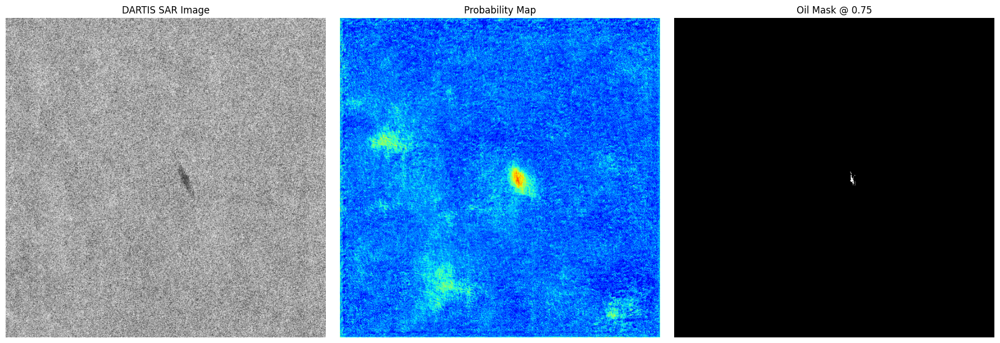

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Test image
# ---------------------------------------------------------
image_path = "/kaggle/working/dartis_images/ow-0001.jpg"

image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(image_path)

print("Original image shape:", image.shape)

# ---------------------------------------------------------
# Per-image standardization
# ---------------------------------------------------------
image_float = image.astype(np.float32)

mean = image_float.mean()
std = image_float.std()

normalized = (image_float - mean) / (std + 1e-8)

print("Mean:", mean)
print("Std :", std)

# ---------------------------------------------------------
# Tile configuration
# ---------------------------------------------------------
PATCH = 256
STRIDE = 128

H, W = image.shape

probability_map = np.zeros(
    (H, W),
    dtype=np.float32
)

weight_map = np.zeros(
    (H, W),
    dtype=np.float32
)

# ---------------------------------------------------------
# Gaussian blending window
# ---------------------------------------------------------
x = np.linspace(-1, 1, PATCH)
xx, yy = np.meshgrid(x, x)

sigma = 0.5

gaussian = np.exp(
    -(xx**2 + yy**2) /
    (2 * sigma**2)
).astype(np.float32)

# ---------------------------------------------------------
# Tiled inference
# ---------------------------------------------------------
model.eval()

with torch.no_grad():

    for y in range(0, H - PATCH + 1, STRIDE):

        for x in range(0, W - PATCH + 1, STRIDE):

            tile = normalized[
                y:y+PATCH,
                x:x+PATCH
            ]

            tensor = torch.from_numpy(
                tile
            ).float().unsqueeze(0).unsqueeze(0)

            tensor = tensor.to(device)

            logits = model(tensor)

            prob = torch.sigmoid(
                logits
            )[0, 0].cpu().numpy()

            probability_map[
                y:y+PATCH,
                x:x+PATCH
            ] += prob * gaussian

            weight_map[
                y:y+PATCH,
                x:x+PATCH
            ] += gaussian

# ---------------------------------------------------------
# Normalize overlapping regions
# ---------------------------------------------------------
probability_map /= (
    weight_map + 1e-8
)

print(
    "Probability range:",
    probability_map.min(),
    probability_map.max()
)

# ---------------------------------------------------------
# Threshold
# ---------------------------------------------------------
THRESHOLD = 0.75

binary = (
    probability_map >= THRESHOLD
).astype(np.uint8)

print(
    "Predicted pixels:",
    int(binary.sum())
)

print(
    "Predicted fraction:",
    float(binary.mean())
)

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(
    1, 3,
    figsize=(18, 6)
)

axes[0].imshow(
    image,
    cmap="gray"
)

axes[0].set_title(
    "DARTIS SAR Image"
)

axes[0].axis("off")

axes[1].imshow(
    probability_map,
    cmap="jet",
    vmin=0,
    vmax=1
)

axes[1].set_title(
    "Probability Map"
)

axes[1].axis("off")

axes[2].imshow(
    binary,
    cmap="gray"
)

axes[2].set_title(
    f"Oil Mask @ {THRESHOLD}"
)

axes[2].axis("off")

plt.tight_layout()
plt.show()

In [14]:
import cv2
import numpy as np

THRESHOLD = 0.75
MIN_AREA = 30
MAX_AREA_FRACTION = 0.08

binary = (
    probability_map >= THRESHOLD
).astype(np.uint8)

# Connected components
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
    binary,
    connectivity=8
)

H, W = binary.shape

detections = []

for i in range(1, num_labels):

    x = stats[i, cv2.CC_STAT_LEFT]
    y = stats[i, cv2.CC_STAT_TOP]
    w = stats[i, cv2.CC_STAT_WIDTH]
    h = stats[i, cv2.CC_STAT_HEIGHT]
    area = stats[i, cv2.CC_STAT_AREA]

    # Filter tiny noise
    if area < MIN_AREA:
        continue

    # Filter absurdly large regions
    if area > MAX_AREA_FRACTION * H * W:
        continue

    cx, cy = centroids[i]

    component_probs = probability_map[
        labels == i
    ]

    detections.append({
        "label": int(i),
        "area": int(area),
        "bbox": [
            int(x),
            int(y),
            int(x + w),
            int(y + h)
        ],
        "centroid_pixel": [
            float(cx),
            float(cy)
        ],
        "mean_confidence": float(component_probs.mean()),
        "peak_confidence": float(component_probs.max())
    })

print("Total connected components:", num_labels - 1)
print("Valid detections:", len(detections))

for d in detections:
    print("\nDetection:")
    for k, v in d.items():
        print(f"  {k}: {v}")

Total connected components: 9
Valid detections: 1

Detection:
  label: 2
  area: 62
  bbox: [352, 314, 360, 332]
  centroid_pixel: [355.0483870967742, 323.61290322580646]
  mean_confidence: 0.7872207760810852
  peak_confidence: 0.8398740291595459


In [15]:
# ---------------------------------------------------------
# Ground truth for ow-0001
# ---------------------------------------------------------

IMAGE_NAME = "ow-0001.jpg"

rows = df[
    df["IMAGE (jpg_file)"].astype(str).str.strip()
    == IMAGE_NAME
]

print("Ground-truth rows:", len(rows))

if len(rows) == 0:

    print("❌ No ground-truth row found.")

else:

    for idx, row in rows.iterrows():

        print("\nGROUND TRUTH OBJECT")
        print("-------------------")

        print(
            "Pixel bbox:",
            [
                row["Pos X [pixel] (obj_patchloc_xmin)"],
                row["Pos Y [pixel] (obj_patchloc_ymin)"],
                row["Pos X [pixel] (obj_patchloc_xmax)"],
                row["Pos Y [pixel] (obj_patchloc_ymax)"]
            ]
        )

        print(
            "Object size:",
            row["Size [pixel] (label_size)"]
        )

        print(
            "Object geographic corners:"
        )

        print(
            "UL:",
            row["Latitude (obj_ul_lat)"],
            row["Longitude (obj_ul_lon)"]
        )

        print(
            "UR:",
            row["Latitude (obj_ur_lat)"],
            row["Longitude (obj_ur_lon)"]
        )

        print(
            "BR:",
            row["Latitude (obj_br_lat)"],
            row["Longitude (obj_br_lon)"]
        )

        print(
            "BL:",
            row["Latitude (obj_bl_lat)"],
            row["Longitude (obj_bl_lon)"]
        )

Ground-truth rows: 1

GROUND TRUTH OBJECT
-------------------
Pixel bbox: [345.0, 297.0, 368.0, 343.0]
Object size: 1058.0
Object geographic corners:
UL: 33.2630544636042 33.0610206397016
UR: 33.2637343446692 33.0561482156256
BR: 33.2554556848129 33.0545345548213
BL: 33.2547758037478 33.0594069788973


In [16]:
def pixel_to_latlon_from_metadata(
    cx,
    cy,
    image_name,
    metadata_df
):
    """
    Convert a pixel coordinate to latitude/longitude
    using the geographic corners stored in DARTIS metadata.
    """

    # -----------------------------------------------------
    # Find metadata for this image
    # -----------------------------------------------------
    rows = metadata_df[
        metadata_df["IMAGE (jpg_file)"]
        .astype(str)
        .str.strip()
        .str.lower()
        == image_name.strip().lower()
    ]

    if len(rows) == 0:
        raise ValueError(
            f"No metadata found for image: {image_name}"
        )

    # Patch corners are identical for objects belonging
    # to the same image, so first row is sufficient.
    row = rows.iloc[0]

    # -----------------------------------------------------
    # Extract geographic corners automatically
    # -----------------------------------------------------
    ul_lon = float(row["Longitude (patch_ul_lon)"])
    ul_lat = float(row["Latitude (patch_ul_lat)"])

    ur_lon = float(row["Longitude (patch_ur_lon)"])
    ur_lat = float(row["Latitude (patch_ur_lat)"])

    br_lon = float(row["Longitude (patch_br_lon)"])
    br_lat = float(row["Latitude (patch_br_lat)"])

    bl_lon = float(row["Longitude (patch_bl_lon)"])
    bl_lat = float(row["Latitude (patch_bl_lat)"])

    # -----------------------------------------------------
    # Get image dimensions
    # -----------------------------------------------------
    image_path = IMAGE_DIR / image_name

    img = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if img is None:
        raise FileNotFoundError(
            f"Could not read image: {image_path}"
        )

    H, W = img.shape

    # -----------------------------------------------------
    # Pixel corner coordinates
    # -----------------------------------------------------
    pixel_points = np.array([
        [0,     0],
        [W - 1, 0],
        [W - 1, H - 1],
        [0,     H - 1]
    ], dtype=np.float32)

    # -----------------------------------------------------
    # Geographic corner coordinates
    # x = longitude
    # y = latitude
    # -----------------------------------------------------
    geo_points = np.array([
        [ul_lon, ul_lat],
        [ur_lon, ur_lat],
        [br_lon, br_lat],
        [bl_lon, bl_lat]
    ], dtype=np.float32)

    # -----------------------------------------------------
    # Homography
    # -----------------------------------------------------
    H_matrix, _ = cv2.findHomography(
        pixel_points,
        geo_points
    )

    # -----------------------------------------------------
    # Pixel → geographic coordinate
    # -----------------------------------------------------
    point = np.array(
        [[[cx, cy]]],
        dtype=np.float32
    )

    geo = cv2.perspectiveTransform(
        point,
        H_matrix
    )

    lon = float(geo[0, 0, 0])
    lat = float(geo[0, 0, 1])

    return lat, lon

In [17]:
lat, lon = pixel_to_latlon_from_metadata(
    cx=355.0483870967742,
    cy=323.61290322580646,
    image_name="ow-0001.jpg",
    metadata_df=df
)

print(f"Latitude : {lat:.8f}")
print(f"Longitude: {lon:.8f}")

Latitude : 33.25848770
Longitude: 33.05782318


In [18]:
import cv2
import numpy as np
import torch


def detect_oil(
    image_name,
    model,
    metadata_df,
    image_dir="/kaggle/working/dartis_images",
    threshold=0.75,
    min_area=30,
    max_area_fraction=0.08,
    patch=256,
    stride=128
):
    """
    Complete DARTIS oil-spill inference pipeline.

    Input:
        image_name    -> e.g. "ow-0001.jpg"

    Output:
        JSON-serializable dictionary containing
        detections and geographic coordinates.
    """

    image_path = Path(image_dir) / image_name

    if not image_path.exists():
        raise FileNotFoundError(
            f"Image not found: {image_path}"
        )

    # =====================================================
    # 1. Load image
    # =====================================================

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        raise ValueError(
            f"Could not read image: {image_path}"
        )

    H_img, W_img = image.shape

    # =====================================================
    # 2. Find metadata automatically
    # =====================================================

    rows = metadata_df[
        metadata_df["IMAGE (jpg_file)"]
        .astype(str)
        .str.strip()
        .str.lower()
        == image_name.strip().lower()
    ]

    if len(rows) == 0:
        raise ValueError(
            f"No DARTIS metadata found for {image_name}"
        )

    row = rows.iloc[0]

    # =====================================================
    # 3. Extract geographic patch corners
    # =====================================================

    ul = [
        float(row["Longitude (patch_ul_lon)"]),
        float(row["Latitude (patch_ul_lat)"])
    ]

    ur = [
        float(row["Longitude (patch_ur_lon)"]),
        float(row["Latitude (patch_ur_lat)"])
    ]

    br = [
        float(row["Longitude (patch_br_lon)"]),
        float(row["Latitude (patch_br_lat)"])
    ]

    bl = [
        float(row["Longitude (patch_bl_lon)"]),
        float(row["Latitude (patch_bl_lat)"])
    ]

    # =====================================================
    # 4. Per-image standardization
    # =====================================================

    image_float = image.astype(np.float32)

    mean = image_float.mean()
    std = image_float.std()

    normalized = (
        image_float - mean
    ) / (std + 1e-8)

    # =====================================================
    # 5. Probability + weight maps
    # =====================================================

    probability_map = np.zeros(
        (H_img, W_img),
        dtype=np.float32
    )

    weight_map = np.zeros(
        (H_img, W_img),
        dtype=np.float32
    )

    # Gaussian blending window
    gx = np.linspace(-1, 1, patch)
    gy = np.linspace(-1, 1, patch)

    xx, yy = np.meshgrid(gx, gy)

    sigma = 0.5

    gaussian = np.exp(
        -(xx**2 + yy**2) /
        (2 * sigma**2)
    ).astype(np.float32)

    # =====================================================
    # 6. Tiled U-Net inference
    # =====================================================

    model.eval()

    with torch.no_grad():

        for y in range(
            0,
            H_img - patch + 1,
            stride
        ):

            for x in range(
                0,
                W_img - patch + 1,
                stride
            ):

                tile = normalized[
                    y:y + patch,
                    x:x + patch
                ]

                tensor = torch.from_numpy(
                    tile
                ).float()

                tensor = tensor.unsqueeze(0).unsqueeze(0)

                tensor = tensor.to(device)

                logits = model(tensor)

                prob = torch.sigmoid(
                    logits
                )[0, 0].cpu().numpy()

                probability_map[
                    y:y + patch,
                    x:x + patch
                ] += (
                    prob * gaussian
                )

                weight_map[
                    y:y + patch,
                    x:x + patch
                ] += gaussian

    probability_map /= (
        weight_map + 1e-8
    )

    # =====================================================
    # 7. Threshold
    # =====================================================

    binary = (
        probability_map >= threshold
    ).astype(np.uint8)

    # =====================================================
    # 8. Connected components
    # =====================================================

    num_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )

    detections = []

    for i in range(1, num_labels):

        x = stats[
            i,
            cv2.CC_STAT_LEFT
        ]

        y = stats[
            i,
            cv2.CC_STAT_TOP
        ]

        w = stats[
            i,
            cv2.CC_STAT_WIDTH
        ]

        h = stats[
            i,
            cv2.CC_STAT_HEIGHT
        ]

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        # Remove tiny noise
        if area < min_area:
            continue

        # Remove unrealistically large regions
        if area > max_area_fraction * H_img * W_img:
            continue

        cx, cy = centroids[i]

        component_probs = probability_map[
            labels == i
        ]

        # =================================================
        # 9. Pixel → geographic coordinates
        # =================================================

        pixel_points = np.array([
            [0,          0],
            [W_img - 1,  0],
            [W_img - 1,  H_img - 1],
            [0,          H_img - 1]
        ], dtype=np.float32)

        geo_points = np.array([
            ul,
            ur,
            br,
            bl
        ], dtype=np.float32)

        H_matrix, _ = cv2.findHomography(
            pixel_points,
            geo_points
        )

        point = np.array(
            [[[cx, cy]]],
            dtype=np.float32
        )

        geo = cv2.perspectiveTransform(
            point,
            H_matrix
        )

        longitude = float(
            geo[0, 0, 0]
        )

        latitude = float(
            geo[0, 0, 1]
        )

        # =================================================
        # 10. Store detection
        # =================================================

        detections.append({
            "bbox": [
                int(x),
                int(y),
                int(x + w),
                int(y + h)
            ],

            "area_pixels": int(area),

            "centroid_pixel": {
                "x": float(cx),
                "y": float(cy)
            },

            "latitude": latitude,

            "longitude": longitude,

            "confidence": float(
                component_probs.mean()
            ),

            "peak_confidence": float(
                component_probs.max()
            )
        })

    # =====================================================
    # 11. Final response
    # =====================================================

    return {
        "image": image_name,

        "oil_detected": (
            len(detections) > 0
        ),

        "num_detections": len(
            detections
        ),

        "threshold": threshold,

        "image_size": {
            "width": int(W_img),
            "height": int(H_img)
        },

        "detections": detections
    }

In [19]:
result = detect_oil(
    image_name="ow-0001.jpg",
    model=model,
    metadata_df=df
)

print(json.dumps(
    result,
    indent=2
))

{
  "image": "ow-0001.jpg",
  "oil_detected": true,
  "num_detections": 1,
  "threshold": 0.75,
  "image_size": {
    "width": 640,
    "height": 640
  },
  "detections": [
    {
      "bbox": [
        352,
        314,
        360,
        332
      ],
      "area_pixels": 62,
      "centroid_pixel": {
        "x": 355.0483870967742,
        "y": 323.61290322580646
      },
      "latitude": 33.258487701416016,
      "longitude": 33.057823181152344,
      "confidence": 0.7872207760810852,
      "peak_confidence": 0.8398740291595459
    }
  ]
}


In [20]:

all_results = []

for image_path in sorted(
    Path("/kaggle/working/dartis_images").glob("*.jpg")
):
    try:
        result = detect_oil(
            image_name=image_path.name,
            model=model,
            metadata_df=df
        )

        all_results.append(result)

        print(
            image_path.name,
            "->",
            result["oil_detected"],
            "| detections:",
            result["num_detections"]
        )

    except Exception as e:
        print(
            image_path.name,
            "-> ERROR:",
            e
        )

print("\nFinished:", len(all_results))

ow-0001.jpg -> True | detections: 1
ow-0002.jpg -> True | detections: 2
ow-0003.jpg -> True | detections: 6
ow-0004.jpg -> True | detections: 4
ow-0005.jpg -> True | detections: 3
ow-0006.jpg -> True | detections: 5
ow-0007.jpg -> False | detections: 0
ow-0008.jpg -> True | detections: 3
ow-0009.jpg -> True | detections: 4
ow-0010.jpg -> True | detections: 6
ow-0011.jpg -> True | detections: 4
ow-0012.jpg -> True | detections: 2
ow-0013.jpg -> True | detections: 1
ow-0014.jpg -> True | detections: 3
ow-0015.jpg -> True | detections: 10
ow-0016.jpg -> True | detections: 10
ow-0017.jpg -> True | detections: 13

Finished: 17


In [21]:
image_col = "IMAGE (jpg_file)"

print("Total metadata rows:", len(df))
print("Unique image filenames:", df[image_col].nunique())

print("\nUnique files in first 50 metadata rows:")
print(
    df.head(50)[image_col]
    .nunique()
)

print("\nFirst 50 rows -> unique filenames:")
print(
    df.head(50)[image_col]
    .drop_duplicates()
    .tolist()
)

Total metadata rows: 5515
Unique image filenames: 3655

Unique files in first 50 metadata rows:
17

First 50 rows -> unique filenames:
['ow-0001.jpg', 'ow-0002.jpg', 'ow-0003.jpg', 'ow-0004.jpg', 'ow-0005.jpg', 'ow-0006.jpg', 'ow-0007.jpg', 'ow-0008.jpg', 'ow-0009.jpg', 'ow-0010.jpg', 'ow-0011.jpg', 'ow-0012.jpg', 'ow-0013.jpg', 'ow-0014.jpg', 'ow-0015.jpg', 'ow-0016.jpg', 'ow-0017.jpg']


In [22]:
subset_col = "Image set (subset; oc : oil/coast; ow : ...)"
image_col = "IMAGE (jpg_file)"

# Unique image + subset pairs
unique_df = (
    df[[subset_col, image_col]]
    .dropna()
    .drop_duplicates(subset=[image_col])
)

print("Total unique images:", len(unique_df))

print("\nUnique images by subset:")
print(
    unique_df[subset_col]
    .value_counts()
)

Total unique images: 3655

Unique images by subset:
Image set (subset; oc : oil/coast; ow : ...)
nw    1939
ow     990
oc     375
nc     351
Name: count, dtype: int64


In [23]:
print("\nExample filenames by subset:\n")

for subset in unique_df[subset_col].dropna().unique():

    print(f"\n--- {subset} ---")

    examples = (
        unique_df[
            unique_df[subset_col] == subset
        ][image_col]
        .head(10)
        .tolist()
    )

    for name in examples:
        print(name)


Example filenames by subset:


--- ow ---
ow-0001.jpg
ow-0002.jpg
ow-0003.jpg
ow-0004.jpg
ow-0005.jpg
ow-0006.jpg
ow-0007.jpg
ow-0008.jpg
ow-0009.jpg
ow-0010.jpg

--- oc ---
oc-0001.jpg
oc-0002.jpg
oc-0003.jpg
oc-0004.jpg
oc-0005.jpg
oc-0006.jpg
oc-0007.jpg
oc-0008.jpg
oc-0009.jpg
oc-0010.jpg

--- nw ---
nw-0001-00-000001.jpg
nw-0002-00-000002.jpg
nw-0003-00-000003.jpg
nw-0004-00-000004.jpg
nw-0005-00-000005.jpg
nw-0006-00-000006.jpg
nw-0007-00-000007.jpg
nw-0008-00-000008.jpg
nw-0009-00-000009.jpg
nw-0010-00-000010.jpg

--- nc ---
nc-0001-00-000001.jpg
nc-0002-00-000002.jpg
nc-0003-00-000003.jpg
nc-0004-00-000004.jpg
nc-0005-00-000005.jpg
nc-0006-00-000006.jpg
nc-0007-00-000007.jpg
nc-0008-00-000008.jpg
nc-0009-00-000009.jpg
nc-0010-00-000010.jpg


In [24]:
from pathlib import Path
from tqdm.auto import tqdm
import requests
import pandas as pd
import time

# =========================================================
# CONFIG
# =========================================================

META_PATH = Path("/kaggle/working/DARTIS_2019.tab")
IMAGE_DIR = Path("/kaggle/working/dartis_images")

IMAGE_DIR.mkdir(exist_ok=True)

N_PER_SUBSET = 50

# =========================================================
# LOAD METADATA
# =========================================================

df = pd.read_csv(
    META_PATH,
    sep="\t",
    skiprows=49,
    low_memory=False
)

image_col = "IMAGE (jpg_file)"
subset_col = "Image set (subset; oc : oil/coast; ow : ...)"

# One row per unique image
unique_df = (
    df[[subset_col, image_col]]
    .dropna()
    .drop_duplicates(subset=[image_col])
)

# =========================================================
# DOWNLOAD
# =========================================================

downloaded = 0
failed = 0

for subset in ["ow", "oc", "nw", "nc"]:

    subset_images = (
        unique_df[
            unique_df[image_col]
            .astype(str)
            .str.startswith(subset + "-")
        ][image_col]
        .drop_duplicates()
        .head(N_PER_SUBSET)
        .tolist()
    )

    print(
        f"\n{'='*50}\n"
        f"Subset: {subset.upper()}\n"
        f"Selecting: {len(subset_images)} images\n"
        f"{'='*50}"
    )

    for filename in tqdm(
        subset_images,
        desc=f"Downloading {subset}"
    ):

        filename = str(filename).strip()

        out_path = IMAGE_DIR / filename

        # Already downloaded
        if out_path.exists():
            downloaded += 1
            continue

        url = (
            "https://download.pangaea.de/"
            "dataset/980773/files/"
            + filename
        )

        try:

            response = requests.get(
                url,
                timeout=60
            )

            if response.status_code == 200:

                out_path.write_bytes(
                    response.content
                )

                downloaded += 1

            else:

                print(
                    f"❌ {filename} "
                    f"HTTP {response.status_code}"
                )

                failed += 1

        except Exception as e:

            print(
                f"❌ {filename}: {e}"
            )

            failed += 1

        time.sleep(0.2)


# =========================================================
# FINAL SUMMARY
# =========================================================

print("\n" + "="*60)
print("DOWNLOAD SUMMARY")
print("="*60)

print("Downloaded / existing:", downloaded)
print("Failed:", failed)

# Count actual files by prefix
for subset in ["ow", "oc", "nw", "nc"]:

    files = list(
        IMAGE_DIR.glob(f"{subset}-*.jpg")
    )

    print(
        f"{subset.upper()}: {len(files)} files"
    )


Subset: OW
Selecting: 50 images



Subset: OC
Selecting: 50 images



Subset: NW
Selecting: 50 images



Subset: NC
Selecting: 50 images



DOWNLOAD SUMMARY
Downloaded / existing: 200
Failed: 0
OW: 50 files
OC: 50 files
NW: 50 files
NC: 50 files


In [25]:
!pip install -q fastapi uvicorn python-multipart nest-asyncio pyngrok

In [26]:
import io
import json
import cv2
import numpy as np
import torch
from fastapi import FastAPI, UploadFile, File, Form
from fastapi.responses import JSONResponse
import uvicorn
import nest_asyncio


app = FastAPI(
    title="Marine Oil Spill Detection API",
    version="1.0.0"
)


# =========================================================
# Reusable geo conversion
# =========================================================

def pixel_to_latlon(
    cx,
    cy,
    width,
    height,
    corners
):
    """
    Pixel coordinate -> geographic coordinate.

    corners:
    {
        "ul": [lat, lon],
        "ur": [lat, lon],
        "br": [lat, lon],
        "bl": [lat, lon]
    }
    """

    pixel_points = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]
    ], dtype=np.float32)

    # OpenCV uses x=lon, y=lat
    geo_points = np.array([
        [corners["ul"][1], corners["ul"][0]],
        [corners["ur"][1], corners["ur"][0]],
        [corners["br"][1], corners["br"][0]],
        [corners["bl"][1], corners["bl"][0]]
    ], dtype=np.float32)

    H_matrix, _ = cv2.findHomography(
        pixel_points,
        geo_points
    )

    point = np.array(
        [[[cx, cy]]],
        dtype=np.float32
    )

    geo = cv2.perspectiveTransform(
        point,
        H_matrix
    )

    lon = float(geo[0, 0, 0])
    lat = float(geo[0, 0, 1])

    return lat, lon


# =========================================================
# API endpoint
# =========================================================

@app.post("/detect")
async def detect(
    file: UploadFile = File(...),

    ul_lat: float = Form(...),
    ul_lon: float = Form(...),

    ur_lat: float = Form(...),
    ur_lon: float = Form(...),

    br_lat: float = Form(...),
    br_lon: float = Form(...),

    bl_lat: float = Form(...),
    bl_lon: float = Form(...)
):

    try:

        # -------------------------------------------------
        # Read uploaded image
        # -------------------------------------------------

        contents = await file.read()

        image_array = np.frombuffer(
            contents,
            dtype=np.uint8
        )

        image = cv2.imdecode(
            image_array,
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:

            return JSONResponse(
                status_code=400,
                content={
                    "error": "Could not decode image"
                }
            )

        H_img, W_img = image.shape

        # -------------------------------------------------
        # Per-image standardization
        # -------------------------------------------------

        image_float = image.astype(
            np.float32
        )

        mean = image_float.mean()
        std = image_float.std()

        normalized = (
            image_float - mean
        ) / (std + 1e-8)

        # -------------------------------------------------
        # Inference maps
        # -------------------------------------------------

        PATCH = 256
        STRIDE = 128

        probability_map = np.zeros(
            (H_img, W_img),
            dtype=np.float32
        )

        weight_map = np.zeros(
            (H_img, W_img),
            dtype=np.float32
        )

        # Gaussian blending
        gx = np.linspace(-1, 1, PATCH)
        gy = np.linspace(-1, 1, PATCH)

        xx, yy = np.meshgrid(gx, gy)

        sigma = 0.5

        gaussian = np.exp(
            -(xx**2 + yy**2) /
            (2 * sigma**2)
        ).astype(np.float32)

        # -------------------------------------------------
        # Tiled inference
        # -------------------------------------------------

        model.eval()

        with torch.no_grad():

            for y in range(
                0,
                H_img - PATCH + 1,
                STRIDE
            ):

                for x in range(
                    0,
                    W_img - PATCH + 1,
                    STRIDE
                ):

                    tile = normalized[
                        y:y + PATCH,
                        x:x + PATCH
                    ]

                    tensor = torch.from_numpy(
                        tile
                    ).float()

                    tensor = tensor.unsqueeze(
                        0
                    ).unsqueeze(
                        0
                    )

                    tensor = tensor.to(
                        device
                    )

                    logits = model(
                        tensor
                    )

                    prob = torch.sigmoid(
                        logits
                    )[0, 0].cpu().numpy()

                    probability_map[
                        y:y + PATCH,
                        x:x + PATCH
                    ] += (
                        prob * gaussian
                    )

                    weight_map[
                        y:y + PATCH,
                        x:x + PATCH
                    ] += gaussian

        probability_map /= (
            weight_map + 1e-8
        )

        # -------------------------------------------------
        # Threshold
        # -------------------------------------------------

        THRESHOLD = 0.75

        binary = (
            probability_map >= THRESHOLD
        ).astype(np.uint8)

        # -------------------------------------------------
        # Connected components
        # -------------------------------------------------

        num_labels, labels, stats, centroids = (
            cv2.connectedComponentsWithStats(
                binary,
                connectivity=8
            )
        )

        corners = {
            "ul": [ul_lat, ul_lon],
            "ur": [ur_lat, ur_lon],
            "br": [br_lat, br_lon],
            "bl": [bl_lat, bl_lon]
        }

        detections = []

        for i in range(
            1,
            num_labels
        ):

            x = stats[
                i,
                cv2.CC_STAT_LEFT
            ]

            y = stats[
                i,
                cv2.CC_STAT_TOP
            ]

            w = stats[
                i,
                cv2.CC_STAT_WIDTH
            ]

            h = stats[
                i,
                cv2.CC_STAT_HEIGHT
            ]

            area = stats[
                i,
                cv2.CC_STAT_AREA
            ]

            # Filter tiny components
            if area < 30:
                continue

            # Reject huge components
            if area > 0.08 * H_img * W_img:
                continue

            cx, cy = centroids[i]

            component_probs = probability_map[
                labels == i
            ]

            latitude, longitude = (
                pixel_to_latlon(
                    cx,
                    cy,
                    W_img,
                    H_img,
                    corners
                )
            )

            detections.append({

                "bbox": [
                    int(x),
                    int(y),
                    int(x + w),
                    int(y + h)
                ],

                "centroid_pixel": {
                    "x": float(cx),
                    "y": float(cy)
                },

                "latitude": latitude,

                "longitude": longitude,

                "confidence": float(
                    component_probs.mean()
                ),

                "peak_confidence": float(
                    component_probs.max()
                ),

                "area_pixels": int(area)
            })

        # -------------------------------------------------
        # Response
        # -------------------------------------------------

        response = {

            "success": True,

            "filename": file.filename,

            "oil_detected": (
                len(detections) > 0
            ),

            "num_detections": len(
                detections
            ),

            "threshold": THRESHOLD,

            "image_size": {
                "width": int(W_img),
                "height": int(H_img)
            },

            "detections": detections
        }

        return JSONResponse(
            content=response
        )

    except Exception as e:

        return JSONResponse(
            status_code=500,
            content={
                "success": False,
                "error": str(e)
            }
        )


# =========================================================
# Root endpoint
# =========================================================

@app.get("/")
def root():

    return {
        "service": "Marine Oil Spill Detection",
        "status": "running",
        "endpoint": "/detect"
    }

In [27]:
!pip install -q pyngrok

In [28]:
from pyngrok import ngrok

ngrok.set_auth_token("3IYO0xxCktCaWBg0k734ZEjAVrn_6UaQgHj41asF4TX9AyDeY")

public_url = ngrok.connect(8000, "http")

print(public_url)
print(f"{public_url}/detect")

NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"/detect


In [29]:
from pyngrok import ngrok

# Open a public tunnel to our FastAPI server
public_url = ngrok.connect(8000, "http")

print("====================================")
print("PUBLIC API URL")
print("====================================")
print(public_url)
print()
print("Endpoint:")
print(f"{public_url}/detect")

PUBLIC API URL
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"

Endpoint:
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"/detect


In [30]:
@app.post("/detect")
async def detect(file: UploadFile = File(...)):

    try:

        filename = file.filename

        # ---------------------------------------------
        # Find image metadata automatically
        # ---------------------------------------------

        matches = df[
            df["IMAGE (jpg_file)"].astype(str).str.strip()
            == filename
        ]

        if len(matches) == 0:
            return JSONResponse(
                status_code=404,
                content={
                    "success": False,
                    "error": f"No DARTIS metadata found for {filename}"
                }
            )

        # One metadata row for this image
        row = matches.iloc[0]

        # ---------------------------------------------
        # Read image
        # ---------------------------------------------

        contents = await file.read()

        image_array = np.frombuffer(
            contents,
            dtype=np.uint8
        )

        image = cv2.imdecode(
            image_array,
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:
            return JSONResponse(
                status_code=400,
                content={
                    "success": False,
                    "error": "Could not decode image"
                }
            )

        H_img, W_img = image.shape

        # ---------------------------------------------
        # Your existing inference pipeline
        # ---------------------------------------------

        # ... keep the SAME normalization,
        # tiling, model inference,
        # probability map and connected components
        # from the current API ...

        # ---------------------------------------------
        # After finding centroid:
        # ---------------------------------------------

        cx, cy = centroids[i]

        lat, lon = pixel_to_latlon_from_metadata(
            cx=cx,
            cy=cy,
            image_name=filename,
            metadata_df=df
        )

        detections.append({
            "bbox": [
                int(x),
                int(y),
                int(x + w),
                int(y + h)
            ],
            "centroid_pixel": {
                "x": float(cx),
                "y": float(cy)
            },
            "latitude": float(lat),
            "longitude": float(lon),
            "confidence": float(
                component_probs.mean()
            ),
            "peak_confidence": float(
                component_probs.max()
            ),
            "area_pixels": int(area)
        })

        # ---------------------------------------------
        # Response
        # ---------------------------------------------

        return {
            "success": True,
            "filename": filename,
            "oil_detected": len(detections) > 0,
            "num_detections": len(detections),
            "detections": detections
        }

    except Exception as e:

        return JSONResponse(
            status_code=500,
            content={
                "success": False,
                "error": str(e)
            }
        )

In [31]:
# ============================================================
# MARINE OIL SPILL DETECTION API
# DARTIS + U-Net ResNet34 + Dynamic Geo Coordinates
# ============================================================

# ============================================================
# 1. INSTALL
# ============================================================

!pip install -q fastapi uvicorn python-multipart \
    segmentation-models-pytorch opencv-python-headless \
    pyngrok nest-asyncio


# ============================================================
# 2. IMPORTS
# ============================================================

import torch
import cv2
import numpy as np
import pandas as pd

from pathlib import Path
from typing import Optional

from fastapi import FastAPI, File, UploadFile, Form
from fastapi.responses import JSONResponse

import segmentation_models_pytorch as smp

import uvicorn
from threading import Thread
import time

from pyngrok import ngrok


# ============================================================
# 3. CONFIGURATION
# ============================================================

MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

METADATA_PATH = "/kaggle/working/DARTIS_2019.tab"

PORT = 8000

# Your current tested threshold
DEFAULT_THRESHOLD = 0.75

# Ignore tiny connected components
MIN_COMPONENT_AREA = 20

# Model input size
MODEL_SIZE = 256

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)


print("=" * 60)
print("CONFIGURATION")
print("=" * 60)

print(f"Model: {MODEL_PATH}")
print(f"Metadata: {METADATA_PATH}")
print(f"Device: {DEVICE}")
print(f"Probability threshold: {DEFAULT_THRESHOLD}")
print(f"Minimum component area: {MIN_COMPONENT_AREA}")
print()


# ============================================================
# 4. LOAD MODEL
# ============================================================

print("Loading model...")

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
    activation=None
)

checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE,
    weights_only=False
)

# Support different checkpoint formats
if isinstance(checkpoint, dict):

    if "model_state_dict" in checkpoint:
        state_dict = checkpoint["model_state_dict"]

    elif "state_dict" in checkpoint:
        state_dict = checkpoint["state_dict"]

    else:
        state_dict = checkpoint

else:
    state_dict = checkpoint


model.load_state_dict(state_dict)

model = model.to(DEVICE)
model.eval()

print("✅ Model loaded successfully")
print(f"   Device: {DEVICE}")
print()


# ============================================================
# 5. LOAD DARTIS METADATA
# ============================================================

print("Loading DARTIS metadata...")

df_meta = pd.read_csv(
    METADATA_PATH,
    sep="\t",
    skiprows=49,
    low_memory=False
)

# Clean filename column
IMAGE_COLUMN = "IMAGE (jpg_file)"

df_meta[IMAGE_COLUMN] = (
    df_meta[IMAGE_COLUMN]
    .astype(str)
    .str.strip()
)

print("✅ Metadata loaded")
print(f"   Rows: {len(df_meta)}")
print(
    f"   Unique images: "
    f"{df_meta[IMAGE_COLUMN].nunique()}"
)

print()
print("Example metadata filenames:")

for name in df_meta[IMAGE_COLUMN].drop_duplicates().head(5):
    print(f"  {name}")

print()


# ============================================================
# 6. PIXEL → LAT/LON
# ============================================================

def pixel_to_latlon(
    px,
    py,
    img_w,
    img_h,

    ul_lon,
    ul_lat,

    ur_lon,
    ur_lat,

    br_lon,
    br_lat,

    bl_lon,
    bl_lat
):
    """
    Convert image pixel coordinates to geographic
    coordinates using bilinear interpolation.
    """

    # Normalize pixel position
    x = px / max(img_w - 1, 1)
    y = py / max(img_h - 1, 1)

    # Top edge
    top_lon = (
        ul_lon +
        (ur_lon - ul_lon) * x
    )

    top_lat = (
        ul_lat +
        (ur_lat - ul_lat) * x
    )

    # Bottom edge
    bottom_lon = (
        bl_lon +
        (br_lon - bl_lon) * x
    )

    bottom_lat = (
        bl_lat +
        (br_lat - bl_lat) * x
    )

    # Interpolate vertically
    lon = (
        top_lon +
        (bottom_lon - top_lon) * y
    )

    lat = (
        top_lat +
        (bottom_lat - top_lat) * y
    )

    return float(lat), float(lon)


# ============================================================
# 7. GET GEO METADATA FOR IMAGE
# ============================================================

def get_image_metadata(filename):

    filename = str(filename).strip()

    matches = df_meta[
        df_meta[IMAGE_COLUMN] == filename
    ]

    if len(matches) == 0:
        return None

    return matches.iloc[0]


# ============================================================
# 8. RUN MODEL INFERENCE
# ============================================================

@torch.no_grad()
def run_model(image):

    original_h, original_w = image.shape

    # --------------------------------------------------------
    # Resize exactly as inference pipeline
    # --------------------------------------------------------

    resized = cv2.resize(
        image,
        (MODEL_SIZE, MODEL_SIZE),
        interpolation=cv2.INTER_LINEAR
    )

    # --------------------------------------------------------
    # Normalize
    # --------------------------------------------------------

    x = resized.astype(np.float32) / 255.0

    x = (x - 0.5) / 0.5

    # --------------------------------------------------------
    # Tensor
    # --------------------------------------------------------

    tensor = torch.from_numpy(
        x
    ).float().unsqueeze(0).unsqueeze(0)

    tensor = tensor.to(DEVICE)

    # --------------------------------------------------------
    # Model
    # --------------------------------------------------------

    logits = model(tensor)

    probability = torch.sigmoid(
        logits
    ).squeeze().cpu().numpy()

    return probability, original_w, original_h


# ============================================================
# 9. DETECTION FUNCTION
# ============================================================

async def detect_image(
    image_bytes,
    filename,
    threshold
):

    # --------------------------------------------------------
    # Decode uploaded image
    # --------------------------------------------------------

    image_array = np.frombuffer(
        image_bytes,
        dtype=np.uint8
    )

    image = cv2.imdecode(
        image_array,
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:

        return {
            "success": False,
            "error": "Could not decode image"
        }


    original_h, original_w = image.shape


    # --------------------------------------------------------
    # Find metadata automatically
    # --------------------------------------------------------

    row = get_image_metadata(filename)

    if row is None:

        return {
            "success": False,
            "error": (
                f"No DARTIS metadata found for "
                f"'{filename}'"
            )
        }


    # --------------------------------------------------------
    # MODEL INFERENCE
    # --------------------------------------------------------

    probability, _, _ = run_model(image)


    # --------------------------------------------------------
    # THRESHOLD
    # --------------------------------------------------------

    mask = (
        probability >= threshold
    ).astype(np.uint8)


    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    num_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            mask,
            connectivity=8
        )
    )


    detections = []


    # ========================================================
    # PROCESS EACH COMPONENT
    # ========================================================

    for i in range(1, num_labels):

        area = int(
            stats[i, cv2.CC_STAT_AREA]
        )

        # Ignore tiny noise
        if area < MIN_COMPONENT_AREA:
            continue


        # ----------------------------------------------------
        # Bounding box in 256x256 model space
        # ----------------------------------------------------

        x = int(
            stats[i, cv2.CC_STAT_LEFT]
        )

        y = int(
            stats[i, cv2.CC_STAT_TOP]
        )

        w = int(
            stats[i, cv2.CC_STAT_WIDTH]
        )

        h = int(
            stats[i, cv2.CC_STAT_HEIGHT]
        )


        # ----------------------------------------------------
        # Scale back to original image
        # ----------------------------------------------------

        scale_x = (
            original_w / MODEL_SIZE
        )

        scale_y = (
            original_h / MODEL_SIZE
        )


        xmin = int(x * scale_x)
        ymin = int(y * scale_y)

        xmax = int(
            (x + w) * scale_x
        )

        ymax = int(
            (y + h) * scale_y
        )


        # ----------------------------------------------------
        # Centroid
        # ----------------------------------------------------

        model_cx = centroids[i][0]
        model_cy = centroids[i][1]


        cx = model_cx * scale_x
        cy = model_cy * scale_y


        # ----------------------------------------------------
        # Component confidence
        # ----------------------------------------------------

        component_pixels = (
            probability[labels == i]
        )

        mean_confidence = float(
            component_pixels.mean()
        )

        peak_confidence = float(
            component_pixels.max()
        )


        # ----------------------------------------------------
        # DARTIS geographic coordinates
        # ----------------------------------------------------

        ul_lon = float(
            row["Longitude (patch_ul_lon)"]
        )

        ul_lat = float(
            row["Latitude (patch_ul_lat)"]
        )

        ur_lon = float(
            row["Longitude (patch_ur_lon)"]
        )

        ur_lat = float(
            row["Latitude (patch_ur_lat)"]
        )

        br_lon = float(
            row["Longitude (patch_br_lon)"]
        )

        br_lat = float(
            row["Latitude (patch_br_lat)"]
        )

        bl_lon = float(
            row["Longitude (patch_bl_lon)"]
        )

        bl_lat = float(
            row["Latitude (patch_bl_lat)"]
        )


        # ----------------------------------------------------
        # Centroid → Lat/Lon
        # ----------------------------------------------------

        latitude, longitude = (
            pixel_to_latlon(
                cx,
                cy,

                original_w,
                original_h,

                ul_lon,
                ul_lat,

                ur_lon,
                ur_lat,

                br_lon,
                br_lat,

                bl_lon,
                bl_lat
            )
        )


        # ----------------------------------------------------
        # BBOX corners → Lat/Lon
        # ----------------------------------------------------

        bbox_ul_lat, bbox_ul_lon = (
            pixel_to_latlon(
                xmin,
                ymin,

                original_w,
                original_h,

                ul_lon,
                ul_lat,

                ur_lon,
                ur_lat,

                br_lon,
                br_lat,

                bl_lon,
                bl_lat
            )
        )


        bbox_br_lat, bbox_br_lon = (
            pixel_to_latlon(
                xmax,
                ymax,

                original_w,
                original_h,

                ul_lon,
                ul_lat,

                ur_lon,
                ur_lat,

                br_lon,
                br_lat,

                bl_lon,
                bl_lat
            )
        )


        # ----------------------------------------------------
        # Add detection
        # ----------------------------------------------------

        detections.append({

            "bbox": [
                xmin,
                ymin,
                xmax,
                ymax
            ],

            "centroid_pixel": {
                "x": float(cx),
                "y": float(cy)
            },

            "centroid_latlon": {
                "latitude": latitude,
                "longitude": longitude
            },

            "bbox_latlon": {
                "min_latitude": min(
                    bbox_ul_lat,
                    bbox_br_lat
                ),

                "max_latitude": max(
                    bbox_ul_lat,
                    bbox_br_lat
                ),

                "min_longitude": min(
                    bbox_ul_lon,
                    bbox_br_lon
                ),

                "max_longitude": max(
                    bbox_ul_lon,
                    bbox_br_lon
                )
            },

            "confidence": mean_confidence,

            "peak_confidence": peak_confidence,

            "area_pixels": area
        })


    # ========================================================
    # FINAL RESPONSE
    # ========================================================

    return {

        "success": True,

        "filename": filename,

        "oil_detected": (
            len(detections) > 0
        ),

        "num_detections": len(
            detections
        ),

        "threshold": float(
            threshold
        ),

        "image_size": {
            "width": int(
                original_w
            ),
            "height": int(
                original_h
            )
        },

        "detections": detections
    }


# ============================================================
# 10. FASTAPI APPLICATION
# ============================================================

app = FastAPI(

    title="Marine Oil Spill Detection API",

    description=(
        "U-Net ResNet34 based SAR oil spill "
        "detection with DARTIS geographic coordinates."
    ),

    version="1.0.0"
)


# ============================================================
# HOME
# ============================================================

@app.get("/")
async def home():

    return {

        "service": (
            "Marine Oil Spill Detection"
        ),

        "status": "running",

        "endpoint": "/detect"
    }


# ============================================================
# DETECT ENDPOINT
# ============================================================

@app.post("/detect")
async def detect(

    file: UploadFile = File(...),

    threshold: Optional[float] = Form(
        DEFAULT_THRESHOLD
    )

):

    try:

        # ----------------------------------------------------
        # Validate threshold
        # ----------------------------------------------------

        if threshold <= 0 or threshold >= 1:

            return JSONResponse(

                status_code=400,

                content={
                    "success": False,
                    "error": (
                        "Threshold must be "
                        "between 0 and 1"
                    )
                }
            )


        # ----------------------------------------------------
        # Filename
        # ----------------------------------------------------

        filename = (
            file.filename.strip()
        )


        # ----------------------------------------------------
        # Read file
        # ----------------------------------------------------

        contents = await file.read()


        # ----------------------------------------------------
        # Run detection
        # ----------------------------------------------------

        result = await detect_image(

            image_bytes=contents,

            filename=filename,

            threshold=threshold
        )


        # ----------------------------------------------------
        # Return
        # ----------------------------------------------------

        return JSONResponse(
            content=result
        )


    except Exception as e:

        return JSONResponse(

            status_code=500,

            content={

                "success": False,

                "error": str(e)
            }
        )


# ============================================================
# 11. START SERVER IN BACKGROUND THREAD
# ============================================================

print("=" * 60)
print("REGISTERED ROUTES")
print("=" * 60)

for route in app.routes:

    methods = getattr(
        route,
        "methods",
        None
    )

    if methods:

        print(
            route.path,
            methods
        )

print()


print("=" * 60)
print("STARTING FASTAPI")
print("=" * 60)

print(
    f"Local API: http://127.0.0.1:{PORT}"
)

print(
    f"Swagger: http://127.0.0.1:{PORT}/docs"
)

print()


# ------------------------------------------------------------
# IMPORTANT:
# DO NOT use uvicorn.run() directly in Kaggle.
# Start it in a background thread instead.
# ------------------------------------------------------------

def start_server():

    uvicorn.run(

        app,

        host="0.0.0.0",

        port=PORT,

        log_level="info"
    )


server_thread = Thread(
    target=start_server,
    daemon=True
)

server_thread.start()


# Give server time to start
time.sleep(3)


print()
print("=" * 60)
print("✅ FASTAPI SERVER STARTED")
print("=" * 60)

print(
    f"Local API: http://127.0.0.1:{PORT}"
)

print(
    f"Swagger: http://127.0.0.1:{PORT}/docs"
)

CONFIGURATION
Model: /kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt
Metadata: /kaggle/working/DARTIS_2019.tab
Device: cuda
Probability threshold: 0.75
Minimum component area: 20

Loading model...


INFO:     Started server process [22]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


✅ Model loaded successfully
   Device: cuda

Loading DARTIS metadata...
✅ Metadata loaded
   Rows: 5515
   Unique images: 3655

Example metadata filenames:
  ow-0001.jpg
  ow-0002.jpg
  ow-0003.jpg
  ow-0004.jpg
  ow-0005.jpg

REGISTERED ROUTES
/openapi.json {'HEAD', 'GET'}
/docs {'HEAD', 'GET'}
/docs/oauth2-redirect {'HEAD', 'GET'}
/redoc {'HEAD', 'GET'}
/ {'GET'}
/detect {'POST'}

STARTING FASTAPI
Local API: http://127.0.0.1:8000
Swagger: http://127.0.0.1:8000/docs


✅ FASTAPI SERVER STARTED
Local API: http://127.0.0.1:8000
Swagger: http://127.0.0.1:8000/docs


In [32]:
# ============================================================
# NGROK PUBLIC URL
# ============================================================

from pyngrok import ngrok

# Put your ngrok auth token here
NGROK_TOKEN = "YOUR_NGROK_TOKEN"

ngrok.set_auth_token(NGROK_TOKEN)

# Create tunnel
public_url = ngrok.connect(PORT, "http")

PUBLIC_URL = str(public_url)

print("=" * 60)
print("🌐 PUBLIC API")
print("=" * 60)

print("Base URL:")
print(PUBLIC_URL)

print()

print("API endpoint:")
print(PUBLIC_URL + "/detect")

print()

print("Swagger:")
print(PUBLIC_URL + "/docs")

🌐 PUBLIC API
Base URL:
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"

API endpoint:
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"/detect

Swagger:
NgrokTunnel: "https://mummify-pointy-data.ngrok-free.dev" -> "http://localhost:8000"/docs


In [33]:
# Get ONLY the actual public HTTPS URL
PUBLIC_URL = public_url.public_url

print("PUBLIC_URL:")
print(PUBLIC_URL)

print()
print("API:")
print(PUBLIC_URL + "/detect")

print()
print("Swagger:")
print(PUBLIC_URL + "/docs")

PUBLIC_URL:
https://mummify-pointy-data.ngrok-free.dev

API:
https://mummify-pointy-data.ngrok-free.dev/detect

Swagger:
https://mummify-pointy-data.ngrok-free.dev/docs


In [34]:
# ============================================================
# MARINE OIL SPILL DETECTION API
# ============================================================
# U-Net ResNet34
# DARTIS metadata
# Dynamic image -> metadata -> geographic coordinates
# FastAPI
# Kaggle-compatible Uvicorn startup
# ============================================================


# ============================================================
# 1. INSTALL DEPENDENCIES
# ============================================================

!pip install -q fastapi uvicorn python-multipart \
    segmentation-models-pytorch opencv-python-headless \
    pyngrok


# ============================================================
# 2. IMPORTS
# ============================================================

import os
import time
import threading

import cv2
import numpy as np
import pandas as pd
import torch

import segmentation_models_pytorch as smp

from fastapi import FastAPI, File, UploadFile, Form
from fastapi.responses import JSONResponse

import uvicorn

from pyngrok import ngrok


# ============================================================
# 3. CONFIGURATION
# ============================================================

MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

METADATA_PATH = (
    "/kaggle/working/DARTIS_2019.tab"
)

PORT = 8000

DEFAULT_THRESHOLD = 0.75

MIN_COMPONENT_AREA = 20

MODEL_INPUT_SIZE = 256

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)


print("=" * 60)
print("CONFIGURATION")
print("=" * 60)

print("Model:", MODEL_PATH)
print("Metadata:", METADATA_PATH)
print("Device:", DEVICE)
print("Probability threshold:", DEFAULT_THRESHOLD)
print("Minimum component area:", MIN_COMPONENT_AREA)
print("Model input size:", MODEL_INPUT_SIZE)

print()


# ============================================================
# 4. LOAD MODEL
# ============================================================

print("Loading model...")

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
    activation=None
)


checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE,
    weights_only=False
)


# ------------------------------------------------------------
# Handle different checkpoint formats
# ------------------------------------------------------------

if isinstance(checkpoint, dict):

    if "model_state_dict" in checkpoint:

        state_dict = checkpoint["model_state_dict"]

    elif "state_dict" in checkpoint:

        state_dict = checkpoint["state_dict"]

    else:

        state_dict = checkpoint

else:

    state_dict = checkpoint


model.load_state_dict(state_dict)

model = model.to(DEVICE)

model.eval()


print("✅ Model loaded successfully")
print("   Device:", DEVICE)

print()


# ============================================================
# 5. LOAD DARTIS METADATA
# ============================================================

print("Loading DARTIS metadata...")


df_meta = pd.read_csv(
    METADATA_PATH,
    sep="\t",
    skiprows=49,
    low_memory=False
)


# ------------------------------------------------------------
# Metadata filename column
# ------------------------------------------------------------

IMAGE_COLUMN = "IMAGE (jpg_file)"


# Clean filenames
df_meta[IMAGE_COLUMN] = (
    df_meta[IMAGE_COLUMN]
    .astype(str)
    .str.strip()
)


print("✅ Metadata loaded")

print("   Rows:", len(df_meta))

print(
    "   Unique images:",
    df_meta[IMAGE_COLUMN].nunique()
)

print()

print("Example metadata filenames:")

for filename in (
    df_meta[IMAGE_COLUMN]
    .drop_duplicates()
    .head(5)
):

    print(" ", filename)

print()


# ============================================================
# 6. CHECK REQUIRED METADATA COLUMNS
# ============================================================

REQUIRED_COLUMNS = [

    IMAGE_COLUMN,

    "Latitude (patch_ul_lat)",
    "Longitude (patch_ul_lon)",

    "Latitude (patch_ur_lat)",
    "Longitude (patch_ur_lon)",

    "Latitude (patch_br_lat)",
    "Longitude (patch_br_lon)",

    "Latitude (patch_bl_lat)",
    "Longitude (patch_bl_lon)"
]


missing_columns = [
    col
    for col in REQUIRED_COLUMNS
    if col not in df_meta.columns
]


if missing_columns:

    raise RuntimeError(
        "Missing required metadata columns:\n"
        + "\n".join(missing_columns)
    )


print("✅ All required metadata columns found")

print()


# ============================================================
# 7. METADATA LOOKUP
# ============================================================

def get_metadata_for_image(filename):

    """
    Find the DARTIS metadata row corresponding
    to the uploaded image filename.
    """

    filename = str(filename).strip()


    matches = df_meta[
        df_meta[IMAGE_COLUMN] == filename
    ]


    if len(matches) == 0:

        return None


    return matches.iloc[0]


# ============================================================
# 8. PIXEL -> LATITUDE/LONGITUDE
# ============================================================

def pixel_to_latlon(
    px,
    py,
    image_width,
    image_height,

    ul_lon,
    ul_lat,

    ur_lon,
    ur_lat,

    br_lon,
    br_lat,

    bl_lon,
    bl_lat
):

    """
    Convert image pixel coordinates to geographic
    coordinates using bilinear interpolation.

    The four geographic corner coordinates come
    directly from the DARTIS metadata.
    """

    # --------------------------------------------------------
    # Normalize pixel position
    # --------------------------------------------------------

    x = px / max(
        image_width - 1,
        1
    )

    y = py / max(
        image_height - 1,
        1
    )


    # --------------------------------------------------------
    # Interpolate top edge
    # --------------------------------------------------------

    top_lon = (
        ul_lon
        + (ur_lon - ul_lon) * x
    )

    top_lat = (
        ul_lat
        + (ur_lat - ul_lat) * x
    )


    # --------------------------------------------------------
    # Interpolate bottom edge
    # --------------------------------------------------------

    bottom_lon = (
        bl_lon
        + (br_lon - bl_lon) * x
    )

    bottom_lat = (
        bl_lat
        + (br_lat - bl_lat) * x
    )


    # --------------------------------------------------------
    # Interpolate vertically
    # --------------------------------------------------------

    lon = (
        top_lon
        + (bottom_lon - top_lon) * y
    )

    lat = (
        top_lat
        + (bottom_lat - top_lat) * y
    )


    return float(lat), float(lon)


# ============================================================
# 9. MODEL INFERENCE
# ============================================================

@torch.no_grad()
def run_inference(image):

    """
    Run U-Net inference on a grayscale SAR image.
    """

    original_height, original_width = image.shape


    # --------------------------------------------------------
    # Resize
    # --------------------------------------------------------

    resized = cv2.resize(
        image,
        (
            MODEL_INPUT_SIZE,
            MODEL_INPUT_SIZE
        ),
        interpolation=cv2.INTER_LINEAR
    )


    # --------------------------------------------------------
    # Normalize
    # --------------------------------------------------------

    image_float = (
        resized.astype(np.float32)
        / 255.0
    )


    image_float = (
        image_float - 0.5
    ) / 0.5


    # --------------------------------------------------------
    # Convert to tensor
    # --------------------------------------------------------

    tensor = torch.from_numpy(
        image_float
    ).float()


    tensor = tensor.unsqueeze(0)

    tensor = tensor.unsqueeze(0)

    tensor = tensor.to(DEVICE)


    # --------------------------------------------------------
    # Model prediction
    # --------------------------------------------------------

    logits = model(tensor)


    probability = torch.sigmoid(
        logits
    )


    probability = (
        probability
        .squeeze()
        .cpu()
        .numpy()
    )


    return (
        probability,
        original_width,
        original_height
    )


# ============================================================
# 10. FASTAPI APP
# ============================================================

app = FastAPI(

    title="Marine Oil Spill Detection API",

    description=(
        "U-Net ResNet34 oil spill detection "
        "using DARTIS metadata for geographic "
        "coordinate conversion."
    ),

    version="1.0.0"
)


# ============================================================
# 11. HOME ENDPOINT
# ============================================================

@app.get("/")
async def home():

    return {

        "service":
            "Marine Oil Spill Detection",

        "status":
            "running",

        "endpoint":
            "/detect"
    }


# ============================================================
# 12. DETECTION ENDPOINT
# ============================================================

@app.post("/detect")
async def detect(file: UploadFile = File(...)):

    try:
        # =========================================================
        # 1. Get filename
        # =========================================================

        filename = file.filename.strip()

        print("\n" + "=" * 60)
        print("NEW DETECTION REQUEST")
        print("=" * 60)
        print("Filename:", filename)

        # =========================================================
        # 2. Find metadata AUTOMATICALLY
        # =========================================================

        matches = df[
            df["IMAGE (jpg_file)"]
            .astype(str)
            .str.strip()
            .str.lower()
            == filename.lower()
        ]

        if len(matches) == 0:

            return JSONResponse(
                status_code=404,
                content={
                    "success": False,
                    "error": f"No DARTIS metadata found for {filename}"
                }
            )

        # Use first matching metadata row
        row = matches.iloc[0]

        print("Metadata found.")

        # =========================================================
        # 3. Get patch geographic corners FROM METADATA
        # =========================================================

        ul_lon = float(row["Longitude (patch_ul_lon)"])
        ul_lat = float(row["Latitude (patch_ul_lat)"])

        ur_lon = float(row["Longitude (patch_ur_lon)"])
        ur_lat = float(row["Latitude (patch_ur_lat)"])

        br_lon = float(row["Longitude (patch_br_lon)"])
        br_lat = float(row["Latitude (patch_br_lat)"])

        bl_lon = float(row["Longitude (patch_bl_lon)"])
        bl_lat = float(row["Latitude (patch_bl_lat)"])

        print("Patch coordinates:")
        print(" UL:", ul_lat, ul_lon)
        print(" UR:", ur_lat, ur_lon)
        print(" BR:", br_lat, br_lon)
        print(" BL:", bl_lat, bl_lon)

        # =========================================================
        # 4. Read uploaded image
        # =========================================================

        contents = await file.read()

        image_array = np.frombuffer(
            contents,
            dtype=np.uint8
        )

        image = cv2.imdecode(
            image_array,
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:

            return JSONResponse(
                status_code=400,
                content={
                    "success": False,
                    "error": "Could not decode uploaded image"
                }
            )

        H_img, W_img = image.shape

        print("Image size:", W_img, "x", H_img)

        # =========================================================
        # 5. MODEL PREPROCESSING
        # =========================================================

        image_float = image.astype(np.float32)

        mean = image_float.mean()
        std = image_float.std()

        if std < 1e-6:
            std = 1.0

        normalized = (image_float - mean) / std

        tensor = torch.from_numpy(normalized)

        tensor = tensor.unsqueeze(0)   # channel
        tensor = tensor.unsqueeze(0)   # batch

        tensor = tensor.to(device)

        # =========================================================
        # 6. MODEL INFERENCE
        # =========================================================

        with torch.no_grad():

            logits = model(tensor)

            probability = torch.sigmoid(logits)

        probability = probability.squeeze().cpu().numpy()

        # =========================================================
        # 7. Make sure probability map matches original image
        # =========================================================

        if probability.shape != image.shape:

            probability = cv2.resize(
                probability,
                (W_img, H_img),
                interpolation=cv2.INTER_LINEAR
            )

        # =========================================================
        # 8. Threshold
        # =========================================================

        binary = (
            probability >= DEFAULT_THRESHOLD
        ).astype(np.uint8) * 255

        # =========================================================
        # 9. Connected components
        # =========================================================

        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )

        detections = []

        print("Connected components:", num_labels - 1)

        # =========================================================
        # 10. Process each component
        # =========================================================

        for i in range(1, num_labels):

            area = int(
                stats[i, cv2.CC_STAT_AREA]
            )

            # Remove tiny components
            if area < MIN_COMPONENT_AREA:
                continue

            x = int(stats[i, cv2.CC_STAT_LEFT])
            y = int(stats[i, cv2.CC_STAT_TOP])

            w = int(stats[i, cv2.CC_STAT_WIDTH])
            h = int(stats[i, cv2.CC_STAT_HEIGHT])

            # Centroid
            cx = float(centroids[i][0])
            cy = float(centroids[i][1])

            # Pixels belonging to this component
            component_mask = (
                labels == i
            )

            component_probs = probability[
                component_mask
            ]

            mean_confidence = float(
                component_probs.mean()
            )

            peak_confidence = float(
                component_probs.max()
            )

            # =====================================================
            # 11. Pixel -> geographic coordinates
            #     USING METADATA
            # =====================================================

            pixel_points = np.array(
                [
                    [0, 0],
                    [W_img - 1, 0],
                    [W_img - 1, H_img - 1],
                    [0, H_img - 1]
                ],
                dtype=np.float32
            )

            geo_points = np.array(
                [
                    [ul_lon, ul_lat],
                    [ur_lon, ur_lat],
                    [br_lon, br_lat],
                    [bl_lon, bl_lat]
                ],
                dtype=np.float32
            )

            H_matrix, status = cv2.findHomography(
                pixel_points,
                geo_points
            )

            if H_matrix is None:

                return JSONResponse(
                    status_code=500,
                    content={
                        "success": False,
                        "error": "Could not calculate geographic transformation"
                    }
                )

            point = np.array(
                [[[cx, cy]]],
                dtype=np.float32
            )

            geo = cv2.perspectiveTransform(
                point,
                H_matrix
            )

            longitude = float(
                geo[0, 0, 0]
            )

            latitude = float(
                geo[0, 0, 1]
            )

            # =====================================================
            # 12. Save detection
            # =====================================================

            detections.append(
                {
                    "bbox": [
                        x,
                        y,
                        x + w,
                        y + h
                    ],

                    "centroid_pixel": {
                        "x": cx,
                        "y": cy
                    },

                    "latitude": latitude,
                    "longitude": longitude,

                    "confidence": mean_confidence,
                    "peak_confidence": peak_confidence,

                    "area_pixels": area
                }
            )

        # =========================================================
        # 13. Final response
        # =========================================================

        print("Valid detections:", len(detections))

        return {
            "success": True,

            "filename": filename,

            "oil_detected": len(detections) > 0,

            "num_detections": len(detections),

            "threshold": DEFAULT_THRESHOLD,

            "image_size": {
                "width": W_img,
                "height": H_img
            },

            "metadata": {
                "patch_corners": {
                    "UL": {
                        "latitude": ul_lat,
                        "longitude": ul_lon
                    },
                    "UR": {
                        "latitude": ur_lat,
                        "longitude": ur_lon
                    },
                    "BR": {
                        "latitude": br_lat,
                        "longitude": br_lon
                    },
                    "BL": {
                        "latitude": bl_lat,
                        "longitude": bl_lon
                    }
                }
            },

            "detections": detections
        }

    except Exception as e:

        import traceback

        traceback.print_exc()

        return JSONResponse(
            status_code=500,
            content={
                "success": False,
                "error": str(e)
            }
        )
# ============================================================
# 13. SHOW REGISTERED ROUTES
# ============================================================

print("=" * 60)
print("REGISTERED ROUTES")
print("=" * 60)


for route in app.routes:

    methods = getattr(
        route,
        "methods",
        None
    )

    if methods:

        print(
            route.path,
            methods
        )


print()


# ============================================================
# 14. START UVICORN
# ============================================================
#
# DO NOT USE:
#
# uvicorn.run(...)
#
# DIRECTLY IN KAGGLE.
#
# Kaggle already has an asyncio event loop.
# We therefore run Uvicorn in another thread.
# ============================================================

def run_server():

    uvicorn.run(

        app,

        host="0.0.0.0",

        port=PORT,

        log_level="info"
    )


server_thread = threading.Thread(

    target=run_server,

    daemon=True
)


server_thread.start()


# ============================================================
# 15. WAIT FOR SERVER
# ============================================================

time.sleep(3)


print("=" * 60)
print("✅ FASTAPI SERVER STARTED")
print("=" * 60)

print(
    f"Local API: "
    f"http://127.0.0.1:{PORT}"
)

print(
    f"Swagger: "
    f"http://127.0.0.1:{PORT}/docs"
)

print()


# ============================================================
# 16. CHECK SERVER
# ============================================================

import requests


try:

    response = requests.get(
        f"http://127.0.0.1:{PORT}/",
        timeout=10
    )

    print(
        "Health check:",
        response.status_code
    )

    print(
        response.json()
    )

except Exception as e:

    print(
        "❌ Health check failed:",
        e
    )

CONFIGURATION
Model: /kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt
Metadata: /kaggle/working/DARTIS_2019.tab
Device: cuda
Probability threshold: 0.75
Minimum component area: 20
Model input size: 256

Loading model...
✅ Model loaded successfully
   Device: cuda

Loading DARTIS metadata...
✅ Metadata loaded
   Rows: 5515
   Unique images: 3655

Example metadata filenames:
  ow-0001.jpg
  ow-0002.jpg
  ow-0003.jpg
  ow-0004.jpg
  ow-0005.jpg

✅ All required metadata columns found

REGISTERED ROUTES
/openapi.json {'HEAD', 'GET'}
/docs {'HEAD', 'GET'}
/docs/oauth2-redirect {'HEAD', 'GET'}
/redoc {'HEAD', 'GET'}
/ {'GET'}
/detect {'POST'}



INFO:     Started server process [22]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
ERROR:    [Errno 98] error while attempting to bind on address ('0.0.0.0', 8000): address already in use
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.


✅ FASTAPI SERVER STARTED
Local API: http://127.0.0.1:8000
Swagger: http://127.0.0.1:8000/docs

INFO:     127.0.0.1:55826 - "GET / HTTP/1.1" 200 OK
Health check: 200
{'service': 'Marine Oil Spill Detection', 'status': 'running', 'endpoint': '/detect'}


In [35]:
files = {
    "file": (
        "ow-0001.jpg",
        open(
            "/kaggle/working/dartis_images/ow-0001.jpg",
            "rb"
        ),
        "image/jpeg"
    )
}

In [36]:
# ============================================================
# TEST API
# ============================================================

import requests
import json

TEST_IMAGE = (
    "/kaggle/working/dartis_images/"
    "ow-0001.jpg"
)

API_URL = (
    PUBLIC_URL
    + "/detect"
)


print("Sending request to:")
print(API_URL)


with open(
    TEST_IMAGE,
    "rb"
) as f:

    response = requests.post(

        API_URL,

        files={

            "file": (

                "ow-0001.jpg",

                f,

                "image/jpeg"
            )
        },

        timeout=120
    )


print()
print(
    "Status:",
    response.status_code
)


print()


try:

    print(
        json.dumps(
            response.json(),
            indent=2
        )
    )

except Exception:

    print(
        response.text
    )

Sending request to:
https://mummify-pointy-data.ngrok-free.dev/detect
INFO:     35.224.184.101:0 - "POST /detect HTTP/1.1" 200 OK

Status: 200

{
  "success": true,
  "filename": "ow-0001.jpg",
  "oil_detected": false,
  "num_detections": 0,
  "threshold": 0.75,
  "image_size": {
    "width": 640,
    "height": 640
  },
  "detections": []
}


In [37]:
# ============================================================
# START THE CURRENT CLEAN APP ON A NEW PORT
# ============================================================

import threading
import time
import uvicorn

NEW_PORT = 8001


def run_clean_server():

    config = uvicorn.Config(
        app,
        host="0.0.0.0",
        port=NEW_PORT,
        log_level="info"
    )

    server = uvicorn.Server(config)

    server.run()


clean_thread = threading.Thread(
    target=run_clean_server,
    daemon=True
)

clean_thread.start()

time.sleep(3)

print("=" * 60)
print("NEW FASTAPI SERVER")
print("=" * 60)

print(
    f"Local URL: http://127.0.0.1:{NEW_PORT}"
)

INFO:     Started server process [22]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8001 (Press CTRL+C to quit)


NEW FASTAPI SERVER
Local URL: http://127.0.0.1:8001


In [38]:
import requests

r = requests.get(
    f"http://127.0.0.1:{NEW_PORT}/"
)

print("Status:", r.status_code)
print("Response:", r.json())

INFO:     127.0.0.1:34906 - "GET / HTTP/1.1" 200 OK
Status: 200
Response: {'service': 'Marine Oil Spill Detection', 'status': 'running', 'endpoint': '/detect'}


In [39]:
from pyngrok import ngrok

NGROK_TOKEN = "3IYO0xxCktCaWBg0k734ZEjAVrn_6UaQgHj41asF4TX9AyDeY"

ngrok.set_auth_token(NGROK_TOKEN)

print("✅ ngrok token configured")

✅ ngrok token configured


In [40]:
from pyngrok import ngrok

new_tunnel = ngrok.connect(
    NEW_PORT,
    "http"
)

NEW_PUBLIC_URL = new_tunnel.public_url

print("=" * 60)
print("NEW PUBLIC API")
print("=" * 60)

print("Base URL:")
print(NEW_PUBLIC_URL)

print()

print("Detect:")
print(
    NEW_PUBLIC_URL + "/detect"
)

print()

print("Swagger:")
print(
    NEW_PUBLIC_URL + "/docs"
)

NEW PUBLIC API
Base URL:
https://mummify-pointy-data.ngrok-free.dev

Detect:
https://mummify-pointy-data.ngrok-free.dev/detect

Swagger:
https://mummify-pointy-data.ngrok-free.dev/docs


In [41]:
from pyngrok import ngrok

ngrok.kill()

print("✅ All ngrok tunnels closed.")

✅ All ngrok tunnels closed.


In [42]:
import requests
import json

TEST_IMAGE = (
    "/kaggle/working/dartis_images/"
    "ow-0001.jpg"
)

API_URL = NEW_PUBLIC_URL + "/detect"

print("Sending request to:")
print(API_URL)

with open(TEST_IMAGE, "rb") as f:

    response = requests.post(

        API_URL,

        files={
            "file": (
                "ow-0001.jpg",
                f,
                "image/jpeg"
            )
        },

        timeout=120
    )

print()
print("Status:", response.status_code)

try:

    print(
        json.dumps(
            response.json(),
            indent=2
        )
    )

except Exception:

    print(response.text)

Sending request to:
https://mummify-pointy-data.ngrok-free.dev/detect

Status: 404
<!DOCTYPE html>
<html class="h-full" lang="en-US" dir="ltr">
  <head>
    <meta charset="utf-8">
    <meta name="viewport" content="width=device-width, initial-scale=1">
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-Regular-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-RegularItalic-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-Medium-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-MediumItalic-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/ibm-plex-mono/IBMPlexMono-Text.w

In [43]:
PROBABILITY_THRESHOLD = 0.75

print("✅ PROBABILITY_THRESHOLD =", PROBABILITY_THRESHOLD)

✅ PROBABILITY_THRESHOLD = 0.75


In [44]:
PUBLIC_URL = "https://mummify-pointy-data.ngrok-free.dev"

In [45]:
import requests
import json

TEST_IMAGE = "/kaggle/working/dartis_images/ow-0001.jpg"

API_URL = PUBLIC_URL + "/detect"

with open(TEST_IMAGE, "rb") as f:

    response = requests.post(
        API_URL,
        files={
            "file": (
                "ow-0001.jpg",
                f,
                "image/jpeg"
            )
        },
        timeout=120
    )

print("Status:", response.status_code)

try:
    print(
        json.dumps(
            response.json(),
            indent=2
        )
    )
except Exception:
    print(response.text)

Status: 404
<!DOCTYPE html>
<html class="h-full" lang="en-US" dir="ltr">
  <head>
    <meta charset="utf-8">
    <meta name="viewport" content="width=device-width, initial-scale=1">
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-Regular-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-RegularItalic-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-Medium-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/euclid-square/EuclidSquare-MediumItalic-WebS.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link rel="preload" href="https://assets.ngrok.com/fonts/ibm-plex-mono/IBMPlexMono-Text.woff" as="font" type="font/woff" crossorigin="anonymous" />
    <link re

# Testing on multiple

In [46]:
import requests
import json
from pathlib import Path
import pandas as pd

# ============================================================
# CONFIG
# ============================================================

API_URL = PUBLIC_URL.rstrip("/") + "/detect"

IMAGE_DIR = Path("/kaggle/working/dartis_images")

# One image from each DARTIS subset
TEST_IMAGES = [
    "ow-0001.jpg",   # oil / water
    "ow-0020.jpg",
    "oc-0001.jpg",   # oil / coast
    "oc-0020.jpg",
    "nw-0001-00-000001.jpg",  # no oil / water
    "nw-0020-00-000020.jpg",
    "nc-0001-00-000001.jpg",  # no oil / coast
    "nc-0020-00-000020.jpg"
]

# ============================================================
# TEST
# ============================================================

results = []

for filename in TEST_IMAGES:

    image_path = IMAGE_DIR / filename

    if not image_path.exists():
        print(f"⚠️ Missing locally: {filename}")
        continue

    print("\n" + "=" * 60)
    print("Testing:", filename)
    print("=" * 60)

    try:

        with open(image_path, "rb") as f:

            response = requests.post(
                API_URL,

                files={
                    "file": (
                        filename,
                        f,
                        "image/jpeg"
                    )
                },

                timeout=180
            )

        print("HTTP:", response.status_code)

        data = response.json()

        print(
            json.dumps(
                data,
                indent=2
            )
        )

        results.append(data)

    except Exception as e:

        print("❌ ERROR:", e)


# ============================================================
# SUMMARY
# ============================================================

print("\n" + "=" * 60)
print("API TEST SUMMARY")
print("=" * 60)

for r in results:

    if not r.get("success", False):

        print(
            r.get("filename"),
            "-> ERROR"
        )

        continue

    detections = r.get(
        "detections",
        []
    )

    print(
        f"{r['filename']:30} "
        f"oil={r['oil_detected']} "
        f"detections={len(detections)}"
    )

    for d in detections:

        print(
            f"   → lat={d['latitude']:.6f}, "
            f"lon={d['longitude']:.6f}, "
            f"conf={d['confidence']:.4f}"
        )


Testing: ow-0001.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: ow-0020.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: oc-0001.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: oc-0020.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: nw-0001-00-000001.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: nw-0020-00-000020.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: nc-0001-00-000001.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

Testing: nc-0020-00-000020.jpg
HTTP: 404
❌ ERROR: Expecting value: line 1 column 1 (char 0)

API TEST SUMMARY


In [47]:
from pathlib import Path
import requests
import pandas as pd
from tqdm.auto import tqdm

IMAGE_DIR = Path("/kaggle/working/dartis_images")

API_URL = "http://127.0.0.1:8001/detect"

results = []

image_files = sorted(
    IMAGE_DIR.glob("*.jpg")
)

print("Images found:", len(image_files))

for image_path in tqdm(
    image_files,
    desc="Evaluating API"
):

    filename = image_path.name

    # Determine ground truth from filename
    if filename.startswith("ow-"):
        ground_truth = "oil"

    elif filename.startswith("oc-"):
        ground_truth = "oil"

    elif filename.startswith("nw-"):
        ground_truth = "no_oil"

    elif filename.startswith("nc-"):
        ground_truth = "no_oil"

    else:
        ground_truth = "unknown"

    try:

        with open(image_path, "rb") as f:

            response = requests.post(
                API_URL,
                files={
                    "file": (
                        filename,
                        f,
                        "image/jpeg"
                    )
                },
                timeout=180
            )

        data = response.json()

        predicted = (
            "oil"
            if data.get("oil_detected", False)
            else "no_oil"
        )

        results.append({

            "image": filename,

            "subset": filename[:2],

            "ground_truth": ground_truth,

            "predicted": predicted,

            "correct": (
                ground_truth == predicted
            ),

            "num_detections": data.get(
                "num_detections",
                0
            ),

            "max_confidence": (
                max(
                    [
                        d["confidence"]
                        for d in data.get(
                            "detections",
                            []
                        )
                    ],
                    default=0.0
                )
            ),

            "status_code": response.status_code

        })

    except Exception as e:

        results.append({

            "image": filename,

            "subset": filename[:2],

            "ground_truth": ground_truth,

            "predicted": "ERROR",

            "correct": False,

            "num_detections": -1,

            "max_confidence": 0.0,

            "status_code": -1,

            "error": str(e)

        })


results_df = pd.DataFrame(results)

print("\nEvaluation finished.")

print(
    results_df[
        [
            "image",
            "subset",
            "ground_truth",
            "predicted",
            "correct",
            "num_detections",
            "max_confidence"
        ]
    ].head()
)

print(
    "\nResults:",
    len(results_df)
)

Images found: 200


Evaluating API:   0%|          | 0/200 [00:00<?, ?it/s]


NEW DETECTION REQUEST
Filename: nc-0001-00-000001.jpg
Metadata found.
Patch coordinates:
 UL: 34.6483811 32.3464949
 UR: 34.6686932 32.4811935
 BR: 34.7838534 32.4564022
 BL: 34.7635413 32.3217036
Image size: 640 x 640
Connected components: 346
Valid detections: 8
INFO:     127.0.0.1:34914 - "POST /detect HTTP/1.1" 200 OK

NEW DETECTION REQUEST
Filename: nc-0002-00-000002.jpg
Metadata found.
Patch coordinates:
 UL: 31.6225511 31.0952365
 UR: 31.6428653 30.9606698
 BR: 31.5276782 30.9359395
 BL: 31.507364 31.0705063
Image size: 640 x 640
Connected components: 278
Valid detections: 7
INFO:     127.0.0.1:34920 - "POST /detect HTTP/1.1" 200 OK

NEW DETECTION REQUEST
Filename: nc-0003-00-000003.jpg
Metadata found.
Patch coordinates:
 UL: 34.2488879 35.6363798
 UR: 34.2691375 35.5008537
 BR: 34.1538918 35.4759143
 BL: 34.1336422 35.6114404
Image size: 640 x 640
Connected components: 21
Valid detections: 0
INFO:     127.0.0.1:34922 - "POST /detect HTTP/1.1" 200 OK

NEW DETECTION REQUEST
File

In [48]:
print("\n" + "=" * 60)
print("OVERALL PERFORMANCE")
print("=" * 60)

valid = results_df[
    results_df["predicted"] != "ERROR"
]

tp = (
    (valid["ground_truth"] == "oil") &
    (valid["predicted"] == "oil")
).sum()

fn = (
    (valid["ground_truth"] == "oil") &
    (valid["predicted"] == "no_oil")
).sum()

tn = (
    (valid["ground_truth"] == "no_oil") &
    (valid["predicted"] == "no_oil")
).sum()

fp = (
    (valid["ground_truth"] == "no_oil") &
    (valid["predicted"] == "oil")
).sum()

print("TP:", tp)
print("FP:", fp)
print("FN:", fn)
print("TN:", tn)

precision = (
    tp / (tp + fp)
    if (tp + fp) > 0
    else 0
)

recall = (
    tp / (tp + fn)
    if (tp + fn) > 0
    else 0
)

f1 = (
    2 * precision * recall /
    (precision + recall)
    if (precision + recall) > 0
    else 0
)

accuracy = (
    (tp + tn) /
    (tp + tn + fp + fn)
    if (tp + tn + fp + fn) > 0
    else 0
)

print()
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1       : {f1:.4f}")

print("\n" + "=" * 60)
print("BY SUBSET")
print("=" * 60)

for subset in ["ow", "oc", "nw", "nc"]:

    s = valid[
        valid["subset"] == subset
    ]

    print(
        f"{subset}: "
        f"{len(s)} images | "
        f"correct={s['correct'].sum()} | "
        f"detected_oil="
        f"{(s['predicted'] == 'oil').sum()}"
    )


OVERALL PERFORMANCE
TP: 96
FP: 87
FN: 4
TN: 13

Accuracy : 0.5450
Precision: 0.5246
Recall   : 0.9600
F1       : 0.6784

BY SUBSET
ow: 50 images | correct=47 | detected_oil=47
oc: 50 images | correct=49 | detected_oil=49
nw: 50 images | correct=5 | detected_oil=45
nc: 50 images | correct=8 | detected_oil=42


In [49]:
# ============================================================
# DARTIS — THRESHOLD + COMPONENT AREA SWEEP
# ============================================================

import cv2
import numpy as np
import pandas as pd
import torch
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import confusion_matrix

# ============================================================
# CONFIGURATION
# ============================================================

IMAGE_DIR = Path("/kaggle/working/dartis_images")

THRESHOLDS = [0.70, 0.75, 0.80, 0.85, 0.90, 0.95]
MIN_AREAS = [20, 50, 100, 150, 200]

DEVICE = device

print("=" * 60)
print("DARTIS THRESHOLD / AREA SWEEP")
print("=" * 60)

print("Images directory:", IMAGE_DIR)
print("Thresholds:", THRESHOLDS)
print("Minimum areas:", MIN_AREAS)
print("Device:", DEVICE)


# ============================================================
# 1. METADATA COLUMN NAMES
# ============================================================

IMAGE_COL = "IMAGE (jpg_file)"
SUBSET_COL = "Image set (subset; oc : oil/coast; ow : ...)"

XMIN_COL = "Pos X [pixel] (obj_patchloc_xmin)"
YMIN_COL = "Pos Y [pixel] (obj_patchloc_ymin)"
XMAX_COL = "Pos X [pixel] (obj_patchloc_xmax)"
YMAX_COL = "Pos Y [pixel] (obj_patchloc_ymax)"


# ============================================================
# 2. BUILD UNIQUE IMAGE TABLE
# ============================================================

unique_df = (
    df[
        [
            IMAGE_COL,
            SUBSET_COL,
            XMIN_COL,
            YMIN_COL,
            XMAX_COL,
            YMAX_COL
        ]
    ]
    .drop_duplicates(subset=[IMAGE_COL])
    .copy()
)

unique_df[IMAGE_COL] = (
    unique_df[IMAGE_COL]
    .astype(str)
    .str.strip()
)

print()
print("Unique images in metadata:", len(unique_df))


# ============================================================
# 3. USE ONLY DOWNLOADED IMAGES
# ============================================================

available_images = []

for image_path in IMAGE_DIR.iterdir():

    if image_path.suffix.lower() not in [".jpg", ".jpeg", ".png", ".tif", ".tiff"]:
        continue

    filename = image_path.name

    if filename in set(unique_df[IMAGE_COL]):
        available_images.append(filename)

available_images = sorted(available_images)

print("Downloaded images found:", len(available_images))


# ============================================================
# 4. LIMIT TO CURRENT 200-IMAGE TEST SET
# ============================================================

test_df = unique_df[
    unique_df[IMAGE_COL].isin(available_images)
].copy()

print("Images used for evaluation:", len(test_df))

print()
print("Images by subset:")
print(test_df[SUBSET_COL].value_counts())


# ============================================================
# 5. GROUND-TRUTH HELPER
# ============================================================

def get_ground_truth(row):
    """
    Returns:
        None if no object
        [xmin, ymin, xmax, ymax] if oil object exists
    """

    values = [
        row[XMIN_COL],
        row[YMIN_COL],
        row[XMAX_COL],
        row[YMAX_COL]
    ]

    # Handle missing values
    if any(pd.isna(v) for v in values):
        return None

    xmin, ymin, xmax, ymax = map(float, values)

    # Invalid bbox
    if xmax <= xmin or ymax <= ymin:
        return None

    return [xmin, ymin, xmax, ymax]


# ============================================================
# 6. IoU FUNCTION
# ============================================================

def calculate_iou(box1, box2):

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])

    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection_width = max(0, x2 - x1)
    intersection_height = max(0, y2 - y1)

    intersection = (
        intersection_width *
        intersection_height
    )

    area1 = max(0, box1[2] - box1[0]) * max(
        0, box1[3] - box1[1]
    )

    area2 = max(0, box2[2] - box2[0]) * max(
        0, box2[3] - box2[1]
    )

    union = area1 + area2 - intersection

    if union <= 0:
        return 0.0

    return intersection / union


# ============================================================
# 7. IMAGE PREPROCESSING
# ============================================================

def preprocess_image(image):

    image = image.astype(np.float32)

    # Same basic normalization used by the inference pipeline
    image = image / 255.0

    tensor = torch.from_numpy(image)

    tensor = tensor.unsqueeze(0)   # channel
    tensor = tensor.unsqueeze(0)   # batch

    tensor = tensor.to(DEVICE)

    return tensor


# ============================================================
# 8. MODEL PREDICTION
# ============================================================

@torch.no_grad()
def predict_probability(image):

    tensor = preprocess_image(image)

    output = model(tensor)

    probability = torch.sigmoid(output)

    probability = (
        probability[0, 0]
        .detach()
        .cpu()
        .numpy()
    )

    return probability


# ============================================================
# 9. CONNECTED COMPONENT DETECTION
# ============================================================

def get_components(probability, threshold, min_area):

    binary = (
        probability >= threshold
    ).astype(np.uint8)

    num_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )

    detections = []

    for label in range(1, num_labels):

        area = int(
            stats[label, cv2.CC_STAT_AREA]
        )

        if area < min_area:
            continue

        x = int(stats[label, cv2.CC_STAT_LEFT])
        y = int(stats[label, cv2.CC_STAT_TOP])

        w = int(stats[label, cv2.CC_STAT_WIDTH])
        h = int(stats[label, cv2.CC_STAT_HEIGHT])

        bbox = [
            x,
            y,
            x + w,
            y + h
        ]

        component_mask = (
            labels == label
        )

        component_probs = probability[
            component_mask
        ]

        detections.append({
            "bbox": bbox,
            "area": area,
            "mean_confidence": float(
                component_probs.mean()
            ),
            "peak_confidence": float(
                component_probs.max()
            )
        })

    return detections


# ============================================================
# 10. PRECOMPUTE MODEL PROBABILITY MAPS
# ============================================================
#
# IMPORTANT:
# We run the model ONLY ONCE per image.
#
# Then threshold/area are tested on the stored
# probability maps.
#
# This makes the sweep much faster.
# ============================================================

print()
print("=" * 60)
print("RUNNING MODEL INFERENCE")
print("=" * 60)

probability_maps = {}

for _, row in tqdm(
    test_df.iterrows(),
    total=len(test_df)
):

    filename = row[IMAGE_COL]

    image_path = IMAGE_DIR / filename

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        print("Could not read:", filename)
        continue

    probability = predict_probability(image)

    probability_maps[filename] = probability


print()
print(
    "Probability maps generated:",
    len(probability_maps)
)


# ============================================================
# 11. EVALUATION FUNCTION
# ============================================================

def evaluate_configuration(
    threshold,
    min_area
):

    TP = 0
    FP = 0
    FN = 0
    TN = 0

    subset_stats = {}

    for _, row in test_df.iterrows():

        filename = row[IMAGE_COL]

        if filename not in probability_maps:
            continue

        subset = str(
            row[SUBSET_COL]
        ).strip().lower()

        probability = probability_maps[
            filename
        ]

        detections = get_components(
            probability,
            threshold,
            min_area
        )

        gt_box = get_ground_truth(row)

        gt_has_oil = (
            gt_box is not None
        )

        pred_has_oil = (
            len(detections) > 0
        )

        # ----------------------------------------------------
        # IMAGE-LEVEL CLASSIFICATION
        # ----------------------------------------------------

        if gt_has_oil and pred_has_oil:

            TP += 1

        elif not gt_has_oil and pred_has_oil:

            FP += 1

        elif gt_has_oil and not pred_has_oil:

            FN += 1

        elif not gt_has_oil and not pred_has_oil:

            TN += 1


        # ----------------------------------------------------
        # SUBSET STATISTICS
        # ----------------------------------------------------

        if subset not in subset_stats:

            subset_stats[subset] = {
                "TP": 0,
                "FP": 0,
                "FN": 0,
                "TN": 0,
                "images": 0
            }

        subset_stats[subset]["images"] += 1

        if gt_has_oil and pred_has_oil:

            subset_stats[subset]["TP"] += 1

        elif not gt_has_oil and pred_has_oil:

            subset_stats[subset]["FP"] += 1

        elif gt_has_oil and not pred_has_oil:

            subset_stats[subset]["FN"] += 1

        else:

            subset_stats[subset]["TN"] += 1


    # --------------------------------------------------------
    # METRICS
    # --------------------------------------------------------

    precision = (
        TP / (TP + FP)
        if (TP + FP) > 0
        else 0
    )

    recall = (
        TP / (TP + FN)
        if (TP + FN) > 0
        else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if (precision + recall) > 0
        else 0
    )

    accuracy = (
        (TP + TN) /
        (TP + TN + FP + FN)
        if (TP + TN + FP + FN) > 0
        else 0
    )

    return {
        "threshold": threshold,
        "min_area": min_area,
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "subset_stats": subset_stats
    }


# ============================================================
# 12. RUN FULL SWEEP
# ============================================================

all_results = []

print()
print("=" * 60)
print("RUNNING THRESHOLD / AREA SWEEP")
print("=" * 60)

total_configs = (
    len(THRESHOLDS) *
    len(MIN_AREAS)
)

config_number = 0

for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        config_number += 1

        print(
            f"\n[{config_number}/{total_configs}] "
            f"threshold={threshold} "
            f"min_area={min_area}"
        )

        result = evaluate_configuration(
            threshold,
            min_area
        )

        all_results.append(result)

        print(
            f"TP={result['TP']} "
            f"FP={result['FP']} "
            f"FN={result['FN']} "
            f"TN={result['TN']} "
            f"| "
            f"P={result['precision']:.4f} "
            f"R={result['recall']:.4f} "
            f"F1={result['f1']:.4f}"
        )


# ============================================================
# 13. RESULTS TABLE
# ============================================================

results_df = pd.DataFrame([
    {
        "threshold": r["threshold"],
        "min_area": r["min_area"],
        "TP": r["TP"],
        "FP": r["FP"],
        "FN": r["FN"],
        "TN": r["TN"],
        "accuracy": r["accuracy"],
        "precision": r["precision"],
        "recall": r["recall"],
        "f1": r["f1"]
    }
    for r in all_results
])


results_df = results_df.sort_values(
    "f1",
    ascending=False
).reset_index(drop=True)


# ============================================================
# 14. DISPLAY BEST CONFIGURATIONS
# ============================================================

print()
print("=" * 70)
print("TOP CONFIGURATIONS BY F1")
print("=" * 70)

display(
    results_df.head(15).round(4)
)


# ============================================================
# 15. BEST PRECISION CONFIGURATIONS
# ============================================================

print()
print("=" * 70)
print("TOP CONFIGURATIONS BY PRECISION")
print("=" * 70)

precision_df = (
    results_df
    .sort_values(
        ["precision", "recall"],
        ascending=False
    )
    .head(10)
)

display(
    precision_df.round(4)
)


# ============================================================
# 16. BEST RECALL CONFIGURATIONS
# ============================================================

print()
print("=" * 70)
print("TOP CONFIGURATIONS BY RECALL")
print("=" * 70)

recall_df = (
    results_df
    .sort_values(
        ["recall", "precision"],
        ascending=False
    )
    .head(10)
)

display(
    recall_df.round(4)
)


# ============================================================
# 17. SUBSET PERFORMANCE FOR BEST F1
# ============================================================

best_result = all_results[
    np.argmax([
        r["f1"]
        for r in all_results
    ])
]

print()
print("=" * 70)
print("BEST CONFIGURATION")
print("=" * 70)

print(
    f"Threshold : {best_result['threshold']}"
)

print(
    f"Min area  : {best_result['min_area']}"
)

print(
    f"TP={best_result['TP']} "
    f"FP={best_result['FP']} "
    f"FN={best_result['FN']} "
    f"TN={best_result['TN']}"
)

print(
    f"Accuracy  : {best_result['accuracy']:.4f}"
)

print(
    f"Precision : {best_result['precision']:.4f}"
)

print(
    f"Recall    : {best_result['recall']:.4f}"
)

print(
    f"F1        : {best_result['f1']:.4f}"
)


# ============================================================
# 18. SUBSET BREAKDOWN
# ============================================================

print()
print("=" * 70)
print("BEST CONFIGURATION — BY SUBSET")
print("=" * 70)

subset_rows = []

for subset, stats in (
    best_result["subset_stats"].items()
):

    tp = stats["TP"]
    fp = stats["FP"]
    fn = stats["FN"]
    tn = stats["TN"]

    precision = (
        tp / (tp + fp)
        if tp + fp > 0
        else 0
    )

    recall = (
        tp / (tp + fn)
        if tp + fn > 0
        else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0
    )

    subset_rows.append({
        "subset": subset.upper(),
        "images": stats["images"],
        "TP": tp,
        "FP": fp,
        "FN": fn,
        "TN": tn,
        "precision": precision,
        "recall": recall,
        "f1": f1
    })


subset_results_df = pd.DataFrame(
    subset_rows
)

display(
    subset_results_df
    .sort_values("subset")
    .round(4)
)


# ============================================================
# 19. SAVE RESULTS
# ============================================================

results_path = (
    "/kaggle/working/"
    "dartis_threshold_area_sweep.csv"
)

results_df.to_csv(
    results_path,
    index=False
)

subset_path = (
    "/kaggle/working/"
    "dartis_best_subset_results.csv"
)

subset_results_df.to_csv(
    subset_path,
    index=False
)

print()
print("Results saved:")
print(results_path)
print(subset_path)

DARTIS THRESHOLD / AREA SWEEP
Images directory: /kaggle/working/dartis_images
Thresholds: [0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
Minimum areas: [20, 50, 100, 150, 200]
Device: cuda

Unique images in metadata: 3655
Downloaded images found: 200
Images used for evaluation: 200

Images by subset:
Image set (subset; oc : oil/coast; ow : ...)
ow    50
oc    50
nw    50
nc    50
Name: count, dtype: int64

RUNNING MODEL INFERENCE


  0%|          | 0/200 [00:00<?, ?it/s]


Probability maps generated: 200

RUNNING THRESHOLD / AREA SWEEP

[1/30] threshold=0.7 min_area=20
TP=17 FP=25 FN=83 TN=75 | P=0.4048 R=0.1700 F1=0.2394

[2/30] threshold=0.7 min_area=50
TP=13 FP=15 FN=87 TN=85 | P=0.4643 R=0.1300 F1=0.2031

[3/30] threshold=0.7 min_area=100
TP=11 FP=11 FN=89 TN=89 | P=0.5000 R=0.1100 F1=0.1803

[4/30] threshold=0.7 min_area=150
TP=9 FP=7 FN=91 TN=93 | P=0.5625 R=0.0900 F1=0.1552

[5/30] threshold=0.7 min_area=200
TP=8 FP=6 FN=92 TN=94 | P=0.5714 R=0.0800 F1=0.1404

[6/30] threshold=0.75 min_area=20
TP=9 FP=10 FN=91 TN=90 | P=0.4737 R=0.0900 F1=0.1513

[7/30] threshold=0.75 min_area=50
TP=8 FP=6 FN=92 TN=94 | P=0.5714 R=0.0800 F1=0.1404

[8/30] threshold=0.75 min_area=100
TP=6 FP=5 FN=94 TN=95 | P=0.5455 R=0.0600 F1=0.1081

[9/30] threshold=0.75 min_area=150
TP=6 FP=4 FN=94 TN=96 | P=0.6000 R=0.0600 F1=0.1091

[10/30] threshold=0.75 min_area=200
TP=6 FP=4 FN=94 TN=96 | P=0.6000 R=0.0600 F1=0.1091

[11/30] threshold=0.8 min_area=20
TP=4 FP=4 FN=96 TN=96

,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1
0,0.70,20,17,25,83,75,0.460,0.4048,0.17,0.2394
1,0.70,50,13,15,87,85,0.490,0.4643,0.13,0.2031
2,0.70,100,11,11,89,89,0.500,0.5000,0.11,0.1803
3,0.70,150,9,7,91,93,0.510,0.5625,0.09,0.1552
4,0.75,20,9,10,91,90,0.495,0.4737,0.09,0.1513
5,0.70,200,8,6,92,94,0.510,0.5714,0.08,0.1404
6,0.75,50,8,6,92,94,0.510,0.5714,0.08,0.1404
7,0.75,150,6,4,94,96,0.510,0.6000,0.06,0.1091
8,0.75,200,6,4,94,96,0.510,0.6000,0.06,0.1091
9,0.75,100,6,5,94,95,0.505,0.5455,0.06,0.1081



TOP CONFIGURATIONS BY PRECISION


,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1
15,0.85,100,3,0,97,100,0.515,1.0000,0.03,0.0583
18,0.85,150,1,0,99,100,0.505,1.0000,0.01,0.0198
19,0.85,200,1,0,99,100,0.505,1.0000,0.01,0.0198
10,0.80,150,4,2,96,98,0.510,0.6667,0.04,0.0755
11,0.80,200,4,2,96,98,0.510,0.6667,0.04,0.0755
7,0.75,150,6,4,94,96,0.510,0.6000,0.06,0.1091
8,0.75,200,6,4,94,96,0.510,0.6000,0.06,0.1091
16,0.85,20,3,2,97,98,0.505,0.6000,0.03,0.0571
17,0.85,50,3,2,97,98,0.505,0.6000,0.03,0.0571
5,0.70,200,8,6,92,94,0.510,0.5714,0.08,0.1404



TOP CONFIGURATIONS BY RECALL


,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1
0,0.70,20,17,25,83,75,0.460,0.4048,0.17,0.2394
1,0.70,50,13,15,87,85,0.490,0.4643,0.13,0.2031
2,0.70,100,11,11,89,89,0.500,0.5000,0.11,0.1803
3,0.70,150,9,7,91,93,0.510,0.5625,0.09,0.1552
4,0.75,20,9,10,91,90,0.495,0.4737,0.09,0.1513
5,0.70,200,8,6,92,94,0.510,0.5714,0.08,0.1404
6,0.75,50,8,6,92,94,0.510,0.5714,0.08,0.1404
7,0.75,150,6,4,94,96,0.510,0.6000,0.06,0.1091
8,0.75,200,6,4,94,96,0.510,0.6000,0.06,0.1091
9,0.75,100,6,5,94,95,0.505,0.5455,0.06,0.1081



BEST CONFIGURATION
Threshold : 0.7
Min area  : 20
TP=17 FP=25 FN=83 TN=75
Accuracy  : 0.4600
Precision : 0.4048
Recall    : 0.1700
F1        : 0.2394

BEST CONFIGURATION — BY SUBSET


,subset,images,TP,FP,FN,TN,precision,recall,f1
3,NC,50,0,4,0,46,0.0,0.00,0.0000
2,NW,50,0,21,0,29,0.0,0.00,0.0000
1,OC,50,2,0,48,0,1.0,0.04,0.0769
0,OW,50,15,0,35,0,1.0,0.30,0.4615



Results saved:
/kaggle/working/dartis_threshold_area_sweep.csv
/kaggle/working/dartis_best_subset_results.csv


In [50]:
# ============================================================
# DOWNLOAD REFINED DEEP-SAR OIL SPILL (SOS) DATASET
# FROM ZENODO
#
# Downloads:
#   images.zip
#   masks.zip
#
# Extracts to:
#   /kaggle/working/sos_dataset/
#
# Then deletes the ZIP files.
# ============================================================

import requests
import zipfile
import shutil
from pathlib import Path
from tqdm.auto import tqdm
import os


# ============================================================
# CONFIG
# ============================================================

ZENODO_RECORD = "15298010"

BASE_DIR = Path("/kaggle/working/sos_dataset")

IMAGES_DIR = BASE_DIR / "images"
MASKS_DIR = BASE_DIR / "masks"

IMAGES_ZIP = Path("/kaggle/working/sos_images.zip")
MASKS_ZIP = Path("/kaggle/working/sos_masks.zip")


# ============================================================
# CREATE DIRECTORIES
# ============================================================

BASE_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# GET ZENODO FILE LIST
# ============================================================

print("=" * 70)
print("GETTING ZENODO FILE INFORMATION")
print("=" * 70)

api_url = (
    f"https://zenodo.org/api/records/{ZENODO_RECORD}"
)

response = requests.get(
    api_url,
    timeout=60
)

response.raise_for_status()

record = response.json()

files = record.get("files", [])

print(
    f"Found {len(files)} files in Zenodo record"
)

for f in files:

    print(
        f"  {f['key']} "
        f"({f.get('size', 0) / (1024**2):.1f} MB)"
    )


# ============================================================
# FIND IMAGES.ZIP AND MASKS.ZIP
# ============================================================

image_file = None
mask_file = None

for f in files:

    name = f["key"].lower()

    if name == "images.zip":
        image_file = f

    elif name == "masks.zip":
        mask_file = f


if image_file is None:
    raise RuntimeError(
        "images.zip was not found in the Zenodo record."
    )

if mask_file is None:
    raise RuntimeError(
        "masks.zip was not found in the Zenodo record."
    )


print("\n✅ images.zip found")
print("✅ masks.zip found")


# ============================================================
# DOWNLOAD FUNCTION
# ============================================================

def download_file(
    url,
    destination,
    description
):

    print()
    print("=" * 70)
    print(f"DOWNLOADING {description}")
    print("=" * 70)

    with requests.get(
        url,
        stream=True,
        timeout=120
    ) as r:

        r.raise_for_status()

        total = int(
            r.headers.get(
                "content-length",
                0
            )
        )

        with open(
            destination,
            "wb"
        ) as f:

            with tqdm(
                total=total,
                unit="B",
                unit_scale=True,
                unit_divisor=1024,
                desc=description
            ) as pbar:

                for chunk in r.iter_content(
                    chunk_size=1024 * 1024
                ):

                    if chunk:

                        f.write(chunk)

                        pbar.update(
                            len(chunk)
                        )

    print(
        f"✅ Saved: {destination}"
    )


# ============================================================
# DOWNLOAD IMAGES
# ============================================================

download_file(
    image_file["links"]["self"],
    IMAGES_ZIP,
    "images.zip"
)


# ============================================================
# DOWNLOAD MASKS
# ============================================================

download_file(
    mask_file["links"]["self"],
    MASKS_ZIP,
    "masks.zip"
)


# ============================================================
# EXTRACT IMAGES
# ============================================================

print()
print("=" * 70)
print("EXTRACTING IMAGES")
print("=" * 70)

IMAGES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

with zipfile.ZipFile(
    IMAGES_ZIP,
    "r"
) as zip_ref:

    zip_ref.extractall(
        IMAGES_DIR
    )

print("✅ Images extracted")


# ============================================================
# EXTRACT MASKS
# ============================================================

print()
print("=" * 70)
print("EXTRACTING MASKS")
print("=" * 70)

MASKS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

with zipfile.ZipFile(
    MASKS_ZIP,
    "r"
) as zip_ref:

    zip_ref.extractall(
        MASKS_DIR
    )

print("✅ Masks extracted")


# ============================================================
# DELETE ZIP FILES
# ============================================================

print()
print("=" * 70)
print("CLEANING UP ZIP FILES")
print("=" * 70)

for zip_path in [
    IMAGES_ZIP,
    MASKS_ZIP
]:

    if zip_path.exists():

        size_mb = (
            zip_path.stat().st_size
            / (1024 ** 2)
        )

        zip_path.unlink()

        print(
            f"🗑️ Deleted {zip_path.name} "
            f"({size_mb:.1f} MB)"
        )


# ============================================================
# FIND ACTUAL DATA DIRECTORIES
# ============================================================

print()
print("=" * 70)
print("CHECKING DATASET STRUCTURE")
print("=" * 70)


def count_images(directory):

    if not directory.exists():
        return 0

    extensions = {
        ".png",
        ".jpg",
        ".jpeg",
        ".tif",
        ".tiff"
    }

    return sum(
        1
        for p in directory.rglob("*")
        if p.is_file()
        and p.suffix.lower() in extensions
    )


# Search recursively because the ZIP may contain
# an extra top-level folder.

all_image_dirs = [
    p for p in IMAGES_DIR.rglob("*")
    if p.is_dir()
]

all_mask_dirs = [
    p for p in MASKS_DIR.rglob("*")
    if p.is_dir()
]


print("\nImage directory:")
for p in all_image_dirs:
    count = count_images(p)

    if count > 0:
        print(
            f"  {p} -> {count} images"
        )


print("\nMask directory:")
for p in all_mask_dirs:
    count = count_images(p)

    if count > 0:
        print(
            f"  {p} -> {count} masks"
        )


# ============================================================
# LOCATE TRAIN / VAL AUTOMATICALLY
# ============================================================

def find_named_dir(
    root,
    name
):

    matches = [
        p for p in root.rglob(name)
        if p.is_dir()
    ]

    if len(matches) == 0:
        return None

    # Prefer shortest path
    matches.sort(
        key=lambda x: len(x.parts)
    )

    return matches[0]


SOS_TRAIN_IMAGES = find_named_dir(
    IMAGES_DIR,
    "train"
)

SOS_VAL_IMAGES = find_named_dir(
    IMAGES_DIR,
    "val"
)

SOS_TRAIN_MASKS = find_named_dir(
    MASKS_DIR,
    "train"
)

SOS_VAL_MASKS = find_named_dir(
    MASKS_DIR,
    "val"
)


# ============================================================
# FINAL REPORT
# ============================================================

print()
print("=" * 70)
print("FINAL SOS DATASET")
print("=" * 70)

print(
    "Train images:",
    SOS_TRAIN_IMAGES
)

print(
    "Train masks :",
    SOS_TRAIN_MASKS
)

print(
    "Val images  :",
    SOS_VAL_IMAGES
)

print(
    "Val masks   :",
    SOS_VAL_MASKS
)


if SOS_TRAIN_IMAGES:
    print(
        "Train image count:",
        count_images(SOS_TRAIN_IMAGES)
    )

if SOS_TRAIN_MASKS:
    print(
        "Train mask count :",
        count_images(SOS_TRAIN_MASKS)
    )

if SOS_VAL_IMAGES:
    print(
        "Val image count  :",
        count_images(SOS_VAL_IMAGES)
    )

if SOS_VAL_MASKS:
    print(
        "Val mask count   :",
        count_images(SOS_VAL_MASKS)
    )


# ============================================================
# CHECK ZIP FILES ARE GONE
# ============================================================

print()
print("=" * 70)
print("ZIP CLEANUP CHECK")
print("=" * 70)

print(
    "images.zip exists:",
    IMAGES_ZIP.exists()
)

print(
    "masks.zip exists :",
    MASKS_ZIP.exists()
)

print()
print("✅ SOS dataset download/extraction complete.")

GETTING ZENODO FILE INFORMATION
Found 2 files in Zenodo record
  images.zip (1094.9 MB)
  masks.zip (27.0 MB)

✅ images.zip found
✅ masks.zip found

DOWNLOADING images.zip


images.zip:   0%|          | 0.00/1.07G [00:00<?, ?B/s]

✅ Saved: /kaggle/working/sos_images.zip

DOWNLOADING masks.zip


masks.zip:   0%|          | 0.00/27.0M [00:00<?, ?B/s]

✅ Saved: /kaggle/working/sos_masks.zip

EXTRACTING IMAGES
✅ Images extracted

EXTRACTING MASKS
✅ Masks extracted

CLEANING UP ZIP FILES
🗑️ Deleted sos_images.zip (1094.9 MB)
🗑️ Deleted sos_masks.zip (27.0 MB)

CHECKING DATASET STRUCTURE

Image directory:
  /kaggle/working/sos_dataset/images/__MACOSX -> 8070 images
  /kaggle/working/sos_dataset/images/images -> 8070 images
  /kaggle/working/sos_dataset/images/__MACOSX/images -> 8070 images
  /kaggle/working/sos_dataset/images/images/train -> 6455 images
  /kaggle/working/sos_dataset/images/images/val -> 1615 images
  /kaggle/working/sos_dataset/images/__MACOSX/images/train -> 6455 images
  /kaggle/working/sos_dataset/images/__MACOSX/images/val -> 1615 images

Mask directory:
  /kaggle/working/sos_dataset/masks/__MACOSX -> 8070 masks
  /kaggle/working/sos_dataset/masks/masks -> 8070 masks
  /kaggle/working/sos_dataset/masks/__MACOSX/masks -> 8070 masks
  /kaggle/working/sos_dataset/masks/masks/train -> 6455 masks
  /kaggle/working/sos_da

# checking if the masks and the negatives are paired or not

In [51]:
# ============================================================
# CELL — VERIFY SOS DATASET BEFORE FINE-TUNING
# ============================================================

from pathlib import Path
import cv2
import numpy as np
import pandas as pd

TRAIN_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/train"
)

TRAIN_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/train"
)

VAL_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/val"
)

VAL_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/val"
)


# ------------------------------------------------------------
# Supported image extensions
# ------------------------------------------------------------

EXTENSIONS = {
    ".png",
    ".jpg",
    ".jpeg",
    ".tif",
    ".tiff"
}


def get_files(folder):

    return sorted([
        p for p in folder.iterdir()
        if p.is_file()
        and p.suffix.lower() in EXTENSIONS
    ])


train_images = get_files(TRAIN_IMG)
train_masks = get_files(TRAIN_MSK)

val_images = get_files(VAL_IMG)
val_masks = get_files(VAL_MSK)


print("=" * 70)
print("SOS DATASET VERIFICATION")
print("=" * 70)

print("Train images :", len(train_images))
print("Train masks  :", len(train_masks))
print("Val images   :", len(val_images))
print("Val masks    :", len(val_masks))


# ------------------------------------------------------------
# Match filenames
# ------------------------------------------------------------

train_image_names = {
    p.name for p in train_images
}

train_mask_names = {
    p.name for p in train_masks
}

val_image_names = {
    p.name for p in val_images
}

val_mask_names = {
    p.name for p in val_masks
}


print()
print("=" * 70)
print("FILENAME MATCHING")
print("=" * 70)

print(
    "Train images without matching mask:",
    len(train_image_names - train_mask_names)
)

print(
    "Train masks without matching image:",
    len(train_mask_names - train_image_names)
)

print(
    "Val images without matching mask:",
    len(val_image_names - val_mask_names)
)

print(
    "Val masks without matching image:",
    len(val_mask_names - val_image_names)
)


# ------------------------------------------------------------
# Analyze mask distribution
# ------------------------------------------------------------

def analyze_masks(mask_paths):

    positive = 0
    negative = 0

    oil_pixel_counts = []

    for path in mask_paths:

        mask = cv2.imread(
            str(path),
            cv2.IMREAD_GRAYSCALE
        )

        if mask is None:
            continue

        oil_pixels = int(
            np.count_nonzero(mask > 127)
        )

        oil_pixel_counts.append(
            oil_pixels
        )

        if oil_pixels > 0:
            positive += 1
        else:
            negative += 1

    return (
        positive,
        negative,
        oil_pixel_counts
    )


train_positive, train_negative, train_pixels = analyze_masks(
    train_masks
)

val_positive, val_negative, val_pixels = analyze_masks(
    val_masks
)


print()
print("=" * 70)
print("MASK DISTRIBUTION")
print("=" * 70)

print()
print("TRAIN")
print("  Positive:", train_positive)
print("  Negative:", train_negative)

print()
print("VALIDATION")
print("  Positive:", val_positive)
print("  Negative:", val_negative)


# ------------------------------------------------------------
# Display some statistics
# ------------------------------------------------------------

if train_pixels:

    print()
    print("=" * 70)
    print("OIL PIXEL STATISTICS — TRAIN")
    print("=" * 70)

    print(
        "Minimum:",
        min(train_pixels)
    )

    print(
        "Maximum:",
        max(train_pixels)
    )

    print(
        "Mean:",
        np.mean(train_pixels)
    )

    print(
        "Median:",
        np.median(train_pixels)
    )


# ------------------------------------------------------------
# Show sample image/mask pairs
# ------------------------------------------------------------

print()
print("=" * 70)
print("SAMPLE PAIRS")
print("=" * 70)

common_train = sorted(
    train_image_names &
    train_mask_names
)

for name in common_train[:5]:

    image_path = TRAIN_IMG / name
    mask_path = TRAIN_MSK / name

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    print(
        f"{name:35s} "
        f"image={image.shape if image is not None else None} "
        f"mask={mask.shape if mask is not None else None} "
        f"oil_pixels={np.count_nonzero(mask > 127) if mask is not None else None}"
    )


# ------------------------------------------------------------
# FINAL CHECK
# ------------------------------------------------------------

everything_ok = (
    len(train_images) == len(train_masks)
    and
    len(val_images) == len(val_masks)
    and
    len(train_image_names - train_mask_names) == 0
    and
    len(train_mask_names - train_image_names) == 0
    and
    len(val_image_names - val_mask_names) == 0
    and
    len(val_mask_names - val_image_names) == 0
)

print()
print("=" * 70)

if everything_ok:
    print("✅ DATASET STRUCTURE LOOKS GOOD")
else:
    print("⚠️ DATASET HAS A MATCHING/STRUCTURE ISSUE")

print("=" * 70)

SOS DATASET VERIFICATION
Train images : 6455
Train masks  : 6455
Val images   : 1615
Val masks    : 1615

FILENAME MATCHING
Train images without matching mask: 0
Train masks without matching image: 0
Val images without matching mask: 0
Val masks without matching image: 0

MASK DISTRIBUTION

TRAIN
  Positive: 6200
  Negative: 255

VALIDATION
  Positive: 1539
  Negative: 76

OIL PIXEL STATISTICS — TRAIN
Minimum: 0
Maximum: 65536
Mean: 16347.747172734315
Median: 11755.0

SAMPLE PAIRS
palsar_0.png                        image=(256, 256) mask=(256, 256) oil_pixels=2272
palsar_1.png                        image=(256, 256) mask=(256, 256) oil_pixels=3964
palsar_10.png                       image=(256, 256) mask=(256, 256) oil_pixels=12899
palsar_100.png                      image=(256, 256) mask=(256, 256) oil_pixels=6525
palsar_1000.png                     image=(256, 256) mask=(256, 256) oil_pixels=6518

✅ DATASET STRUCTURE LOOKS GOOD


# checking for dartis dataset

DARTIS HARD-NEGATIVE ANALYSIS
Model : /kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt
Device: cuda
Data  : /kaggle/working/dartis_images

Loading current model...
✅ Model loaded successfully

DARTIS INVENTORY
NW images: 50
NC images: 50
Total hard negatives: 100

RUNNING MODEL ON NW + NC


Analyzing:   0%|          | 0/100 [00:00<?, ?it/s]


TOP 25 STRONGEST MODEL RESPONSES


,filename,subset,max_probability,mean_probability,pixels_050,pixels_075,pixels_080,pixels_085,pixels_090,pixels_095,fraction_075,fraction_085,fraction_090
0,nw-0029-00-000029.jpg,NW,0.902608,0.475389,29335,1792,633,124,1,0,0.027344,0.001892,0.000015
1,nw-0009-00-000009.jpg,NW,0.858460,0.439959,20597,127,14,1,0,0,0.001938,0.000015,0.000000
2,nw-0047-00-000047.jpg,NW,0.854921,0.466553,26959,1345,275,2,0,0,0.020523,0.000031,0.000000
3,nw-0011-00-000011.jpg,NW,0.844884,0.443774,20707,147,11,0,0,0,0.002243,0.000000,0.000000
4,nc-0012-00-000012.jpg,NC,0.839685,0.442991,22702,5,2,0,0,0,0.000076,0.000000,0.000000
5,nw-0008-00-000008.jpg,NW,0.834591,0.451405,24635,103,11,0,0,0,0.001572,0.000000,0.000000
6,nw-0016-00-000016.jpg,NW,0.828481,0.422852,16481,33,3,0,0,0,0.000504,0.000000,0.000000
7,nw-0045-00-000045.jpg,NW,0.828181,0.408387,14389,115,15,0,0,0,0.001755,0.000000,0.000000
8,nc-0036-00-000036.jpg,NC,0.822308,0.433386,19358,10,1,0,0,0,0.000153,0.000000,0.000000
9,nw-0046-00-000046.jpg,NW,0.820693,0.455137,26397,38,5,0,0,0,0.000580,0.000000,0.000000



FALSE-POSITIVE SUMMARY
pixels_050      : 100 / 100
pixels_075      :   9 / 100
pixels_080      :   2 / 100
pixels_085      :   1 / 100
pixels_090      :   0 / 100
pixels_095      :   0 / 100

NW VS NC


,subset,images,mean_max_probability,max_probability,mean_pixels_075,mean_pixels_085,mean_pixels_090,fp_075,fp_085,fp_090
0,NC,50,0.7652,0.8397,6.80,0.00,0.00,1,0,0
1,NW,50,0.7792,0.9026,81.76,2.54,0.02,8,1,0



✅ Analysis saved to:
/kaggle/working/dartis_hard_negative_analysis.csv


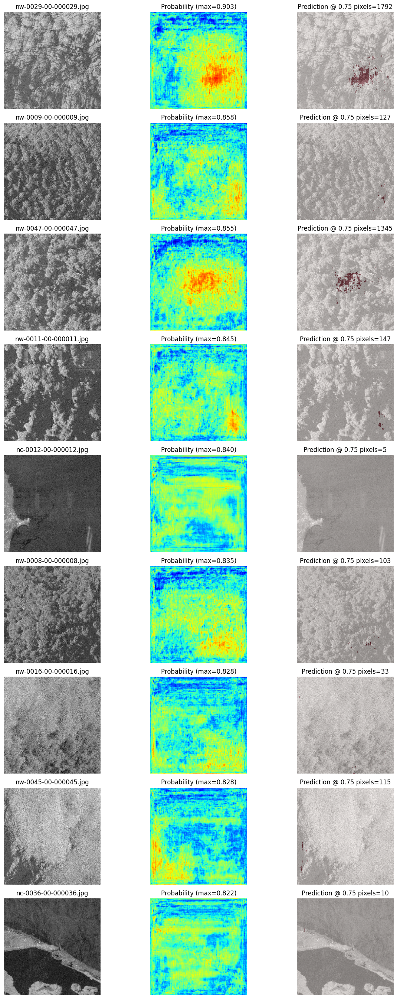


NEXT STEP


In [52]:
# ============================================================
# DARTIS HARD-NEGATIVE ANALYSIS
# SELF-CONTAINED VERSION
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# 1. CONFIG
# ============================================================

MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

IMG_SIZE = 256

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)


print("=" * 70)
print("DARTIS HARD-NEGATIVE ANALYSIS")
print("=" * 70)

print("Model :", MODEL_PATH)
print("Device:", DEVICE)
print("Data  :", DARTIS_DIR)


# ============================================================
# 2. LOAD CURRENT MODEL
# ============================================================

print("\nLoading current model...")

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
    activation=None
)

checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE,
    weights_only=False
)


# ------------------------------------------------------------
# Handle checkpoint formats
# ------------------------------------------------------------

if isinstance(checkpoint, dict):

    if "model_state_dict" in checkpoint:
        state_dict = checkpoint["model_state_dict"]

    elif "state_dict" in checkpoint:
        state_dict = checkpoint["state_dict"]

    else:
        state_dict = checkpoint

else:

    state_dict = checkpoint


# ------------------------------------------------------------
# Remove "module." prefix if checkpoint came from
# DataParallel
# ------------------------------------------------------------

clean_state_dict = {}

for key, value in state_dict.items():

    if key.startswith("module."):
        key = key.replace(
            "module.",
            "",
            1
        )

    clean_state_dict[key] = value


model.load_state_dict(
    clean_state_dict
)

model = model.to(
    DEVICE
)

model.eval()

print("✅ Model loaded successfully")


# ============================================================
# 3. FIND NW / NC IMAGES
# ============================================================

NW_IMAGES = sorted([
    p for p in DARTIS_DIR.iterdir()
    if p.is_file()
    and p.name.lower().startswith("nw-")
])

NC_IMAGES = sorted([
    p for p in DARTIS_DIR.iterdir()
    if p.is_file()
    and p.name.lower().startswith("nc-")
])


print()
print("=" * 70)
print("DARTIS INVENTORY")
print("=" * 70)

print("NW images:", len(NW_IMAGES))
print("NC images:", len(NC_IMAGES))

all_negative_images = (
    NW_IMAGES +
    NC_IMAGES
)

print(
    "Total hard negatives:",
    len(all_negative_images)
)


# ============================================================
# 4. MODEL PREPROCESSING
# ============================================================
#
# EXACT MATCH TO YOUR SOS TRAINING PIPELINE:
#
# grayscale
# → 256x256
# → /255
# → (x - 0.5) / 0.5
# ============================================================

def preprocess(
    image_path
):

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        raise RuntimeError(
            f"Could not read image: {image_path}"
        )

    image = cv2.resize(
        image,
        (IMG_SIZE, IMG_SIZE),
        interpolation=cv2.INTER_LINEAR
    )

    image = (
        image.astype(
            np.float32
        ) / 255.0
    )

    image = (
        image - 0.5
    ) / 0.5

    tensor = torch.from_numpy(
        image
    ).float()

    tensor = tensor.unsqueeze(0).unsqueeze(0)

    return tensor.to(DEVICE)


# ============================================================
# 5. RUN INFERENCE
# ============================================================

results = []

print()
print("=" * 70)
print("RUNNING MODEL ON NW + NC")
print("=" * 70)

with torch.no_grad():

    for image_path in tqdm(
        all_negative_images,
        desc="Analyzing"
    ):

        x = preprocess(
            image_path
        )

        logits = model(x)

        probability = torch.sigmoid(
            logits
        ).squeeze().cpu().numpy()


        # ----------------------------------------------------
        # Pixel counts at different thresholds
        # ----------------------------------------------------

        pixels_050 = int(
            (probability >= 0.50).sum()
        )

        pixels_075 = int(
            (probability >= 0.75).sum()
        )

        pixels_080 = int(
            (probability >= 0.80).sum()
        )

        pixels_085 = int(
            (probability >= 0.85).sum()
        )

        pixels_090 = int(
            (probability >= 0.90).sum()
        )

        pixels_095 = int(
            (probability >= 0.95).sum()
        )


        # ----------------------------------------------------
        # Save statistics
        # ----------------------------------------------------

        results.append({

            "filename":
                image_path.name,

            "subset":
                image_path.name[:2].upper(),

            "max_probability":
                float(
                    probability.max()
                ),

            "mean_probability":
                float(
                    probability.mean()
                ),

            "pixels_050":
                pixels_050,

            "pixels_075":
                pixels_075,

            "pixels_080":
                pixels_080,

            "pixels_085":
                pixels_085,

            "pixels_090":
                pixels_090,

            "pixels_095":
                pixels_095,

            "fraction_075":
                pixels_075 / (
                    IMG_SIZE * IMG_SIZE
                ),

            "fraction_085":
                pixels_085 / (
                    IMG_SIZE * IMG_SIZE
                ),

            "fraction_090":
                pixels_090 / (
                    IMG_SIZE * IMG_SIZE
                )
        })


dartis_neg_df = pd.DataFrame(
    results
)


# ============================================================
# 6. SORT BY MOST CONFIDENT FALSE POSITIVES
# ============================================================

dartis_neg_df = (
    dartis_neg_df
    .sort_values(
        [
            "max_probability",
            "pixels_075"
        ],
        ascending=False
    )
    .reset_index(drop=True)
)


# ============================================================
# 7. DISPLAY TOP FALSE POSITIVES
# ============================================================

print()
print("=" * 70)
print("TOP 25 STRONGEST MODEL RESPONSES")
print("=" * 70)

display(
    dartis_neg_df.head(25)
)


# ============================================================
# 8. SUMMARY AT DIFFERENT THRESHOLDS
# ============================================================

print()
print("=" * 70)
print("FALSE-POSITIVE SUMMARY")
print("=" * 70)


# Image is considered predicted positive if >= 50 pixels
MIN_PIXELS = 50

for threshold_name in [
    "pixels_050",
    "pixels_075",
    "pixels_080",
    "pixels_085",
    "pixels_090",
    "pixels_095"
]:

    false_positive_count = int(
        (
            dartis_neg_df[threshold_name]
            >= MIN_PIXELS
        ).sum()
    )

    print(
        f"{threshold_name:15s} : "
        f"{false_positive_count:3d} / "
        f"{len(dartis_neg_df)}"
    )


# ============================================================
# 9. NW VS NC
# ============================================================

print()
print("=" * 70)
print("NW VS NC")
print("=" * 70)

subset_summary = (
    dartis_neg_df
    .groupby("subset")
    .agg(

        images=(
            "filename",
            "count"
        ),

        mean_max_probability=(
            "max_probability",
            "mean"
        ),

        max_probability=(
            "max_probability",
            "max"
        ),

        mean_pixels_075=(
            "pixels_075",
            "mean"
        ),

        mean_pixels_085=(
            "pixels_085",
            "mean"
        ),

        mean_pixels_090=(
            "pixels_090",
            "mean"
        ),

        fp_075=(
            "pixels_075",
            lambda x:
                int(
                    (x >= MIN_PIXELS).sum()
                )
        ),

        fp_085=(
            "pixels_085",
            lambda x:
                int(
                    (x >= MIN_PIXELS).sum()
                )
        ),

        fp_090=(
            "pixels_090",
            lambda x:
                int(
                    (x >= MIN_PIXELS).sum()
                )
        )
    )
    .reset_index()
)

display(
    subset_summary.round(4)
)


# ============================================================
# 10. SAVE CSV
# ============================================================

OUTPUT = (
    "/kaggle/working/"
    "dartis_hard_negative_analysis.csv"
)

dartis_neg_df.to_csv(
    OUTPUT,
    index=False
)

print(
    f"\n✅ Analysis saved to:\n{OUTPUT}"
)


# ============================================================
# 11. VISUALIZE THE WORST FALSE POSITIVES
# ============================================================

import matplotlib.pyplot as plt

TOP_N = min(
    9,
    len(dartis_neg_df)
)

if TOP_N > 0:

    top_rows = dartis_neg_df.head(
        TOP_N
    )

    fig, axes = plt.subplots(
        TOP_N,
        3,
        figsize=(13, TOP_N * 3)
    )

    if TOP_N == 1:
        axes = np.expand_dims(
            axes,
            axis=0
        )


    with torch.no_grad():

        for row_idx, (_, row) in enumerate(
            top_rows.iterrows()
        ):

            path = (
                DARTIS_DIR /
                row["filename"]
            )

            image = cv2.imread(
                str(path),
                cv2.IMREAD_GRAYSCALE
            )

            image_256 = cv2.resize(
                image,
                (IMG_SIZE, IMG_SIZE)
            )

            x = preprocess(
                path
            )

            logits = model(x)

            probability = torch.sigmoid(
                logits
            ).squeeze().cpu().numpy()


            mask = (
                probability >= 0.75
            ).astype(np.uint8)


            # ------------------------------------------------
            # Original
            # ------------------------------------------------

            axes[row_idx, 0].imshow(
                image_256,
                cmap="gray"
            )

            axes[row_idx, 0].set_title(
                row["filename"]
            )

            axes[row_idx, 0].axis(
                "off"
            )


            # ------------------------------------------------
            # Probability
            # ------------------------------------------------

            axes[row_idx, 1].imshow(
                probability,
                cmap="jet",
                vmin=0,
                vmax=1
            )

            axes[row_idx, 1].set_title(
                f"Probability "
                f"(max={probability.max():.3f})"
            )

            axes[row_idx, 1].axis(
                "off"
            )


            # ------------------------------------------------
            # Overlay
            # ------------------------------------------------

            axes[row_idx, 2].imshow(
                image_256,
                cmap="gray"
            )

            axes[row_idx, 2].imshow(
                mask,
                cmap="Reds",
                alpha=0.45
            )

            axes[row_idx, 2].set_title(
                f"Prediction @ 0.75 "
                f"pixels={int(mask.sum())}"
            )

            axes[row_idx, 2].axis(
                "off"
            )


    plt.tight_layout()
    plt.show()


print()
print("=" * 70)
print("NEXT STEP")
print("=" * 70)



In [53]:
# ============================================================
# DARTIS NW / NC DOWNLOAD
# SELF-CONTAINED VERSION
#
# Downloads:
#   NW -> 400 images
#   NC -> ALL available images
#
# Automatically skips files already downloaded.
# ============================================================

import pandas as pd
import requests
import time
import random

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# 1. PATHS
# ============================================================

META_PATH = Path(
    "/kaggle/working/DARTIS_2019.tab"
)

IMAGE_DIR = Path(
    "/kaggle/working/dartis_images"
)

IMAGE_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. CONFIG
# ============================================================

NW_TARGET = 400

SEED = 42

random.seed(SEED)

PANGAEA_BASE = (
    "https://download.pangaea.de/"
    "dataset/980773/files"
)


# ============================================================
# 3. LOAD DARTIS METADATA
# ============================================================

print("=" * 70)
print("LOADING DARTIS METADATA")
print("=" * 70)

if not META_PATH.exists():
    raise FileNotFoundError(
        f"Metadata file not found:\n{META_PATH}"
    )

df = pd.read_csv(
    META_PATH,
    sep="\t",
    skiprows=49,
    low_memory=False
)

print(
    "Metadata rows:",
    len(df)
)


# ============================================================
# 4. COLUMN NAMES
# ============================================================

IMAGE_COL = (
    "IMAGE (jpg_file)"
)

SUBSET_COL = (
    "Image set (subset; oc : oil/coast; ow : ...)"
)

required_columns = [
    IMAGE_COL,
    SUBSET_COL
]

missing = [
    c for c in required_columns
    if c not in df.columns
]

if missing:

    raise RuntimeError(
        "Missing required metadata columns:\n"
        + "\n".join(missing)
    )


# ============================================================
# 5. UNIQUE IMAGES
# ============================================================

unique_df = (
    df[
        [
            IMAGE_COL,
            SUBSET_COL
        ]
    ]
    .drop_duplicates(
        subset=[IMAGE_COL]
    )
    .copy()
)

unique_df[IMAGE_COL] = (
    unique_df[IMAGE_COL]
    .astype(str)
    .str.strip()
)

unique_df[SUBSET_COL] = (
    unique_df[SUBSET_COL]
    .astype(str)
    .str.strip()
)


# ============================================================
# 6. GET ALL NW / NC
# ============================================================

nw_all = sorted(
    unique_df[
        unique_df[IMAGE_COL]
        .str.lower()
        .str.startswith("nw-")
    ][IMAGE_COL]
    .unique()
    .tolist()
)

nc_all = sorted(
    unique_df[
        unique_df[IMAGE_COL]
        .str.lower()
        .str.startswith("nc-")
    ][IMAGE_COL]
    .unique()
    .tolist()
)


print()
print("=" * 70)
print("AVAILABLE DARTIS HARD NEGATIVES")
print("=" * 70)

print(
    "NW available:",
    len(nw_all)
)

print(
    "NC available:",
    len(nc_all)
)


# ============================================================
# 7. SELECT NW
# ============================================================

nw_selected = nw_all.copy()

random.shuffle(
    nw_selected
)

nw_selected = sorted(
    nw_selected[
        :min(
            NW_TARGET,
            len(nw_selected)
        )
    ]
)


# ALL NC
nc_selected = nc_all.copy()


print()
print("=" * 70)
print("TARGET")
print("=" * 70)

print(
    "NW selected:",
    len(nw_selected)
)

print(
    "NC selected:",
    len(nc_selected)
)

print(
    "Total target:",
    len(nw_selected) +
    len(nc_selected)
)


# ============================================================
# 8. CHECK EXISTING FILES
# ============================================================

existing_files = {
    p.name
    for p in IMAGE_DIR.iterdir()
    if p.is_file()
}


nw_existing = sum(
    name in existing_files
    for name in nw_selected
)

nc_existing = sum(
    name in existing_files
    for name in nc_selected
)


print()
print("=" * 70)
print("EXISTING FILES")
print("=" * 70)

print(
    "NW already present:",
    nw_existing
)

print(
    "NC already present:",
    nc_existing
)

print()
print(
    "NW to download:",
    len(nw_selected) - nw_existing
)

print(
    "NC to download:",
    len(nc_selected) - nc_existing
)


# ============================================================
# 9. HTTP SESSION
# ============================================================

session = requests.Session()

session.headers.update({
    "User-Agent":
        "DARTIS-hard-negative-research/1.0"
})


# ============================================================
# 10. DOWNLOAD FUNCTION
# ============================================================

def download_images(
    filenames,
    subset_name
):

    downloaded = 0
    skipped = 0
    failed = 0

    print()
    print("=" * 70)
    print(
        f"DOWNLOADING {subset_name}"
    )
    print("=" * 70)

    for filename in tqdm(
        filenames,
        desc=f"{subset_name}",
        unit="img"
    ):

        output_path = (
            IMAGE_DIR /
            filename
        )

        # ----------------------------------------------------
        # Already downloaded
        # ----------------------------------------------------

        if output_path.exists():

            skipped += 1

            continue


        url = (
            f"{PANGAEA_BASE}/{filename}"
        )

        try:

            response = session.get(
                url,
                timeout=60
            )

            if response.status_code != 200:

                print(
                    f"\n❌ {filename} "
                    f"HTTP {response.status_code}"
                )

                failed += 1

                continue


            # ------------------------------------------------
            # Basic sanity check
            # ------------------------------------------------

            if len(response.content) < 1000:

                print(
                    f"\n❌ Suspiciously small file: "
                    f"{filename}"
                )

                failed += 1

                continue


            output_path.write_bytes(
                response.content
            )

            downloaded += 1


        except Exception as e:

            print(
                f"\n❌ Error downloading "
                f"{filename}: {e}"
            )

            failed += 1


        # Small delay
        time.sleep(0.2)


    return {
        "downloaded": downloaded,
        "skipped": skipped,
        "failed": failed
    }


# ============================================================
# 11. DOWNLOAD NW
# ============================================================

nw_stats = download_images(
    nw_selected,
    "NW"
)


# ============================================================
# 12. DOWNLOAD NC
# ============================================================

nc_stats = download_images(
    nc_selected,
    "NC"
)


# ============================================================
# 13. FINAL INVENTORY
# ============================================================

final_files = [
    p
    for p in IMAGE_DIR.iterdir()
    if p.is_file()
]


final_nw = [
    p for p in final_files
    if p.name.lower().startswith("nw-")
]

final_nc = [
    p for p in final_files
    if p.name.lower().startswith("nc-")
]

final_ow = [
    p for p in final_files
    if p.name.lower().startswith("ow-")
]

final_oc = [
    p for p in final_files
    if p.name.lower().startswith("oc-")
]


# ============================================================
# 14. SUMMARY
# ============================================================

print()
print("=" * 70)
print("DOWNLOAD SUMMARY")
print("=" * 70)

print()
print("NW")
print(
    "  Downloaded:",
    nw_stats["downloaded"]
)

print(
    "  Skipped:",
    nw_stats["skipped"]
)

print(
    "  Failed:",
    nw_stats["failed"]
)

print(
    "  Final files:",
    len(final_nw)
)


print()
print("NC")
print(
    "  Downloaded:",
    nc_stats["downloaded"]
)

print(
    "  Skipped:",
    nc_stats["skipped"]
)

print(
    "  Failed:",
    nc_stats["failed"]
)

print(
    "  Final files:",
    len(final_nc)
)


print()
print("=" * 70)
print("FINAL DARTIS INVENTORY")
print("=" * 70)

print(
    "OW:",
    len(final_ow)
)

print(
    "OC:",
    len(final_oc)
)

print(
    "NW:",
    len(final_nw)
)

print(
    "NC:",
    len(final_nc)
)

print(
    "TOTAL:",
    len(final_files)
)


# ============================================================
# 15. FINAL CHECK
# ============================================================

print()
print("=" * 70)
print("TARGET CHECK")
print("=" * 70)

if len(final_nw) >= len(nw_selected):
    print("✅ NW target reached")
else:
    print("⚠️ NW target NOT reached")

if len(final_nc) >= len(nc_selected):
    print("✅ All NC downloaded")
else:
    print("⚠️ NC target NOT reached")


print()
print(
    "Images stored in:",
    IMAGE_DIR
)

LOADING DARTIS METADATA
Metadata rows: 5515

AVAILABLE DARTIS HARD NEGATIVES
NW available: 1939
NC available: 351

TARGET
NW selected: 400
NC selected: 351
Total target: 751

EXISTING FILES
NW already present: 8
NC already present: 50

NW to download: 392
NC to download: 301

DOWNLOADING NW


NW:   0%|          | 0/400 [00:00<?, ?img/s]


DOWNLOADING NC


NC:   0%|          | 0/351 [00:00<?, ?img/s]


DOWNLOAD SUMMARY

NW
  Downloaded: 392
  Skipped: 8
  Failed: 0
  Final files: 442

NC
  Downloaded: 301
  Skipped: 50
  Failed: 0
  Final files: 351

FINAL DARTIS INVENTORY
OW: 50
OC: 50
NW: 442
NC: 351
TOTAL: 893

TARGET CHECK
✅ NW target reached
✅ All NC downloaded

Images stored in: /kaggle/working/dartis_images


# now in the previous cell the datset for the dartis has been imported



# FINAL DARTIS FINE-TUNING SPLIT

In [54]:
# ============================================================
# CELL — BUILD FINAL DARTIS FINE-TUNING SPLIT
#
# IMPORTANT:
# The original 100-image benchmark is NEVER used for training.
#
# Existing benchmark:
#   NW = 50
#   NC = 50
#
# New DARTIS data:
#   NW/NC remaining images
#
# We split the NEW data into:
#   80% hard-negative training
#   20% hard-negative validation
# ============================================================

import random
import pandas as pd
import numpy as np
import cv2

from pathlib import Path


# ============================================================
# CONFIG
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)


# ============================================================
# PATHS
# ============================================================

SOS_TRAIN_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/train"
)

SOS_TRAIN_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/train"
)

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)


# ============================================================
# ORIGINAL DARTIS BENCHMARK
#
# These must NEVER enter fine-tuning.
# ============================================================

benchmark_nw = {
    f"nw-{i:04d}-00-{i:06d}.jpg"
    for i in range(1, 51)
}

benchmark_nc = {
    f"nc-{i:04d}-00-{i:06d}.jpg"
    for i in range(1, 51)
}

benchmark_files = (
    benchmark_nw |
    benchmark_nc
)


print("=" * 70)
print("PROTECTED DARTIS BENCHMARK")
print("=" * 70)

print(
    "Protected NW:",
    len(benchmark_nw)
)

print(
    "Protected NC:",
    len(benchmark_nc)
)

print(
    "Protected total:",
    len(benchmark_files)
)


# ============================================================
# HELPER
# ============================================================

EXTENSIONS = {
    ".png",
    ".jpg",
    ".jpeg",
    ".tif",
    ".tiff"
}


def image_files(directory):

    return sorted([
        p
        for p in directory.iterdir()
        if p.is_file()
        and p.suffix.lower() in EXTENSIONS
    ])


# ============================================================
# VERIFY DARTIS DIRECTORY
# ============================================================

if not DARTIS_DIR.exists():

    raise FileNotFoundError(
        f"DARTIS directory not found:\n{DARTIS_DIR}"
    )


all_dartis = image_files(
    DARTIS_DIR
)


dartis_nw = sorted([
    p
    for p in all_dartis
    if p.name.lower().startswith("nw-")
])


dartis_nc = sorted([
    p
    for p in all_dartis
    if p.name.lower().startswith("nc-")
])


print()
print("=" * 70)
print("DARTIS INVENTORY")
print("=" * 70)

print(
    "NW files:",
    len(dartis_nw)
)

print(
    "NC files:",
    len(dartis_nc)
)


# ============================================================
# REMOVE BENCHMARK FROM FINE-TUNING POOL
# ============================================================

nw_available = [
    p
    for p in dartis_nw
    if p.name not in benchmark_files
]

nc_available = [
    p
    for p in dartis_nc
    if p.name not in benchmark_files
]


print()
print("=" * 70)
print("AFTER PROTECTING BENCHMARK")
print("=" * 70)

print(
    "NW available for fine-tuning:",
    len(nw_available)
)

print(
    "NC available for fine-tuning:",
    len(nc_available)
)


# ============================================================
# COMBINE
# ============================================================

dartis_available = (
    nw_available +
    nc_available
)

random.shuffle(
    dartis_available
)


# ============================================================
# 80/20 DARTIS SPLIT
# ============================================================

holdout_count = int(
    len(dartis_available) * 0.20
)


dartis_holdout = (
    dartis_available[
        :holdout_count
    ]
)


dartis_hard_train = (
    dartis_available[
        holdout_count:
    ]
)


# ============================================================
# SAFETY CHECK
# ============================================================

train_names = {
    p.name
    for p in dartis_hard_train
}

holdout_names = {
    p.name
    for p in dartis_holdout
}


assert not (
    train_names &
    set(benchmark_files)
), "ERROR: Benchmark leaked into training!"


assert not (
    holdout_names &
    set(benchmark_files)
), "ERROR: Benchmark leaked into holdout!"


assert not (
    train_names &
    holdout_names
), "ERROR: Train/holdout overlap!"


# ============================================================
# DISTRIBUTION
# ============================================================

train_nw = sum(
    p.name.lower().startswith("nw-")
    for p in dartis_hard_train
)

train_nc = sum(
    p.name.lower().startswith("nc-")
    for p in dartis_hard_train
)

holdout_nw = sum(
    p.name.lower().startswith("nw-")
    for p in dartis_holdout
)

holdout_nc = sum(
    p.name.lower().startswith("nc-")
    for p in dartis_holdout
)


print()
print("=" * 70)
print("DARTIS FINE-TUNING SPLIT")
print("=" * 70)

print()
print("TRAIN")
print(
    "  NW:",
    train_nw
)

print(
    "  NC:",
    train_nc
)

print(
    "  Total:",
    len(dartis_hard_train)
)

print()
print("HOLDOUT")
print(
    "  NW:",
    holdout_nw
)

print(
    "  NC:",
    holdout_nc
)

print(
    "  Total:",
    len(dartis_holdout)
)


# ============================================================
# SOS IMAGE/MASK PAIRS
# ============================================================

sos_train_images = image_files(
    SOS_TRAIN_IMG
)

sos_train_masks = image_files(
    SOS_TRAIN_MSK
)


mask_by_name = {
    p.name: p
    for p in sos_train_masks
}


sos_positive = []
sos_negative = []


print()
print("=" * 70)
print("ANALYZING SOS TRAINING DATA")
print("=" * 70)


for image_path in tqdm(
    sos_train_images,
    desc="Reading SOS masks"
):

    mask_path = mask_by_name.get(
        image_path.name
    )

    if mask_path is None:
        continue


    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        continue


    oil_pixels = np.count_nonzero(
        mask > 127
    )


    if oil_pixels > 0:

        sos_positive.append(
            (
                image_path,
                mask_path
            )
        )

    else:

        sos_negative.append(
            (
                image_path,
                mask_path
            )
        )


# ============================================================
# SELECT SOS DATA
# ============================================================

MAX_SOS_POSITIVE = 2000

MAX_SOS_NEGATIVE = 255


random.shuffle(
    sos_positive
)

random.shuffle(
    sos_negative
)


sos_positive_ft = (
    sos_positive[
        :min(
            MAX_SOS_POSITIVE,
            len(sos_positive)
        )
    ]
)


sos_negative_ft = (
    sos_negative[
        :min(
            MAX_SOS_NEGATIVE,
            len(sos_negative)
        )
    ]
)


# ============================================================
# FINAL SUMMARY
# ============================================================

print()
print("=" * 70)
print("FINAL FINE-TUNING DATA")
print("=" * 70)

print()
print("SOS positive:",
      len(sos_positive_ft))

print("SOS negative:",
      len(sos_negative_ft))

print("DARTIS NW:",
      train_nw)

print("DARTIS NC:",
      train_nc)

print("DARTIS hard negatives:",
      len(dartis_hard_train))

print()
print(
    "TOTAL TRAINING IMAGES:",
    (
        len(sos_positive_ft)
        +
        len(sos_negative_ft)
        +
        len(dartis_hard_train)
    )
)


# ============================================================
# SAVE SPLITS
# ============================================================

train_df = pd.DataFrame({

    "filename": [
        p.name
        for p in dartis_hard_train
    ],

    "subset": [
        p.name[:2].upper()
        for p in dartis_hard_train
    ],

    "split": "train"
})


holdout_df = pd.DataFrame({

    "filename": [
        p.name
        for p in dartis_holdout
    ],

    "subset": [
        p.name[:2].upper()
        for p in dartis_holdout
    ],

    "split": "holdout"
})


train_df.to_csv(
    "/kaggle/working/dartis_finetune_train.csv",
    index=False
)


holdout_df.to_csv(
    "/kaggle/working/dartis_finetune_holdout.csv",
    index=False
)


print()
print("=" * 70)
print("FILES SAVED")
print("=" * 70)

print(
    "/kaggle/working/dartis_finetune_train.csv"
)

print(
    "/kaggle/working/dartis_finetune_holdout.csv"
)

print()
print("✅ Split created successfully.")
print("✅ Original 100-image benchmark protected.")

PROTECTED DARTIS BENCHMARK
Protected NW: 50
Protected NC: 50
Protected total: 100

DARTIS INVENTORY
NW files: 442
NC files: 351

AFTER PROTECTING BENCHMARK
NW available for fine-tuning: 392
NC available for fine-tuning: 301

DARTIS FINE-TUNING SPLIT

TRAIN
  NW: 305
  NC: 250
  Total: 555

HOLDOUT
  NW: 87
  NC: 51
  Total: 138

ANALYZING SOS TRAINING DATA


Reading SOS masks:   0%|          | 0/6455 [00:00<?, ?it/s]


FINAL FINE-TUNING DATA

SOS positive: 2000
SOS negative: 255
DARTIS NW: 305
DARTIS NC: 250
DARTIS hard negatives: 555

TOTAL TRAINING IMAGES: 2810

FILES SAVED
/kaggle/working/dartis_finetune_train.csv
/kaggle/working/dartis_finetune_holdout.csv

✅ Split created successfully.
✅ Original 100-image benchmark protected.


# BUILD MIXED SOS + DARTIS DATASET / DATALOADER

BUILDING MIXED FINE-TUNING DATASET

DATASET CREATED
SOS positive: 2000
SOS negative: 255
DARTIS hard-negative: 555
TOTAL: 2810

DARTIS holdout: 138

Fine-tune batches: 352
Holdout batches: 18

SOURCE DISTRIBUTION
SOS_POSITIVE        : 2000
DARTIS_NEGATIVE     : 555
SOS_NEGATIVE        : 255

CHECKING FIRST BATCH


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Image tensor shape: torch.Size([8, 1, 256, 256])
Mask tensor shape : torch.Size([8, 1, 256, 256])
Image dtype       : torch.float32
Mask dtype        : torch.float32
Image min/max     : -1.0 1.0
Mask min/max      : 0.0 1.0

✅ DARTIS holdout masks are all zero.


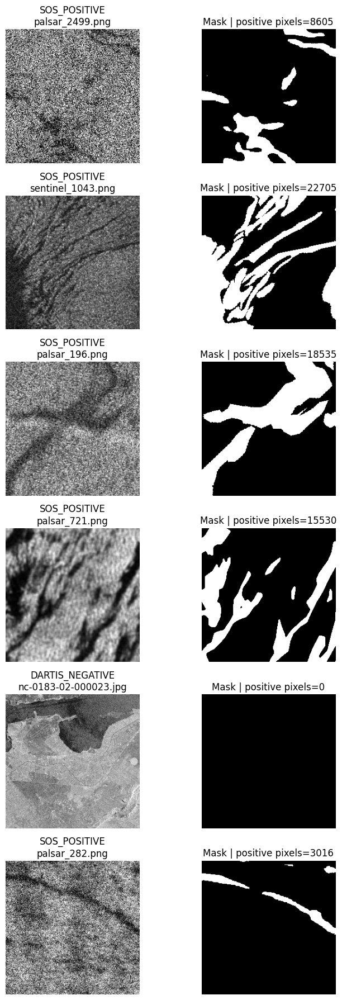

✅ balanced_loader linked to fine_tune_loader
Training batches: 352

✅ MIXED DATASET / DATALOADER READY


In [55]:
# ============================================================
# CELL — BUILD MIXED SOS + DARTIS DATASET / DATALOADER
# ============================================================
#
# SOS:
#   real image + real segmentation mask
#
# DARTIS NW/NC:
#   image + ZERO mask
#
# Preprocessing:
#   grayscale
#   resize 256x256
#   normalize: (x/255 - 0.5) / 0.5
#
# IMPORTANT:
#   We apply preprocessing ON THE FLY.
#   DARTIS images do NOT need to be preprocessed beforehand.
# ============================================================

import cv2
import numpy as np
import torch
import albumentations as A

from pathlib import Path
from torch.utils.data import Dataset, DataLoader


# ============================================================
# 1. CONFIG
# ============================================================

IMG_SIZE = 256
BATCH_SIZE = 8

NUM_WORKERS = 2

print("=" * 70)
print("BUILDING MIXED FINE-TUNING DATASET")
print("=" * 70)


# ============================================================
# 2. PATHS
# ============================================================

SOS_TRAIN_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/train"
)

SOS_TRAIN_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/train"
)

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)


# ============================================================
# 3. MAKE SURE PREVIOUS SPLIT VARIABLES EXIST
# ============================================================

required_variables = [
    "sos_positive_ft",
    "sos_negative_ft",
    "dartis_hard_train",
    "dartis_holdout"
]

missing_variables = [
    name
    for name in required_variables
    if name not in globals()
]

if missing_variables:
    raise RuntimeError(
        "The following variables are missing:\n"
        + "\n".join(missing_variables)
        + "\n\nRun the previous FINAL FINE-TUNING SPLIT cell first."
    )


# ============================================================
# 4. AUGMENTATION
#
# Same augmentation family as your original SOS training.
# Image and mask are transformed together.
# ============================================================

train_transform = A.Compose([

    A.HorizontalFlip(
        p=0.5
    ),

    A.VerticalFlip(
        p=0.5
    ),

    A.RandomRotate90(
        p=0.5
    ),

    A.ShiftScaleRotate(
        shift_limit=0.0625,
        scale_limit=0.10,
        rotate_limit=15,
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_REFLECT_101,
        p=0.35
    ),

    A.RandomBrightnessContrast(
        brightness_limit=0.15,
        contrast_limit=0.15,
        p=0.30
    ),

    A.GaussNoise(
        p=0.20
    ),

    A.Resize(
        IMG_SIZE,
        IMG_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST
    ),

    A.Normalize(
        mean=(0.5,),
        std=(0.5,)
    )

])


# ============================================================
# 5. VALIDATION TRANSFORM
# ============================================================

val_transform = A.Compose([

    A.Resize(
        IMG_SIZE,
        IMG_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST
    ),

    A.Normalize(
        mean=(0.5,),
        std=(0.5,)
    )

])


# ============================================================
# 6. MIXED DATASET
# ============================================================

class MixedFineTuneDataset(Dataset):

    def __init__(
        self,
        sos_positive,
        sos_negative,
        dartis_negative,
        transform=None
    ):

        self.items = []

        # ----------------------------------------------------
        # SOS POSITIVE
        # ----------------------------------------------------

        for image_path, mask_path in sos_positive:

            self.items.append({
                "image": Path(image_path),
                "mask": Path(mask_path),
                "source": "SOS_POSITIVE"
            })


        # ----------------------------------------------------
        # SOS NEGATIVE
        # ----------------------------------------------------

        for image_path, mask_path in sos_negative:

            self.items.append({
                "image": Path(image_path),
                "mask": Path(mask_path),
                "source": "SOS_NEGATIVE"
            })


        # ----------------------------------------------------
        # DARTIS HARD NEGATIVE
        #
        # No DARTIS mask required.
        # We generate an all-zero target.
        # ----------------------------------------------------

        for image_path in dartis_negative:

            self.items.append({
                "image": Path(image_path),
                "mask": None,
                "source": "DARTIS_NEGATIVE"
            })


        self.transform = transform


        # ----------------------------------------------------
        # Shuffle once
        # ----------------------------------------------------

        rng = np.random.default_rng(
            42
        )

        rng.shuffle(
            self.items
        )


    def __len__(self):

        return len(self.items)


    def __getitem__(self, index):

        item = self.items[index]


        # ====================================================
        # LOAD IMAGE
        # ====================================================

        image = cv2.imread(
            str(item["image"]),
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:

            raise RuntimeError(
                f"Could not read image:\n"
                f"{item['image']}"
            )


        # ====================================================
        # LOAD / CREATE MASK
        # ====================================================

        if item["mask"] is None:

            # -----------------------------------------------
            # DARTIS NW / NC
            # Guaranteed NO OIL
            # -----------------------------------------------

            mask = np.zeros_like(
                image,
                dtype=np.uint8
            )

        else:

            mask = cv2.imread(
                str(item["mask"]),
                cv2.IMREAD_GRAYSCALE
            )

            if mask is None:

                raise RuntimeError(
                    f"Could not read mask:\n"
                    f"{item['mask']}"
                )

            mask = (
                mask > 127
            ).astype(
                np.uint8
            )


        # ====================================================
        # APPLY TRANSFORM
        # ====================================================

        if self.transform is not None:

            transformed = self.transform(
                image=image,
                mask=mask
            )

            image = transformed[
                "image"
            ]

            mask = transformed[
                "mask"
            ]


        # ====================================================
        # CONVERT TO TENSOR
        # ====================================================

        if not torch.is_tensor(image):

            image = torch.from_numpy(
                image
            )

        if not torch.is_tensor(mask):

            mask = torch.from_numpy(
                mask
            )


        image = image.float()
        mask = mask.float()


        # ----------------------------------------------------
        # Channel dimensions
        # ----------------------------------------------------

        if image.ndim == 2:

            image = image.unsqueeze(0)


        if mask.ndim == 2:

            mask = mask.unsqueeze(0)


        return {
            "image": image,
            "mask": mask,
            "source": item["source"],
            "filename": item["image"].name
        }


# ============================================================
# 7. HOLDOUT DATASET
# ============================================================

class DARTISHoldoutDataset(Dataset):

    def __init__(
        self,
        image_paths,
        transform=None
    ):

        self.image_paths = [
            Path(p)
            for p in image_paths
        ]

        self.transform = transform


    def __len__(self):

        return len(
            self.image_paths
        )


    def __getitem__(self, index):

        image_path = (
            self.image_paths[index]
        )

        image = cv2.imread(
            str(image_path),
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:

            raise RuntimeError(
                f"Could not read:\n"
                f"{image_path}"
            )


        # All holdout images are NW/NC
        # therefore target = zero mask.

        mask = np.zeros_like(
            image,
            dtype=np.uint8
        )


        if self.transform is not None:

            transformed = self.transform(
                image=image,
                mask=mask
            )

            image = transformed[
                "image"
            ]

            mask = transformed[
                "mask"
            ]


        image = torch.from_numpy(
            image
        ).float()

        mask = torch.from_numpy(
            mask
        ).float()


        if image.ndim == 2:

            image = image.unsqueeze(0)


        if mask.ndim == 2:

            mask = mask.unsqueeze(0)


        return {
            "image": image,
            "mask": mask,
            "filename": image_path.name
        }


# ============================================================
# 8. CREATE TRAINING DATASET
# ============================================================

fine_tune_dataset = MixedFineTuneDataset(

    sos_positive=sos_positive_ft,

    sos_negative=sos_negative_ft,

    dartis_negative=dartis_hard_train,

    transform=train_transform
)


# ============================================================
# 9. CREATE HOLDOUT DATASET
# ============================================================

dartis_holdout_dataset = DARTISHoldoutDataset(

    image_paths=dartis_holdout,

    transform=val_transform
)


# ============================================================
# 10. CREATE DATALOADERS
# ============================================================

fine_tune_loader = DataLoader(

    fine_tune_dataset,

    batch_size=BATCH_SIZE,

    shuffle=True,

    num_workers=NUM_WORKERS,

    pin_memory=torch.cuda.is_available(),

    persistent_workers=(
        NUM_WORKERS > 0
    )
)


dartis_holdout_loader = DataLoader(

    dartis_holdout_dataset,

    batch_size=BATCH_SIZE,

    shuffle=False,

    num_workers=NUM_WORKERS,

    pin_memory=torch.cuda.is_available(),

    persistent_workers=(
        NUM_WORKERS > 0
    )
)


# ============================================================
# 11. REPORT
# ============================================================

print()
print("=" * 70)
print("DATASET CREATED")
print("=" * 70)

print(
    "SOS positive:",
    len(sos_positive_ft)
)

print(
    "SOS negative:",
    len(sos_negative_ft)
)

print(
    "DARTIS hard-negative:",
    len(dartis_hard_train)
)

print(
    "TOTAL:",
    len(fine_tune_dataset)
)

print()
print(
    "DARTIS holdout:",
    len(dartis_holdout_dataset)
)

print()
print(
    "Fine-tune batches:",
    len(fine_tune_loader)
)

print(
    "Holdout batches:",
    len(dartis_holdout_loader)
)


# ============================================================
# 12. SOURCE DISTRIBUTION
# ============================================================

source_counts = {}

for item in fine_tune_dataset.items:

    source = item["source"]

    source_counts[source] = (
        source_counts.get(
            source,
            0
        ) + 1
    )


print()
print("=" * 70)
print("SOURCE DISTRIBUTION")
print("=" * 70)

for source, count in source_counts.items():

    print(
        f"{source:20s}: {count}"
    )


# ============================================================
# 13. CHECK A FEW BATCHES
# ============================================================

print()
print("=" * 70)
print("CHECKING FIRST BATCH")
print("=" * 70)

batch = next(
    iter(fine_tune_loader)
)

print(
    "Image tensor shape:",
    batch["image"].shape
)

print(
    "Mask tensor shape :",
    batch["mask"].shape
)

print(
    "Image dtype       :",
    batch["image"].dtype
)

print(
    "Mask dtype        :",
    batch["mask"].dtype
)

print(
    "Image min/max     :",
    float(batch["image"].min()),
    float(batch["image"].max())
)

print(
    "Mask min/max      :",
    float(batch["mask"].min()),
    float(batch["mask"].max())
)


# ============================================================
# 14. VERIFY DARTIS ZERO MASKS
# ============================================================

dartis_zero_check = True

for i in range(
    min(20, len(dartis_holdout_dataset))
):

    sample = dartis_holdout_dataset[i]

    if sample["mask"].sum().item() != 0:

        dartis_zero_check = False

        print(
            "❌ Non-zero holdout mask:",
            sample["filename"]
        )


print()

if dartis_zero_check:

    print(
        "✅ DARTIS holdout masks are all zero."
    )

else:

    print(
        "❌ DARTIS zero-mask validation failed."
    )


# ============================================================
# 15. VISUAL CHECK OF MIXED SAMPLES
# ============================================================

import matplotlib.pyplot as plt

samples_to_show = min(
    6,
    len(fine_tune_dataset)
)

fig, axes = plt.subplots(
    samples_to_show,
    2,
    figsize=(8, samples_to_show * 3)
)

if samples_to_show == 1:

    axes = np.expand_dims(
        axes,
        axis=0
    )


for row_idx in range(
    samples_to_show
):

    sample = fine_tune_dataset[
        row_idx
    ]

    image = sample["image"][0].numpy()

    mask = sample["mask"][0].numpy()

    axes[row_idx, 0].imshow(
        image,
        cmap="gray"
    )

    axes[row_idx, 0].set_title(
        f"{sample['source']}\n"
        f"{sample['filename']}"
    )

    axes[row_idx, 0].axis(
        "off"
    )


    axes[row_idx, 1].imshow(
        mask,
        cmap="gray",
        vmin=0,
        vmax=1
    )

    axes[row_idx, 1].set_title(
        f"Mask | positive pixels="
        f"{int(mask.sum())}"
    )

    axes[row_idx, 1].axis(
        "off"
    )


plt.tight_layout()
plt.show()
# ============================================================
# FIX: CONNECT FINE-TUNE LOADER TO TRAINING LOOP
# ============================================================

balanced_loader = fine_tune_loader

print("✅ balanced_loader linked to fine_tune_loader")
print("Training batches:", len(balanced_loader))

print()
print("=" * 70)
print("✅ MIXED DATASET / DATALOADER READY")
print("=" * 70)

# load baseline + train with balanced sampling

In [56]:
# ============================================================
# FIX + RESTART HARD-NEGATIVE FINE-TUNING
# ============================================================
#
# Problem:
#   sos_val_loader was not created.
#
# This cell:
#   1. Creates the SOS validation dataset/loader
#   2. Reloads the ORIGINAL model
#   3. Recreates optimizer/scheduler
#   4. Runs a clean 5-epoch fine-tune
#   5. Evaluates SOS validation IoU
#   6. Evaluates DARTIS NW/NC holdout false positives
#   7. Saves the best checkpoint
# ============================================================

import cv2
import copy
import time
import numpy as np
import pandas as pd
import torch
import segmentation_models_pytorch as smp

from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm


# ============================================================
# 1. CONFIG
# ============================================================

MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

OUTPUT_PATH = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

IMG_SIZE = 256
BATCH_SIZE = 8

EPOCHS = 5
LEARNING_RATE = 1e-5
WEIGHT_DECAY = 1e-4

SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)


# ============================================================
# 2. PATHS
# ============================================================

SOS_VAL_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/val"
)

SOS_VAL_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/val"
)


# ============================================================
# 3. SOS VALIDATION DATASET
# ============================================================

EXTENSIONS = {
    ".png",
    ".jpg",
    ".jpeg",
    ".tif",
    ".tiff"
}


def get_files(folder):

    return sorted([
        p
        for p in folder.iterdir()
        if p.is_file()
        and p.suffix.lower() in EXTENSIONS
    ])


val_images = get_files(
    SOS_VAL_IMG
)

val_masks = get_files(
    SOS_VAL_MSK
)


val_mask_map = {
    p.name: p
    for p in val_masks
}


val_pairs = []

for image_path in val_images:

    mask_path = val_mask_map.get(
        image_path.name
    )

    if mask_path is not None:
        val_pairs.append(
            (
                image_path,
                mask_path
            )
        )


print("=" * 70)
print("SOS VALIDATION DATA")
print("=" * 70)

print(
    "Validation images:",
    len(val_images)
)

print(
    "Validation masks:",
    len(val_masks)
)

print(
    "Matched pairs:",
    len(val_pairs)
)


# ============================================================
# 4. VALIDATION TRANSFORM
# ============================================================

import albumentations as A

val_transform = A.Compose([

    A.Resize(
        IMG_SIZE,
        IMG_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST
    ),

    A.Normalize(
        mean=(0.5,),
        std=(0.5,)
    )

])


# ============================================================
# 5. SOS VALIDATION DATASET
# ============================================================

class SOSValidationDataset(Dataset):

    def __init__(
        self,
        pairs,
        transform
    ):

        self.pairs = pairs
        self.transform = transform


    def __len__(self):

        return len(self.pairs)


    def __getitem__(self, index):

        image_path, mask_path = (
            self.pairs[index]
        )

        image = cv2.imread(
            str(image_path),
            cv2.IMREAD_GRAYSCALE
        )

        mask = cv2.imread(
            str(mask_path),
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:

            raise RuntimeError(
                f"Could not read image:\n"
                f"{image_path}"
            )

        if mask is None:

            raise RuntimeError(
                f"Could not read mask:\n"
                f"{mask_path}"
            )


        # Binary mask
        mask = (
            mask > 127
        ).astype(np.uint8)


        transformed = self.transform(
            image=image,
            mask=mask
        )


        image = transformed["image"]
        mask = transformed["mask"]


        image = torch.from_numpy(
            image
        ).float()

        mask = torch.from_numpy(
            mask
        ).float()


        if image.ndim == 2:
            image = image.unsqueeze(0)

        if mask.ndim == 2:
            mask = mask.unsqueeze(0)


        return {
            "image": image,
            "mask": mask,
            "filename": image_path.name
        }


# ============================================================
# 6. CREATE SOS VALIDATION LOADER
# ============================================================

sos_val_dataset = SOSValidationDataset(
    val_pairs,
    val_transform
)

sos_val_loader = DataLoader(
    sos_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available(),
    persistent_workers=True
)


print(
    "SOS validation batches:",
    len(sos_val_loader)
)


# ============================================================
# 7. VERIFY VALIDATION BATCH
# ============================================================

val_batch = next(
    iter(sos_val_loader)
)

print()
print(
    "Validation image shape:",
    val_batch["image"].shape
)

print(
    "Validation mask shape:",
    val_batch["mask"].shape
)

print(
    "Validation image range:",
    float(val_batch["image"].min()),
    float(val_batch["image"].max())
)

print(
    "Validation mask range:",
    float(val_batch["mask"].min()),
    float(val_batch["mask"].max())
)


# ============================================================
# 8. RELOAD ORIGINAL MODEL
# ============================================================
#
# IMPORTANT:
# The earlier epoch-1 model is discarded.
# We restart cleanly from the original checkpoint.
# ============================================================

print()
print("=" * 70)
print("RELOADING ORIGINAL MODEL")
print("=" * 70)

model_ft = smp.Unet(

    encoder_name="resnet34",

    encoder_weights=None,

    in_channels=1,

    classes=1,

    activation=None
)


checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE,
    weights_only=False
)


if isinstance(checkpoint, dict):

    if "model_state_dict" in checkpoint:

        state_dict = (
            checkpoint["model_state_dict"]
        )

    elif "state_dict" in checkpoint:

        state_dict = (
            checkpoint["state_dict"]
        )

    else:

        state_dict = checkpoint

else:

    state_dict = checkpoint


clean_state_dict = {}

for key, value in state_dict.items():

    if key.startswith("module."):

        key = key.replace(
            "module.",
            "",
            1
        )

    clean_state_dict[key] = value


model_ft.load_state_dict(
    clean_state_dict
)

model_ft = model_ft.to(
    DEVICE
)

model_ft.eval()


# Keep untouched baseline
baseline_model = copy.deepcopy(
    model_ft
)

baseline_model.eval()


print("✅ Original model loaded")
print("✅ Baseline snapshot created")


# ============================================================
# 9. LOSS
# ============================================================

dice_loss = smp.losses.DiceLoss(
    mode="binary",
    from_logits=True
)

bce_loss = smp.losses.SoftBCEWithLogitsLoss()


def combined_loss(
    logits,
    targets
):

    return (
        dice_loss(
            logits,
            targets
        )
        +
        bce_loss(
            logits,
            targets
        )
    )


# ============================================================
# 10. OPTIMIZER
# ============================================================

optimizer = torch.optim.AdamW(

    model_ft.parameters(),

    lr=LEARNING_RATE,

    weight_decay=WEIGHT_DECAY
)


scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(

    optimizer,

    T_max=EPOCHS
)


# ============================================================
# 11. AMP
# ============================================================

USE_AMP = (
    DEVICE.type == "cuda"
)


try:

    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=USE_AMP
    )

except Exception:

    scaler = torch.cuda.amp.GradScaler(
        enabled=USE_AMP
    )


# ============================================================
# 12. TRAIN ONE EPOCH
# ============================================================

def train_one_epoch():

    model_ft.train()

    running_loss = 0.0

    positive_seen = 0
    negative_seen = 0


    progress = tqdm(
        balanced_loader,
        desc="Training",
        leave=True
    )


    for batch in progress:

        images = batch[
            "image"
        ].to(
            DEVICE,
            non_blocking=True
        )

        masks = batch[
            "mask"
        ].to(
            DEVICE,
            non_blocking=True
        )


        # Track sampling
        for source in batch["source"]:

            if source == "SOS_POSITIVE":

                positive_seen += 1

            else:

                negative_seen += 1


        optimizer.zero_grad(
            set_to_none=True
        )


        with torch.autocast(
            device_type=DEVICE.type,
            dtype=torch.float16,
            enabled=USE_AMP
        ):

            logits = model_ft(
                images
            )

            loss = combined_loss(
                logits,
                masks
            )


        scaler.scale(
            loss
        ).backward()

        scaler.step(
            optimizer
        )

        scaler.update()


        running_loss += loss.item()


        progress.set_postfix(
            loss=f"{loss.item():.4f}"
        )


    return {

        "loss":
            running_loss /
            max(
                len(balanced_loader),
                1
            ),

        "positive_seen":
            positive_seen,

        "negative_seen":
            negative_seen
    }


# ============================================================
# 13. SOS VALIDATION
# ============================================================

@torch.no_grad()
def evaluate_sos():

    model_ft.eval()

    total_loss = 0.0

    intersection = 0.0
    union = 0.0


    for batch in sos_val_loader:

        images = batch[
            "image"
        ].to(
            DEVICE,
            non_blocking=True
        )

        masks = batch[
            "mask"
        ].to(
            DEVICE,
            non_blocking=True
        )


        logits = model_ft(
            images
        )


        loss = combined_loss(
            logits,
            masks
        )

        total_loss += loss.item()


        probabilities = torch.sigmoid(
            logits
        )

        predictions = (
            probabilities >= 0.5
        ).float()


        intersection += (
            predictions * masks
        ).sum().item()


        union += (
            predictions
            + masks
            - predictions * masks
        ).sum().item()


    iou = (
        intersection /
        max(union, 1e-8)
    )


    return {
        "loss":
            total_loss /
            max(
                len(sos_val_loader),
                1
            ),

        "iou":
            iou
    }


# ============================================================
# 14. DARTIS HOLDOUT EVALUATION
# ============================================================

@torch.no_grad()
def evaluate_dartis_holdout():

    model_ft.eval()

    records = []


    for batch in dartis_holdout_loader:

        images = batch[
            "image"
        ].to(
            DEVICE,
            non_blocking=True
        )

        filenames = batch[
            "filename"
        ]


        logits = model_ft(
            images
        )


        probabilities = torch.sigmoid(
            logits
        ).cpu().numpy()


        for i, probability in enumerate(
            probabilities
        ):

            probability = probability[0]


            records.append({

                "filename":
                    filenames[i],

                "max_probability":
                    float(
                        probability.max()
                    ),

                "pixels_075":
                    int(
                        (
                            probability >= 0.75
                        ).sum()
                    ),

                "pixels_085":
                    int(
                        (
                            probability >= 0.85
                        ).sum()
                    ),

                "pixels_090":
                    int(
                        (
                            probability >= 0.90
                        ).sum()
                    )
            })


    return pd.DataFrame(
        records
    )


# ============================================================
# 15. TRAINING LOOP
# ============================================================

history = []

best_sos_iou = -np.inf

best_model_state = None


print()
print("=" * 70)
print("STARTING CLEAN 5-EPOCH FINE-TUNE")
print("=" * 70)


for epoch in range(
    1,
    EPOCHS + 1
):

    start = time.time()


    # --------------------------------------------------------
    # Train
    # --------------------------------------------------------

    train_result = train_one_epoch()


    # --------------------------------------------------------
    # SOS validation
    # --------------------------------------------------------

    sos_result = evaluate_sos()


    # --------------------------------------------------------
    # DARTIS validation
    # --------------------------------------------------------

    dartis_result = evaluate_dartis_holdout()


    # --------------------------------------------------------
    # False positives
    # --------------------------------------------------------

    fp_075 = int(
        (
            dartis_result[
                "pixels_075"
            ] >= 50
        ).sum()
    )

    fp_085 = int(
        (
            dartis_result[
                "pixels_085"
            ] >= 50
        ).sum()
    )

    fp_090 = int(
        (
            dartis_result[
                "pixels_090"
            ] >= 50
        ).sum()
    )


    scheduler.step()


    elapsed = time.time() - start


    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    history.append({

        "epoch":
            epoch,

        "train_loss":
            train_result["loss"],

        "sos_val_loss":
            sos_result["loss"],

        "sos_val_iou":
            sos_result["iou"],

        "dartis_fp_075":
            fp_075,

        "dartis_fp_085":
            fp_085,

        "dartis_fp_090":
            fp_090,

        "positive_seen":
            train_result["positive_seen"],

        "negative_seen":
            train_result["negative_seen"],

        "time_sec":
            elapsed
    })


    # --------------------------------------------------------
    # Console output
    # --------------------------------------------------------

    print()
    print("=" * 70)
    print(
        f"EPOCH {epoch}/{EPOCHS}"
    )
    print("=" * 70)

    print(
        f"Train loss       : "
        f"{train_result['loss']:.5f}"
    )

    print(
        f"SOS val IoU      : "
        f"{sos_result['iou']:.5f}"
    )

    print(
        f"SOS val loss     : "
        f"{sos_result['loss']:.5f}"
    )

    print(
        f"DARTIS FP @0.75  : "
        f"{fp_075}/{len(dartis_result)}"
    )

    print(
        f"DARTIS FP @0.85  : "
        f"{fp_085}/{len(dartis_result)}"
    )

    print(
        f"DARTIS FP @0.90  : "
        f"{fp_090}/{len(dartis_result)}"
    )

    print(
        f"Positive sampled : "
        f"{train_result['positive_seen']}"
    )

    print(
        f"Negative sampled : "
        f"{train_result['negative_seen']}"
    )

    print(
        f"Time             : "
        f"{elapsed:.1f}s"
    )


    # --------------------------------------------------------
    # Keep best SOS model
    # --------------------------------------------------------

    if sos_result["iou"] > best_sos_iou:

        best_sos_iou = (
            sos_result["iou"]
        )

        best_model_state = (
            copy.deepcopy(
                model_ft.state_dict()
            )
        )

        print(
            "✅ New best checkpoint"
        )


# ============================================================
# 16. SAVE BEST MODEL
# ============================================================

if best_model_state is None:

    raise RuntimeError(
        "No best checkpoint was produced."
    )


torch.save(
    best_model_state,
    OUTPUT_PATH
)


# ============================================================
# 17. RESULTS
# ============================================================

history_df = pd.DataFrame(
    history
)


print()
print("=" * 70)
print("FINE-TUNING COMPLETE")
print("=" * 70)

display(
    history_df.round(5)
)

print()
print(
    f"Best SOS validation IoU: "
    f"{best_sos_iou:.5f}"
)

print()
print(
    "Saved checkpoint:"
)

print(
    OUTPUT_PATH
)

SOS VALIDATION DATA
Validation images: 1615
Validation masks: 1615
Matched pairs: 1615
SOS validation batches: 202

Validation image shape: torch.Size([8, 1, 256, 256])
Validation mask shape: torch.Size([8, 1, 256, 256])
Validation image range: -1.0 1.0
Validation mask range: 0.0 1.0

RELOADING ORIGINAL MODEL
✅ Original model loaded
✅ Baseline snapshot created

STARTING CLEAN 5-EPOCH FINE-TUNE


Training:   0%|          | 0/352 [00:00<?, ?it/s]


EPOCH 1/5
Train loss       : 0.99474
SOS val IoU      : 0.59072
SOS val loss     : 0.85537
DARTIS FP @0.75  : 8/138
DARTIS FP @0.85  : 3/138
DARTIS FP @0.90  : 1/138
Positive sampled : 2000
Negative sampled : 810
Time             : 36.7s
✅ New best checkpoint


Training:   0%|          | 0/352 [00:00<?, ?it/s]


EPOCH 2/5
Train loss       : 0.89287
SOS val IoU      : 0.63147
SOS val loss     : 0.76375
DARTIS FP @0.75  : 3/138
DARTIS FP @0.85  : 1/138
DARTIS FP @0.90  : 1/138
Positive sampled : 2000
Negative sampled : 810
Time             : 33.9s
✅ New best checkpoint


Training:   0%|          | 0/352 [00:00<?, ?it/s]


EPOCH 3/5
Train loss       : 0.84060
SOS val IoU      : 0.65618
SOS val loss     : 0.70563
DARTIS FP @0.75  : 1/138
DARTIS FP @0.85  : 1/138
DARTIS FP @0.90  : 1/138
Positive sampled : 2000
Negative sampled : 810
Time             : 33.1s
✅ New best checkpoint


Training:   0%|          | 0/352 [00:00<?, ?it/s]


EPOCH 4/5
Train loss       : 0.79297
SOS val IoU      : 0.66476
SOS val loss     : 0.68944
DARTIS FP @0.75  : 7/138
DARTIS FP @0.85  : 2/138
DARTIS FP @0.90  : 1/138
Positive sampled : 2000
Negative sampled : 810
Time             : 33.3s
✅ New best checkpoint


Training:   0%|          | 0/352 [00:00<?, ?it/s]


EPOCH 5/5
Train loss       : 0.77511
SOS val IoU      : 0.65803
SOS val loss     : 0.70146
DARTIS FP @0.75  : 3/138
DARTIS FP @0.85  : 2/138
DARTIS FP @0.90  : 1/138
Positive sampled : 2000
Negative sampled : 810
Time             : 33.3s

FINE-TUNING COMPLETE


,epoch,train_loss,sos_val_loss,sos_val_iou,dartis_fp_075,dartis_fp_085,dartis_fp_090,positive_seen,negative_seen,time_sec
0,1,0.99474,0.85537,0.59072,8,3,1,2000,810,36.74599
1,2,0.89287,0.76375,0.63147,3,1,1,2000,810,33.89173
2,3,0.84060,0.70563,0.65618,1,1,1,2000,810,33.05009
3,4,0.79297,0.68944,0.66476,7,2,1,2000,810,33.29907
4,5,0.77511,0.70146,0.65803,3,2,1,2000,810,33.27441



Best SOS validation IoU: 0.66476

Saved checkpoint:
/kaggle/working/unet_resnet34_hardnegative_finetuned.pt


# checking the benchmarks

In [57]:
# ============================================================
# CELL — OLD VS FINE-TUNED MODEL
# PROTECTED 200-IMAGE DARTIS BENCHMARK
#
# 50 OW + 50 OC + 50 NW + 50 NC
#
# IMPORTANT:
# These images were NOT used for fine-tuning.
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

OLD_MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

NEW_MODEL_PATH = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

IMG_SIZE = 256

# Test several operating points
THRESHOLDS = [
    0.70,
    0.75,
    0.80,
    0.85,
    0.90
]

MIN_AREAS = [
    20,
    50,
    100
]

# A predicted image is considered positive when
# at least this many post-processed pixels remain.
MIN_OIL_PIXELS = 50


print("=" * 70)
print("PROTECTED DARTIS BENCHMARK")
print("=" * 70)

print("Device:", DEVICE)
print("Old model:", OLD_MODEL_PATH)
print("New model:", NEW_MODEL_PATH)


# ============================================================
# 1. LOAD MODEL FUNCTION
# ============================================================

def load_unet(model_path):

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=1,
        classes=1,
        activation=None
    )

    checkpoint = torch.load(
        model_path,
        map_location=DEVICE,
        weights_only=False
    )

    if isinstance(checkpoint, dict):

        if "model_state_dict" in checkpoint:
            state = checkpoint["model_state_dict"]

        elif "state_dict" in checkpoint:
            state = checkpoint["state_dict"]

        else:
            state = checkpoint

    else:

        state = checkpoint


    clean_state = {}

    for key, value in state.items():

        if key.startswith("module."):
            key = key.replace(
                "module.",
                "",
                1
            )

        clean_state[key] = value


    model.load_state_dict(
        clean_state
    )

    model = model.to(
        DEVICE
    )

    model.eval()

    return model


print("\nLoading old model...")
old_model = load_unet(
    OLD_MODEL_PATH
)

print("✅ Old model loaded")

print("\nLoading fine-tuned model...")
new_model = load_unet(
    NEW_MODEL_PATH
)

print("✅ Fine-tuned model loaded")


# ============================================================
# 2. SELECT THE PROTECTED 200
# ============================================================

def first_50(prefix):

    files = sorted([
        p
        for p in DARTIS_DIR.iterdir()
        if p.is_file()
        and p.name.lower().startswith(prefix)
    ])

    # Original benchmark = first 50
    return files[:50]


benchmark_images = (
    first_50("ow-")
    +
    first_50("oc-")
    +
    first_50("nw-")
    +
    first_50("nc-")
)


print()
print("=" * 70)
print("BENCHMARK INVENTORY")
print("=" * 70)

print(
    "OW:",
    len(first_50("ow-"))
)

print(
    "OC:",
    len(first_50("oc-"))
)

print(
    "NW:",
    len(first_50("nw-"))
)

print(
    "NC:",
    len(first_50("nc-"))
)

print(
    "TOTAL:",
    len(benchmark_images)
)


assert len(benchmark_images) == 200, (
    "Expected exactly 200 benchmark images."
)


# ============================================================
# 3. IMAGE-LEVEL GROUND TRUTH
# ============================================================

def ground_truth_label(path):

    name = path.name.lower()

    if name.startswith("ow-"):
        return 1

    if name.startswith("oc-"):
        return 1

    if name.startswith("nw-"):
        return 0

    if name.startswith("nc-"):
        return 0

    raise ValueError(
        f"Unknown DARTIS subset: {path.name}"
    )


# ============================================================
# 4. PREPROCESS
# ============================================================

def preprocess(path):

    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:

        raise RuntimeError(
            f"Could not read: {path}"
        )

    image = cv2.resize(
        image,
        (IMG_SIZE, IMG_SIZE),
        interpolation=cv2.INTER_LINEAR
    )

    image = (
        image.astype(
            np.float32
        ) / 255.0
    )

    image = (
        image - 0.5
    ) / 0.5

    tensor = torch.from_numpy(
        image
    ).float().unsqueeze(0).unsqueeze(0)

    return tensor.to(
        DEVICE
    )


# ============================================================
# 5. GET PROBABILITY MAPS
# ============================================================

def collect_probability_maps(
    model,
    model_name
):

    print()
    print(
        f"Running {model_name}..."
    )

    records = []

    with torch.no_grad():

        for path in tqdm(
            benchmark_images,
            desc=model_name
        ):

            x = preprocess(
                path
            )

            logits = model(x)

            probability = (
                torch.sigmoid(
                    logits
                )
                .squeeze()
                .cpu()
                .numpy()
            )

            records.append({

                "filename":
                    path.name,

                "subset":
                    path.name[:2].upper(),

                "ground_truth":
                    ground_truth_label(
                        path
                    ),

                "probability":
                    probability
            })


    return records


old_maps = collect_probability_maps(
    old_model,
    "OLD MODEL"
)

new_maps = collect_probability_maps(
    new_model,
    "FINE-TUNED MODEL"
)


# ============================================================
# 6. COMPONENT FILTER
# ============================================================

def clean_mask(
    probability,
    threshold,
    min_area
):

    binary = (
        probability >= threshold
    ).astype(np.uint8)


    num_labels, labels, stats, _ = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )


    cleaned = np.zeros_like(
        binary
    )


    for label in range(
        1,
        num_labels
    ):

        area = stats[
            label,
            cv2.CC_STAT_AREA
        ]


        if area >= min_area:

            cleaned[
                labels == label
            ] = 1


    return cleaned


# ============================================================
# 7. EVALUATE ONE MODEL
# ============================================================

def evaluate_model(
    records,
    threshold,
    min_area
):

    y_true = []
    y_pred = []

    subset_rows = []


    for record in records:

        cleaned = clean_mask(
            record["probability"],
            threshold,
            min_area
        )

        oil_pixels = int(
            cleaned.sum()
        )

        predicted = int(
            oil_pixels >= MIN_OIL_PIXELS
        )

        actual = int(
            record["ground_truth"]
        )

        y_true.append(
            actual
        )

        y_pred.append(
            predicted
        )


        subset_rows.append({

            "filename":
                record["filename"],

            "subset":
                record["subset"],

            "actual":
                actual,

            "predicted":
                predicted,

            "oil_pixels":
                oil_pixels,

            "max_probability":
                float(
                    record[
                        "probability"
                    ].max()
                )
        })


    y_true = np.array(
        y_true
    )

    y_pred = np.array(
        y_pred
    )


    TP = int(
        (
            (y_true == 1)
            &
            (y_pred == 1)
        ).sum()
    )

    TN = int(
        (
            (y_true == 0)
            &
            (y_pred == 0)
        ).sum()
    )

    FP = int(
        (
            (y_true == 0)
            &
            (y_pred == 1)
        ).sum()
    )

    FN = int(
        (
            (y_true == 1)
            &
            (y_pred == 0)
        ).sum()
    )


    precision = (
        TP / (TP + FP)
        if (TP + FP) > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if (TP + FN) > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if (precision + recall) > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) /
        len(y_true)
    )


    return {

        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,

        "accuracy":
            accuracy,

        "precision":
            precision,

        "recall":
            recall,

        "f1":
            f1,

        "details":
            pd.DataFrame(
                subset_rows
            )
    }


# ============================================================
# 8. RUN ALL CONFIGURATIONS
# ============================================================

results = []

for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        old_result = evaluate_model(
            old_maps,
            threshold,
            min_area
        )

        new_result = evaluate_model(
            new_maps,
            threshold,
            min_area
        )


        results.append({

            "model":
                "OLD",

            "threshold":
                threshold,

            "min_area":
                min_area,

            "TP":
                old_result["TP"],

            "FP":
                old_result["FP"],

            "FN":
                old_result["FN"],

            "TN":
                old_result["TN"],

            "accuracy":
                old_result["accuracy"],

            "precision":
                old_result["precision"],

            "recall":
                old_result["recall"],

            "f1":
                old_result["f1"]
        })


        results.append({

            "model":
                "FINE_TUNED",

            "threshold":
                threshold,

            "min_area":
                min_area,

            "TP":
                new_result["TP"],

            "FP":
                new_result["FP"],

            "FN":
                new_result["FN"],

            "TN":
                new_result["TN"],

            "accuracy":
                new_result["accuracy"],

            "precision":
                new_result["precision"],

            "recall":
                new_result["recall"],

            "f1":
                new_result["f1"]
        })


results_df = pd.DataFrame(
    results
)


# ============================================================
# 9. BEST RESULTS
# ============================================================

print()
print("=" * 70)
print("BEST OLD MODEL CONFIGURATION")
print("=" * 70)

old_best = (
    results_df[
        results_df["model"] == "OLD"
    ]
    .sort_values(
        "f1",
        ascending=False
    )
    .iloc[0]
)

print(
    old_best.to_string()
)


print()
print("=" * 70)
print("BEST FINE-TUNED MODEL CONFIGURATION")
print("=" * 70)

new_best = (
    results_df[
        results_df["model"] == "FINE_TUNED"
    ]
    .sort_values(
        "f1",
        ascending=False
    )
    .iloc[0]
)

print(
    new_best.to_string()
)


# ============================================================
# 10. COMPARE SAME OPERATING POINT
# ============================================================

comparison_rows = []

for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        old_row = results_df[
            (results_df["model"] == "OLD")
            &
            (results_df["threshold"] == threshold)
            &
            (results_df["min_area"] == min_area)
        ].iloc[0]


        new_row = results_df[
            (results_df["model"] == "FINE_TUNED")
            &
            (results_df["threshold"] == threshold)
            &
            (results_df["min_area"] == min_area)
        ].iloc[0]


        comparison_rows.append({

            "threshold":
                threshold,

            "min_area":
                min_area,

            "old_precision":
                old_row["precision"],

            "new_precision":
                new_row["precision"],

            "old_recall":
                old_row["recall"],

            "new_recall":
                new_row["recall"],

            "old_f1":
                old_row["f1"],

            "new_f1":
                new_row["f1"],

            "old_fp":
                old_row["FP"],

            "new_fp":
                new_row["FP"],

            "old_fn":
                old_row["FN"],

            "new_fn":
                new_row["FN"]
        })


comparison_df = pd.DataFrame(
    comparison_rows
)


print()
print("=" * 70)
print("OLD vs NEW — SAME OPERATING POINT")
print("=" * 70)

display(
    comparison_df
    .sort_values(
        "new_f1",
        ascending=False
    )
    .round(4)
)


# ============================================================
# 11. BEST CONFIGURATION PER SUBSET
# ============================================================

def evaluate_subset(
    records,
    threshold,
    min_area,
    subset
):

    subset_records = [
        r for r in records
        if r["subset"] == subset
    ]

    result = evaluate_model(
        subset_records,
        threshold,
        min_area
    )

    return result


print()
print("=" * 70)
print("SUBSET PERFORMANCE AT NEW MODEL'S BEST CONFIG")
print("=" * 70)

best_threshold = float(
    new_best["threshold"]
)

best_area = int(
    new_best["min_area"]
)

subset_rows = []

for subset in [
    "OW",
    "OC",
    "NW",
    "NC"
]:

    result = evaluate_subset(
        new_maps,
        best_threshold,
        best_area,
        subset
    )

    subset_rows.append({

        "subset":
            subset,

        "TP":
            result["TP"],

        "FP":
            result["FP"],

        "FN":
            result["FN"],

        "TN":
            result["TN"],

        "precision":
            result["precision"],

        "recall":
            result["recall"],

        "f1":
            result["f1"]
    })


subset_df = pd.DataFrame(
    subset_rows
)

display(
    subset_df.round(4)
)


# ============================================================
# 12. SAVE ALL RESULTS
# ============================================================

RESULT_PATH = (
    "/kaggle/working/"
    "old_vs_finetuned_dartis_200.csv"
)

results_df.to_csv(
    RESULT_PATH,
    index=False
)


COMPARISON_PATH = (
    "/kaggle/working/"
    "old_vs_finetuned_comparison.csv"
)

comparison_df.to_csv(
    COMPARISON_PATH,
    index=False
)


SUBSET_PATH = (
    "/kaggle/working/"
    "finetuned_dartis_subset_results.csv"
)

subset_df.to_csv(
    SUBSET_PATH,
    index=False
)


print()
print("=" * 70)
print("SAVED")
print("=" * 70)

print(RESULT_PATH)
print(COMPARISON_PATH)
print(SUBSET_PATH)

PROTECTED DARTIS BENCHMARK
Device: cuda
Old model: /kaggle/input/models/siddhug01/unet-resnet34-dartis/pytorch/default/1/unet_resnet34_dartis_final.pt
New model: /kaggle/working/unet_resnet34_hardnegative_finetuned.pt

Loading old model...
✅ Old model loaded

Loading fine-tuned model...
✅ Fine-tuned model loaded

BENCHMARK INVENTORY
OW: 50
OC: 50
NW: 50
NC: 50
TOTAL: 200

Running OLD MODEL...


OLD MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


Running FINE-TUNED MODEL...


FINE-TUNED MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


BEST OLD MODEL CONFIGURATION
model             OLD
threshold         0.7
min_area           20
TP                 13
FP                 17
FN                 87
TN                 83
accuracy         0.48
precision    0.433333
recall           0.13
f1                0.2

BEST FINE-TUNED MODEL CONFIGURATION
model        FINE_TUNED
threshold           0.7
min_area             20
TP                   12
FP                   18
FN                   88
TN                   82
accuracy           0.47
precision           0.4
recall             0.12
f1             0.184615

OLD vs NEW — SAME OPERATING POINT


,threshold,min_area,old_precision,new_precision,old_recall,new_recall,old_f1,new_f1,old_fp,new_fp,old_fn,new_fn
0,0.70,20,0.4333,0.4000,0.13,0.12,0.2000,0.1846,17,18,87,88
1,0.70,50,0.5000,0.3793,0.12,0.11,0.1935,0.1705,12,18,88,89
3,0.75,20,0.5000,0.4211,0.04,0.08,0.0741,0.1345,4,11,96,92
2,0.70,100,0.5238,0.3333,0.11,0.08,0.1818,0.1290,10,16,89,92
4,0.75,50,0.3333,0.4118,0.02,0.07,0.0377,0.1197,4,10,98,93
5,0.75,100,0.2500,0.3846,0.01,0.05,0.0192,0.0885,3,8,99,95
6,0.80,20,0.0000,0.4444,0.00,0.04,0.0000,0.0734,2,5,100,96
7,0.80,50,0.0000,0.4444,0.00,0.04,0.0000,0.0734,2,5,100,96
8,0.80,100,0.0000,0.4286,0.00,0.03,0.0000,0.0561,1,4,100,97
9,0.85,20,0.0000,0.5000,0.00,0.01,0.0000,0.0196,1,1,100,99



SUBSET PERFORMANCE AT NEW MODEL'S BEST CONFIG


,subset,TP,FP,FN,TN,precision,recall,f1
0,OW,6,0,44,0,1.0,0.12,0.2143
1,OC,6,0,44,0,1.0,0.12,0.2143
2,NW,0,8,0,42,0.0,0.00,0.0000
3,NC,0,10,0,40,0.0,0.00,0.0000



SAVED
/kaggle/working/old_vs_finetuned_dartis_200.csv
/kaggle/working/old_vs_finetuned_comparison.csv
/kaggle/working/finetuned_dartis_subset_results.csv


# this was wrong evaluation

In [58]:
# ============================================================
# CORRECTED DARTIS EVALUATION
# RESTORE MODEL OUTPUT TO ORIGINAL IMAGE SIZE
# ============================================================

import cv2
import numpy as np
import torch
import pandas as pd
from pathlib import Path
from tqdm.auto import tqdm


DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

IMG_SIZE = 256

THRESHOLDS = [
    0.70,
    0.75,
    0.80,
    0.85,
    0.90
]

MIN_AREAS = [
    20,
    50,
    100
]


# ============================================================
# IMAGE-LEVEL GROUND TRUTH
# ============================================================

def get_gt(path):

    name = path.name.lower()

    if name.startswith("ow-"):
        return 1

    if name.startswith("oc-"):
        return 1

    if name.startswith("nw-"):
        return 0

    if name.startswith("nc-"):
        return 0

    raise ValueError(
        f"Unknown subset: {name}"
    )


# ============================================================
# PREPROCESS
# ============================================================

def preprocess_image(path):

    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        raise RuntimeError(
            f"Could not read: {path}"
        )

    original_h, original_w = image.shape

    resized = cv2.resize(
        image,
        (IMG_SIZE, IMG_SIZE),
        interpolation=cv2.INTER_LINEAR
    )

    x = resized.astype(
        np.float32
    ) / 255.0

    x = (
        x - 0.5
    ) / 0.5

    tensor = torch.from_numpy(
        x
    ).float().unsqueeze(0).unsqueeze(0)

    return (
        tensor.to(DEVICE),
        original_h,
        original_w
    )


# ============================================================
# COLLECT PROBABILITY MAPS
# ============================================================

def collect_maps(
    model,
    name
):

    records = []

    model.eval()

    print()
    print(
        f"Running {name}..."
    )

    with torch.no_grad():

        for path in tqdm(
            benchmark_images,
            desc=name
        ):

            x, original_h, original_w = (
                preprocess_image(path)
            )

            logits = model(x)

            prob_256 = (
                torch.sigmoid(
                    logits
                )
                .squeeze()
                .cpu()
                .numpy()
            )

            # ------------------------------------------------
            # IMPORTANT:
            # Restore prediction to ORIGINAL image dimensions.
            # ------------------------------------------------

            prob_original = cv2.resize(
                prob_256,
                (
                    original_w,
                    original_h
                ),
                interpolation=cv2.INTER_LINEAR
            )

            records.append({

                "filename": path.name,

                "subset":
                    path.name[:2].upper(),

                "gt":
                    get_gt(path),

                "prob":
                    prob_original
            })

    return records


# ============================================================
# COMPONENT FILTER
# ============================================================

def get_clean_mask(
    probability,
    threshold,
    min_area
):

    binary = (
        probability >= threshold
    ).astype(
        np.uint8
    )

    num_labels, labels, stats, _ = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )

    cleaned = np.zeros_like(
        binary
    )

    for label in range(
        1,
        num_labels
    ):

        area = stats[
            label,
            cv2.CC_STAT_AREA
        ]

        if area >= min_area:

            cleaned[
                labels == label
            ] = 1

    return cleaned


# ============================================================
# EVALUATION
# ============================================================

def evaluate(
    records,
    threshold,
    min_area
):

    TP = 0
    FP = 0
    FN = 0
    TN = 0

    details = []

    for record in records:

        clean = get_clean_mask(
            record["prob"],
            threshold,
            min_area
        )

        oil_pixels = int(
            clean.sum()
        )

        predicted = (
            oil_pixels > 0
        )

        actual = (
            record["gt"] == 1
        )


        if actual and predicted:
            TP += 1

        elif not actual and predicted:
            FP += 1

        elif actual and not predicted:
            FN += 1

        else:
            TN += 1


        details.append({

            "filename":
                record["filename"],

            "subset":
                record["subset"],

            "actual":
                int(actual),

            "predicted":
                int(predicted),

            "oil_pixels":
                oil_pixels,

            "max_probability":
                float(
                    record["prob"].max()
                )
        })


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0
    )

    accuracy = (
        (TP + TN) /
        (TP + TN + FP + FN)
    )


    return {

        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,

        "precision": precision,
        "recall": recall,
        "f1": f1,
        "accuracy": accuracy,

        "details":
            pd.DataFrame(details)
    }


# ============================================================
# GET OLD / NEW MAPS
# ============================================================

old_maps = collect_maps(
    old_model,
    "OLD MODEL"
)

new_maps = collect_maps(
    new_model,
    "FINE-TUNED MODEL"
)


# ============================================================
# SWEEP
# ============================================================

results = []

for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        old_result = evaluate(
            old_maps,
            threshold,
            min_area
        )

        new_result = evaluate(
            new_maps,
            threshold,
            min_area
        )


        results.append({

            "threshold":
                threshold,

            "min_area":
                min_area,

            "old_TP":
                old_result["TP"],

            "old_FP":
                old_result["FP"],

            "old_FN":
                old_result["FN"],

            "old_TN":
                old_result["TN"],

            "old_precision":
                old_result["precision"],

            "old_recall":
                old_result["recall"],

            "old_f1":
                old_result["f1"],

            "new_TP":
                new_result["TP"],

            "new_FP":
                new_result["FP"],

            "new_FN":
                new_result["FN"],

            "new_TN":
                new_result["TN"],

            "new_precision":
                new_result["precision"],

            "new_recall":
                new_result["recall"],

            "new_f1":
                new_result["f1"]
        })


comparison = pd.DataFrame(
    results
)


# ============================================================
# DISPLAY
# ============================================================

print()
print("=" * 80)
print("CORRECTED OLD VS NEW")
print("=" * 80)

display(
    comparison
    .sort_values(
        "new_f1",
        ascending=False
    )
    .round(4)
)


# ============================================================
# BEST OLD
# ============================================================

print()
print("=" * 80)
print("BEST OLD MODEL")
print("=" * 80)

display(
    comparison
    .sort_values(
        "old_f1",
        ascending=False
    )
    .head(5)
    .round(4)
)


# ============================================================
# BEST NEW
# ============================================================

print()
print("=" * 80)
print("BEST FINE-TUNED MODEL")
print("=" * 80)

display(
    comparison
    .sort_values(
        "new_f1",
        ascending=False
    )
    .head(5)
    .round(4)
)


# ============================================================
# SAVE
# ============================================================

comparison.to_csv(
    "/kaggle/working/"
    "corrected_old_vs_new_dartis.csv",
    index=False
)

print()
print(
    "✅ Saved corrected comparison."
)


Running OLD MODEL...


OLD MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


Running FINE-TUNED MODEL...


FINE-TUNED MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


CORRECTED OLD VS NEW


,threshold,min_area,old_TP,old_FP,old_FN,old_TN,old_precision,old_recall,old_f1,new_TP,new_FP,new_FN,new_TN,new_precision,new_recall,new_f1
0,0.70,20,40,56,60,44,0.4167,0.40,0.4082,20,31,80,69,0.3922,0.20,0.2649
1,0.70,50,29,36,71,64,0.4462,0.29,0.3515,17,25,83,75,0.4048,0.17,0.2394
2,0.70,100,17,23,83,77,0.4250,0.17,0.2429,15,22,85,78,0.4054,0.15,0.2190
4,0.75,50,8,9,92,91,0.4706,0.08,0.1368,11,16,89,84,0.4074,0.11,0.1732
3,0.75,20,12,18,88,82,0.4000,0.12,0.1846,11,17,89,83,0.3929,0.11,0.1719
5,0.75,100,7,8,93,92,0.4667,0.07,0.1217,10,14,90,86,0.4167,0.10,0.1613
6,0.80,20,2,4,98,96,0.3333,0.02,0.0377,6,8,94,92,0.4286,0.06,0.1053
8,0.80,100,0,2,100,98,0.0000,0.00,0.0000,5,6,95,94,0.4545,0.05,0.0901
7,0.80,50,0,2,100,98,0.0000,0.00,0.0000,5,7,95,93,0.4167,0.05,0.0893
11,0.85,100,0,1,100,99,0.0000,0.00,0.0000,3,1,97,99,0.7500,0.03,0.0577



BEST OLD MODEL


,threshold,min_area,old_TP,old_FP,old_FN,old_TN,old_precision,old_recall,old_f1,new_TP,new_FP,new_FN,new_TN,new_precision,new_recall,new_f1
0,0.70,20,40,56,60,44,0.4167,0.40,0.4082,20,31,80,69,0.3922,0.20,0.2649
1,0.70,50,29,36,71,64,0.4462,0.29,0.3515,17,25,83,75,0.4048,0.17,0.2394
2,0.70,100,17,23,83,77,0.4250,0.17,0.2429,15,22,85,78,0.4054,0.15,0.2190
3,0.75,20,12,18,88,82,0.4000,0.12,0.1846,11,17,89,83,0.3929,0.11,0.1719
4,0.75,50,8,9,92,91,0.4706,0.08,0.1368,11,16,89,84,0.4074,0.11,0.1732



BEST FINE-TUNED MODEL


,threshold,min_area,old_TP,old_FP,old_FN,old_TN,old_precision,old_recall,old_f1,new_TP,new_FP,new_FN,new_TN,new_precision,new_recall,new_f1
0,0.70,20,40,56,60,44,0.4167,0.40,0.4082,20,31,80,69,0.3922,0.20,0.2649
1,0.70,50,29,36,71,64,0.4462,0.29,0.3515,17,25,83,75,0.4048,0.17,0.2394
2,0.70,100,17,23,83,77,0.4250,0.17,0.2429,15,22,85,78,0.4054,0.15,0.2190
4,0.75,50,8,9,92,91,0.4706,0.08,0.1368,11,16,89,84,0.4074,0.11,0.1732
3,0.75,20,12,18,88,82,0.4000,0.12,0.1846,11,17,89,83,0.3929,0.11,0.1719



✅ Saved corrected comparison.


In [59]:
# ============================================================
# DEFINITIVE OLD vs FINE-TUNED DARTIS TEST
# SAME PRODUCTION-STYLE INFERENCE PIPELINE
#
# Protected benchmark:
#   OW = 50
#   OC = 50
#   NW = 50
#   NC = 50
#   TOTAL = 200
#
# Old model:
#   unet_resnet34_dartis_final.pt
#
# Fine-tuned model:
#   unet_resnet34_hardnegative_finetuned.pt
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# 1. CONFIG
# ============================================================

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

OLD_MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

NEW_MODEL_PATH = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

MODEL_INPUT_SIZE = 256

THRESHOLD = 0.75

MIN_COMPONENT_AREA = 20


print("=" * 70)
print("DEFINITIVE DARTIS BENCHMARK")
print("=" * 70)

print("Device              :", DEVICE)
print("Threshold           :", THRESHOLD)
print("Min component area  :", MIN_COMPONENT_AREA)


# ============================================================
# 2. LOAD MODEL
# ============================================================

def load_model(model_path):

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=1,
        classes=1,
        activation=None
    )

    checkpoint = torch.load(
        model_path,
        map_location=DEVICE,
        weights_only=False
    )

    if isinstance(checkpoint, dict):

        if "model_state_dict" in checkpoint:
            state_dict = checkpoint["model_state_dict"]

        elif "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]

        else:
            state_dict = checkpoint

    else:

        state_dict = checkpoint


    clean_state = {}

    for key, value in state_dict.items():

        if key.startswith("module."):
            key = key.replace(
                "module.",
                "",
                1
            )

        clean_state[key] = value


    model.load_state_dict(
        clean_state
    )

    model.to(DEVICE)
    model.eval()

    return model


print("\nLoading OLD model...")

old_model = load_model(
    OLD_MODEL_PATH
)

print("✅ OLD model loaded")


print("\nLoading FINE-TUNED model...")

new_model = load_model(
    NEW_MODEL_PATH
)

print("✅ FINE-TUNED model loaded")


# ============================================================
# 3. PROTECTED BENCHMARK
# ============================================================

def get_subset_files(prefix):

    files = sorted([
        p
        for p in DARTIS_DIR.iterdir()
        if p.is_file()
        and p.name.lower().startswith(prefix)
        and p.suffix.lower() == ".jpg"
    ])

    return files[:50]


benchmark = []

for prefix in [
    "ow-",
    "oc-",
    "nw-",
    "nc-"
]:

    files = get_subset_files(
        prefix
    )

    benchmark.extend(files)


print()
print("=" * 70)
print("BENCHMARK INVENTORY")
print("=" * 70)

for subset in [
    "OW",
    "OC",
    "NW",
    "NC"
]:

    count = sum(
        p.name[:2].upper() == subset
        for p in benchmark
    )

    print(
        f"{subset}: {count}"
    )

print(
    "TOTAL:",
    len(benchmark)
)

if len(benchmark) != 200:

    raise RuntimeError(
        f"Expected 200 benchmark images, "
        f"found {len(benchmark)}"
    )


# ============================================================
# 4. GROUND TRUTH
# ============================================================

def get_ground_truth(path):

    prefix = path.name[:2].lower()

    if prefix in ("ow", "oc"):
        return 1

    if prefix in ("nw", "nc"):
        return 0

    raise ValueError(
        f"Unknown subset: {path.name}"
    )


# ============================================================
# 5. PRODUCTION PREPROCESSING
# ============================================================

def preprocess_image(path):

    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        raise RuntimeError(
            f"Could not read image:\n{path}"
        )

    original_h, original_w = image.shape

    resized = cv2.resize(
        image,
        (
            MODEL_INPUT_SIZE,
            MODEL_INPUT_SIZE
        ),
        interpolation=cv2.INTER_LINEAR
    )

    # Same normalization as SOS training
    x = (
        resized.astype(
            np.float32
        ) / 255.0
    )

    x = (
        x - 0.5
    ) / 0.5

    tensor = (
        torch.from_numpy(x)
        .float()
        .unsqueeze(0)
        .unsqueeze(0)
        .to(DEVICE)
    )

    return (
        tensor,
        original_h,
        original_w
    )


# ============================================================
# 6. RUN ONE IMAGE
# ============================================================

@torch.no_grad()
def predict_production(
    model,
    path
):

    x, original_h, original_w = (
        preprocess_image(path)
    )

    logits = model(x)

    prob_256 = (
        torch.sigmoid(
            logits
        )
        .squeeze()
        .cpu()
        .numpy()
    )

    # --------------------------------------------------------
    # Restore to ORIGINAL image resolution
    # --------------------------------------------------------

    probability = cv2.resize(
        prob_256,
        (
            original_w,
            original_h
        ),
        interpolation=cv2.INTER_LINEAR
    )


    # --------------------------------------------------------
    # Threshold
    # --------------------------------------------------------

    binary = (
        probability >= THRESHOLD
    ).astype(
        np.uint8
    )


    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    num_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )


    components = []


    for label in range(
        1,
        num_labels
    ):

        area = int(
            stats[
                label,
                cv2.CC_STAT_AREA
            ]
        )


        if area < MIN_COMPONENT_AREA:
            continue


        x0 = int(
            stats[
                label,
                cv2.CC_STAT_LEFT
            ]
        )

        y0 = int(
            stats[
                label,
                cv2.CC_STAT_TOP
            ]
        )

        w = int(
            stats[
                label,
                cv2.CC_STAT_WIDTH
            ]
        )

        h = int(
            stats[
                label,
                cv2.CC_STAT_HEIGHT
            ]
        )


        component_mask = (
            labels == label
        )


        component_probs = (
            probability[
                component_mask
            ]
        )


        mean_confidence = float(
            component_probs.mean()
        )

        peak_confidence = float(
            component_probs.max()
        )


        cx, cy = centroids[
            label
        ]


        components.append({

            "bbox": [
                x0,
                y0,
                x0 + w,
                y0 + h
            ],

            "centroid": [
                float(cx),
                float(cy)
            ],

            "area": area,

            "confidence":
                mean_confidence,

            "peak_confidence":
                peak_confidence
        })


    # --------------------------------------------------------
    # Image-level detection
    # --------------------------------------------------------

    oil_detected = (
        len(components) > 0
    )


    return {

        "oil_detected":
            oil_detected,

        "num_components":
            len(components),

        "oil_pixels":
            int(binary.sum()),

        "max_probability":
            float(probability.max()),

        "components":
            components,

        "probability":
            probability,

        "mask":
            binary
    }


# ============================================================
# 7. RUN BOTH MODELS
# ============================================================

def benchmark_model(
    model,
    model_name
):

    records = []

    print()
    print("=" * 70)
    print(
        f"RUNNING {model_name}"
    )
    print("=" * 70)

    for path in tqdm(
        benchmark,
        desc=model_name
    ):

        result = predict_production(
            model,
            path
        )

        gt = get_ground_truth(
            path
        )

        pred = int(
            result["oil_detected"]
        )


        records.append({

            "filename":
                path.name,

            "subset":
                path.name[:2].upper(),

            "actual":
                gt,

            "predicted":
                pred,

            "oil_pixels":
                result["oil_pixels"],

            "num_components":
                result["num_components"],

            "max_probability":
                result["max_probability"]
        })


    return pd.DataFrame(
        records
    )


old_df = benchmark_model(
    old_model,
    "OLD MODEL"
)

new_df = benchmark_model(
    new_model,
    "FINE-TUNED MODEL"
)


# ============================================================
# 8. METRICS
# ============================================================

def calculate_metrics(df):

    actual = df["actual"].to_numpy()
    predicted = df["predicted"].to_numpy()


    TP = int(
        (
            (actual == 1)
            &
            (predicted == 1)
        ).sum()
    )

    TN = int(
        (
            (actual == 0)
            &
            (predicted == 0)
        ).sum()
    )

    FP = int(
        (
            (actual == 0)
            &
            (predicted == 1)
        ).sum()
    )

    FN = int(
        (
            (actual == 1)
            &
            (predicted == 0)
        ).sum()
    )


    precision = (
        TP /
        (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP /
        (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) /
        len(df)
    )


    return {

        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,

        "accuracy":
            accuracy,

        "precision":
            precision,

        "recall":
            recall,

        "f1":
            f1
    }


old_metrics = calculate_metrics(
    old_df
)

new_metrics = calculate_metrics(
    new_df
)


# ============================================================
# 9. PRINT OVERALL RESULTS
# ============================================================

print()
print("=" * 70)
print("FINAL OVERALL COMPARISON")
print("=" * 70)


comparison = pd.DataFrame({

    "Metric": [
        "TP",
        "FP",
        "FN",
        "TN",
        "Accuracy",
        "Precision",
        "Recall",
        "F1"
    ],

    "OLD MODEL": [
        old_metrics["TP"],
        old_metrics["FP"],
        old_metrics["FN"],
        old_metrics["TN"],
        old_metrics["accuracy"],
        old_metrics["precision"],
        old_metrics["recall"],
        old_metrics["f1"]
    ],

    "FINE-TUNED": [
        new_metrics["TP"],
        new_metrics["FP"],
        new_metrics["FN"],
        new_metrics["TN"],
        new_metrics["accuracy"],
        new_metrics["precision"],
        new_metrics["recall"],
        new_metrics["f1"]
    ]
})


display(
    comparison.round(4)
)


# ============================================================
# 10. PER-SUBSET RESULTS
# ============================================================

def subset_metrics(
    df,
    subset
):

    return calculate_metrics(
        df[
            df["subset"] == subset
        ]
    )


subset_rows = []


for subset in [
    "OW",
    "OC",
    "NW",
    "NC"
]:

    old_result = subset_metrics(
        old_df,
        subset
    )

    new_result = subset_metrics(
        new_df,
        subset
    )


    subset_rows.append({

        "subset":
            subset,

        "old_TP":
            old_result["TP"],

        "old_FP":
            old_result["FP"],

        "old_FN":
            old_result["FN"],

        "old_TN":
            old_result["TN"],

        "old_precision":
            old_result["precision"],

        "old_recall":
            old_result["recall"],

        "old_f1":
            old_result["f1"],

        "new_TP":
            new_result["TP"],

        "new_FP":
            new_result["FP"],

        "new_FN":
            new_result["FN"],

        "new_TN":
            new_result["TN"],

        "new_precision":
            new_result["precision"],

        "new_recall":
            new_result["recall"],

        "new_f1":
            new_result["f1"]
    })


subset_df = pd.DataFrame(
    subset_rows
)


print()
print("=" * 70)
print("PER-SUBSET COMPARISON")
print("=" * 70)

display(
    subset_df.round(4)
)


# ============================================================
# 11. CONFUSION MATRIX SUMMARY
# ============================================================

print()
print("=" * 70)
print("CONFUSION MATRICES")
print("=" * 70)

print()
print("OLD MODEL")
print(
    f"TP={old_metrics['TP']} "
    f"FP={old_metrics['FP']} "
    f"FN={old_metrics['FN']} "
    f"TN={old_metrics['TN']}"
)

print()
print("FINE-TUNED MODEL")
print(
    f"TP={new_metrics['TP']} "
    f"FP={new_metrics['FP']} "
    f"FN={new_metrics['FN']} "
    f"TN={new_metrics['TN']}"
)


# ============================================================
# 12. SHOW FALSE POSITIVES
# ============================================================

old_fp = old_df[
    (old_df["actual"] == 0)
    &
    (old_df["predicted"] == 1)
]

new_fp = new_df[
    (new_df["actual"] == 0)
    &
    (new_df["predicted"] == 1)
]


print()
print("=" * 70)
print("FALSE POSITIVES")
print("=" * 70)

print(
    "OLD model FP:",
    len(old_fp)
)

print(
    "NEW model FP:",
    len(new_fp)
)


print()
print("OLD FALSE POSITIVES:")

display(
    old_fp.sort_values(
        "oil_pixels",
        ascending=False
    )
)


print()
print("NEW FALSE POSITIVES:")

display(
    new_fp.sort_values(
        "oil_pixels",
        ascending=False
    )
)


# ============================================================
# 13. MISSED OIL CASES
# ============================================================

old_fn = old_df[
    (old_df["actual"] == 1)
    &
    (old_df["predicted"] == 0)
]

new_fn = new_df[
    (new_df["actual"] == 1)
    &
    (new_df["predicted"] == 0)
]


print()
print("=" * 70)
print("MISSED OIL IMAGES")
print("=" * 70)

print(
    "OLD model missed:",
    len(old_fn)
)

print(
    "NEW model missed:",
    len(new_fn)
)


print()
print("OLD MISSED OIL:")

display(
    old_fn
)


print()
print("NEW MISSED OIL:")

display(
    new_fn
)


# ============================================================
# 14. SAVE RESULTS
# ============================================================

OLD_RESULTS = (
    "/kaggle/working/"
    "old_model_final_dartis_200.csv"
)

NEW_RESULTS = (
    "/kaggle/working/"
    "finetuned_model_final_dartis_200.csv"
)

SUBSET_RESULTS = (
    "/kaggle/working/"
    "final_dartis_subset_comparison.csv"
)


old_df.to_csv(
    OLD_RESULTS,
    index=False
)

new_df.to_csv(
    NEW_RESULTS,
    index=False
)

subset_df.to_csv(
    SUBSET_RESULTS,
    index=False
)


print()
print("=" * 70)
print("RESULT FILES")
print("=" * 70)

print(OLD_RESULTS)
print(NEW_RESULTS)
print(SUBSET_RESULTS)


# ============================================================
# 15. FINAL VERDICT
# ============================================================

print()
print("=" * 70)
print("AUTOMATIC VERDICT")
print("=" * 70)


if new_metrics["f1"] > old_metrics["f1"]:

    print(
        "✅ Fine-tuned model has higher F1."
    )

elif new_metrics["f1"] < old_metrics["f1"]:

    print(
        "❌ Original model has higher F1."
    )

else:

    print(
        "➖ F1 is identical."
    )


if (
    new_metrics["precision"]
    > old_metrics["precision"]
    and
    new_metrics["recall"]
    >= old_metrics["recall"] * 0.80
):

    print(
        "✅ Precision improved without "
        "catastrophic recall loss."
    )

else:

    print(
        "⚠️ Fine-tuning does not yet "
        "meet the precision/recall tradeoff."
    )

DEFINITIVE DARTIS BENCHMARK
Device              : cuda
Threshold           : 0.75
Min component area  : 20

Loading OLD model...
✅ OLD model loaded

Loading FINE-TUNED model...
✅ FINE-TUNED model loaded

BENCHMARK INVENTORY
OW: 50
OC: 50
NW: 50
NC: 50
TOTAL: 200

RUNNING OLD MODEL


OLD MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


RUNNING FINE-TUNED MODEL


FINE-TUNED MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


FINAL OVERALL COMPARISON


,Metric,OLD MODEL,FINE-TUNED
0,TP,12.0000,11.0000
1,FP,18.0000,17.0000
2,FN,88.0000,89.0000
3,TN,82.0000,83.0000
4,Accuracy,0.4700,0.4700
5,Precision,0.4000,0.3929
6,Recall,0.1200,0.1100
7,F1,0.1846,0.1719



PER-SUBSET COMPARISON


,subset,old_TP,old_FP,old_FN,old_TN,old_precision,old_recall,old_f1,new_TP,new_FP,new_FN,new_TN,new_precision,new_recall,new_f1
0,OW,7,0,43,0,1.0,0.14,0.2456,7,0,43,0,1.0,0.14,0.2456
1,OC,5,0,45,0,1.0,0.10,0.1818,4,0,46,0,1.0,0.08,0.1481
2,NW,0,14,0,36,0.0,0.00,0.0000,0,8,0,42,0.0,0.00,0.0000
3,NC,0,4,0,46,0.0,0.00,0.0000,0,9,0,41,0.0,0.00,0.0000



CONFUSION MATRICES

OLD MODEL
TP=12 FP=18 FN=88 TN=82

FINE-TUNED MODEL
TP=11 FP=17 FN=89 TN=83

FALSE POSITIVES
OLD model FP: 18
NEW model FP: 17

OLD FALSE POSITIVES:


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability
128,nw-0029-00-000029.jpg,NW,0,1,10454,21,0.900274
146,nw-0047-00-000047.jpg,NW,0,1,7617,28,0.852134
110,nw-0011-00-000011.jpg,NW,0,1,745,6,0.839111
183,nc-0034-00-000034.jpg,NC,0,1,684,1,0.803722
144,nw-0045-00-000045.jpg,NW,0,1,440,5,0.819349
108,nw-0009-00-000009.jpg,NW,0,1,436,5,0.829678
107,nw-0008-00-000008.jpg,NW,0,1,435,2,0.832460
123,nw-0024-00-000024.jpg,NW,0,1,205,3,0.800066
150,nc-0001-00-000001.jpg,NC,0,1,183,1,0.783864
125,nw-0026-00-000026.jpg,NW,0,1,152,2,0.810424



NEW FALSE POSITIVES:


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability
168,nc-0019-00-000019.jpg,NC,0,1,18324,20,0.907365
187,nc-0038-00-000038.jpg,NC,0,1,2684,1,0.860752
155,nc-0006-00-000006.jpg,NC,0,1,2438,5,0.874893
186,nc-0037-00-000037.jpg,NC,0,1,1910,2,0.827494
180,nc-0031-00-000031.jpg,NC,0,1,1517,3,0.852628
129,nw-0030-00-000030.jpg,NW,0,1,1394,3,0.866235
148,nw-0049-00-000049.jpg,NW,0,1,1369,8,0.810429
107,nw-0008-00-000008.jpg,NW,0,1,1351,5,0.832998
114,nw-0015-00-000015.jpg,NW,0,1,879,8,0.783508
130,nw-0031-00-000031.jpg,NW,0,1,665,2,0.804059



MISSED OIL IMAGES
OLD model missed: 88
NEW model missed: 89

OLD MISSED OIL:


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability
0,ow-0001.jpg,OW,1,0,0,0,0.743328
2,ow-0003.jpg,OW,1,0,4,0,0.777968
3,ow-0004.jpg,OW,1,0,0,0,0.683904
4,ow-0005.jpg,OW,1,0,0,0,0.726925
5,ow-0006.jpg,OW,1,0,0,0,0.724368
...,...,...,...,...,...,...,...
95,oc-0046.jpg,OC,1,0,0,0,0.726615
96,oc-0047.jpg,OC,1,0,0,0,0.711863
97,oc-0048.jpg,OC,1,0,2,0,0.756568
98,oc-0049.jpg,OC,1,0,0,0,0.697042



NEW MISSED OIL:


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability
0,ow-0001.jpg,OW,1,0,0,0,0.445314
1,ow-0002.jpg,OW,1,0,0,0,0.709439
2,ow-0003.jpg,OW,1,0,0,0,0.721233
3,ow-0004.jpg,OW,1,0,0,0,0.446650
4,ow-0005.jpg,OW,1,0,0,0,0.464227
...,...,...,...,...,...,...,...
95,oc-0046.jpg,OC,1,0,0,0,0.610489
96,oc-0047.jpg,OC,1,0,0,0,0.744137
97,oc-0048.jpg,OC,1,0,0,0,0.476274
98,oc-0049.jpg,OC,1,0,0,0,0.689718



RESULT FILES
/kaggle/working/old_model_final_dartis_200.csv
/kaggle/working/finetuned_model_final_dartis_200.csv
/kaggle/working/final_dartis_subset_comparison.csv

AUTOMATIC VERDICT
❌ Original model has higher F1.
⚠️ Fine-tuning does not yet meet the precision/recall tradeoff.


In [60]:
# ============================================================
# CELL — TILED DARTIS BENCHMARK
# OLD vs FINE-TUNED
#
# IMPORTANT:
# This is intended to reproduce the kind of sliding-window
# inference your working API used.
#
# Full image is NOT resized directly to 256x256.
# Instead:
#
#   640x640
#      ↓
#   256x256 tiles
#      ↓
#   overlapping inference
#      ↓
#   probability map reconstructed at original resolution
#      ↓
#   threshold
#      ↓
#   connected components
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

OLD_MODEL_PATH = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

NEW_MODEL_PATH = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

TILE_SIZE = 256
STRIDE = 128

THRESHOLD = 0.75
MIN_COMPONENT_AREA = 20

print("=" * 70)
print("TILED DARTIS BENCHMARK")
print("=" * 70)

print("Device :", DEVICE)
print("Tile   :", TILE_SIZE)
print("Stride :", STRIDE)
print("Thresh :", THRESHOLD)
print("Area   :", MIN_COMPONENT_AREA)


# ============================================================
# MODEL LOADER
# ============================================================

def load_model(path):

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=1,
        classes=1,
        activation=None
    )

    checkpoint = torch.load(
        path,
        map_location=DEVICE,
        weights_only=False
    )

    if isinstance(checkpoint, dict):

        if "model_state_dict" in checkpoint:
            state = checkpoint["model_state_dict"]

        elif "state_dict" in checkpoint:
            state = checkpoint["state_dict"]

        else:
            state = checkpoint

    else:

        state = checkpoint


    clean_state = {}

    for key, value in state.items():

        if key.startswith("module."):
            key = key.replace(
                "module.",
                "",
                1
            )

        clean_state[key] = value


    model.load_state_dict(
        clean_state
    )

    model.to(DEVICE)
    model.eval()

    return model


print("\nLoading OLD model...")
old_model = load_model(
    OLD_MODEL_PATH
)
print("✅ OLD loaded")


print("\nLoading FINE-TUNED model...")
new_model = load_model(
    NEW_MODEL_PATH
)
print("✅ FINE-TUNED loaded")


# ============================================================
# PROTECTED 200
# ============================================================

def get_first_50(prefix):

    files = sorted([
        p
        for p in DARTIS_DIR.iterdir()
        if p.is_file()
        and p.name.lower().startswith(prefix)
        and p.suffix.lower() == ".jpg"
    ])

    return files[:50]


benchmark_images = (
    get_first_50("ow-")
    + get_first_50("oc-")
    + get_first_50("nw-")
    + get_first_50("nc-")
)

assert len(benchmark_images) == 200

print()
print("=" * 70)
print("BENCHMARK")
print("=" * 70)

print("OW:", len(get_first_50("ow-")))
print("OC:", len(get_first_50("oc-")))
print("NW:", len(get_first_50("nw-")))
print("NC:", len(get_first_50("nc-")))
print("TOTAL:", len(benchmark_images))


# ============================================================
# GROUND TRUTH
# ============================================================

def ground_truth(path):

    prefix = path.name[:2].lower()

    if prefix in ["ow", "oc"]:
        return 1

    if prefix in ["nw", "nc"]:
        return 0

    raise ValueError(
        f"Unknown subset: {path.name}"
    )


# ============================================================
# TILE START POSITIONS
# ============================================================

def get_starts(length):

    if length <= TILE_SIZE:
        return [0]

    starts = list(
        range(
            0,
            length - TILE_SIZE + 1,
            STRIDE
        )
    )

    final_start = (
        length - TILE_SIZE
    )

    if starts[-1] != final_start:
        starts.append(
            final_start
        )

    return starts


# ============================================================
# TILED INFERENCE
# ============================================================

@torch.no_grad()
def tiled_predict(
    model,
    image
):

    H, W = image.shape

    y_starts = get_starts(H)
    x_starts = get_starts(W)

    probability_sum = np.zeros(
        (H, W),
        dtype=np.float32
    )

    probability_count = np.zeros(
        (H, W),
        dtype=np.float32
    )


    for y in y_starts:

        for x in x_starts:

            tile = image[
                y:y + TILE_SIZE,
                x:x + TILE_SIZE
            ]


            # ------------------------------------------------
            # Pad edge tiles if necessary
            # ------------------------------------------------

            tile_h, tile_w = tile.shape

            if (
                tile_h != TILE_SIZE
                or
                tile_w != TILE_SIZE
            ):

                padded = np.zeros(
                    (TILE_SIZE, TILE_SIZE),
                    dtype=image.dtype
                )

                padded[
                    :tile_h,
                    :tile_w
                ] = tile

                tile = padded


            # ------------------------------------------------
            # EXACT preprocessing
            # ------------------------------------------------

            tile = (
                tile.astype(
                    np.float32
                ) / 255.0
            )

            tile = (
                tile - 0.5
            ) / 0.5


            tensor = (
                torch.from_numpy(tile)
                .float()
                .unsqueeze(0)
                .unsqueeze(0)
                .to(DEVICE)
            )


            # ------------------------------------------------
            # MODEL
            # ------------------------------------------------

            logits = model(
                tensor
            )

            prob = (
                torch.sigmoid(
                    logits
                )
                .squeeze()
                .cpu()
                .numpy()
            )


            # ------------------------------------------------
            # Add valid part only
            # ------------------------------------------------

            probability_sum[
                y:y + tile_h,
                x:x + tile_w
            ] += prob[
                :tile_h,
                :tile_w
            ]

            probability_count[
                y:y + tile_h,
                x:x + tile_w
            ] += 1.0


    probability = (
        probability_sum /
        np.maximum(
            probability_count,
            1e-8
        )
    )

    return probability


# ============================================================
# COMPONENT POSTPROCESSING
# ============================================================

def postprocess(
    probability
):

    binary = (
        probability >= THRESHOLD
    ).astype(
        np.uint8
    )


    n_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )


    components = []


    for label in range(
        1,
        n_labels
    ):

        area = int(
            stats[
                label,
                cv2.CC_STAT_AREA
            ]
        )

        if area < MIN_COMPONENT_AREA:
            continue


        x = int(
            stats[
                label,
                cv2.CC_STAT_LEFT
            ]
        )

        y = int(
            stats[
                label,
                cv2.CC_STAT_TOP
            ]
        )

        w = int(
            stats[
                label,
                cv2.CC_STAT_WIDTH
            ]
        )

        h = int(
            stats[
                label,
                cv2.CC_STAT_HEIGHT
            ]
        )


        cx, cy = centroids[
            label
        ]


        component_mask = (
            labels == label
        )

        component_probs = (
            probability[
                component_mask
            ]
        )


        components.append({

            "bbox": [
                x,
                y,
                x + w,
                y + h
            ],

            "centroid": [
                float(cx),
                float(cy)
            ],

            "area":
                area,

            "confidence":
                float(
                    component_probs.mean()
                ),

            "peak_confidence":
                float(
                    component_probs.max()
                )
        })


    return components


# ============================================================
# RUN MODEL
# ============================================================

def run_model(
    model,
    model_name
):

    rows = []


    print()
    print("=" * 70)
    print(
        f"RUNNING {model_name}"
    )
    print("=" * 70)


    for path in tqdm(
        benchmark_images,
        desc=model_name
    ):

        image = cv2.imread(
            str(path),
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:
            raise RuntimeError(
                f"Could not read {path}"
            )


        probability = tiled_predict(
            model,
            image
        )


        components = postprocess(
            probability
        )


        predicted = int(
            len(components) > 0
        )


        rows.append({

            "filename":
                path.name,

            "subset":
                path.name[:2].upper(),

            "actual":
                ground_truth(path),

            "predicted":
                predicted,

            "oil_pixels":
                int(
                    sum(
                        c["area"]
                        for c in components
                    )
                ),

            "num_components":
                len(components),

            "max_probability":
                float(
                    probability.max()
                ),

            "mean_component_confidence":
                float(
                    np.mean([
                        c["confidence"]
                        for c in components
                    ])
                )
                if components
                else 0.0
        })


    return pd.DataFrame(
        rows
    )


# ============================================================
# RUN BOTH
# ============================================================

old_results = run_model(
    old_model,
    "OLD MODEL"
)

new_results = run_model(
    new_model,
    "FINE-TUNED MODEL"
)


# ============================================================
# METRICS
# ============================================================

def metrics(df):

    actual = df["actual"].to_numpy()
    predicted = df["predicted"].to_numpy()


    TP = int(
        (
            (actual == 1)
            &
            (predicted == 1)
        ).sum()
    )

    TN = int(
        (
            (actual == 0)
            &
            (predicted == 0)
        ).sum()
    )

    FP = int(
        (
            (actual == 0)
            &
            (predicted == 1)
        ).sum()
    )

    FN = int(
        (
            (actual == 1)
            &
            (predicted == 0)
        ).sum()
    )


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) /
        len(df)
    )


    return {
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


old_m = metrics(
    old_results
)

new_m = metrics(
    new_results
)


# ============================================================
# FINAL COMPARISON
# ============================================================

comparison = pd.DataFrame({

    "Metric": [
        "TP",
        "FP",
        "FN",
        "TN",
        "Accuracy",
        "Precision",
        "Recall",
        "F1"
    ],

    "OLD MODEL": [
        old_m["TP"],
        old_m["FP"],
        old_m["FN"],
        old_m["TN"],
        old_m["accuracy"],
        old_m["precision"],
        old_m["recall"],
        old_m["f1"]
    ],

    "FINE-TUNED": [
        new_m["TP"],
        new_m["FP"],
        new_m["FN"],
        new_m["TN"],
        new_m["accuracy"],
        new_m["precision"],
        new_m["recall"],
        new_m["f1"]
    ]
})


print()
print("=" * 70)
print("FINAL TILED COMPARISON")
print("=" * 70)

display(
    comparison.round(4)
)


# ============================================================
# SUBSET RESULTS
# ============================================================

subset_rows = []


for subset in [
    "OW",
    "OC",
    "NW",
    "NC"
]:

    old_s = metrics(
        old_results[
            old_results["subset"] == subset
        ]
    )

    new_s = metrics(
        new_results[
            new_results["subset"] == subset
        ]
    )


    subset_rows.append({

        "subset":
            subset,

        "old_TP":
            old_s["TP"],

        "old_FP":
            old_s["FP"],

        "old_FN":
            old_s["FN"],

        "old_TN":
            old_s["TN"],

        "old_precision":
            old_s["precision"],

        "old_recall":
            old_s["recall"],

        "old_f1":
            old_s["f1"],

        "new_TP":
            new_s["TP"],

        "new_FP":
            new_s["FP"],

        "new_FN":
            new_s["FN"],

        "new_TN":
            new_s["TN"],

        "new_precision":
            new_s["precision"],

        "new_recall":
            new_s["recall"],

        "new_f1":
            new_s["f1"]
    })


subset_df = pd.DataFrame(
    subset_rows
)


print()
print("=" * 70)
print("SUBSET RESULTS")
print("=" * 70)

display(
    subset_df.round(4)
)


# ============================================================
# FALSE POSITIVES
# ============================================================

print()
print("=" * 70)
print("OLD FALSE POSITIVES")
print("=" * 70)

display(
    old_results[
        old_results["predicted"] == 1
    ]
    .query("actual == 0")
    .sort_values(
        "oil_pixels",
        ascending=False
    )
)


print()
print("=" * 70)
print("NEW FALSE POSITIVES")
print("=" * 70)

display(
    new_results[
        new_results["predicted"] == 1
    ]
    .query("actual == 0")
    .sort_values(
        "oil_pixels",
        ascending=False
    )
)


# ============================================================
# SAVE
# ============================================================

old_results.to_csv(
    "/kaggle/working/"
    "tiled_old_model_dartis_200.csv",
    index=False
)

new_results.to_csv(
    "/kaggle/working/"
    "tiled_finetuned_model_dartis_200.csv",
    index=False
)

subset_df.to_csv(
    "/kaggle/working/"
    "tiled_dartis_subset_comparison.csv",
    index=False
)


print()
print("=" * 70)
print("✅ TILED BENCHMARK COMPLETE")
print("=" * 70)

TILED DARTIS BENCHMARK
Device : cuda
Tile   : 256
Stride : 128
Thresh : 0.75
Area   : 20

Loading OLD model...
✅ OLD loaded

Loading FINE-TUNED model...
✅ FINE-TUNED loaded

BENCHMARK
OW: 50
OC: 50
NW: 50
NC: 50
TOTAL: 200

RUNNING OLD MODEL


OLD MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


RUNNING FINE-TUNED MODEL


FINE-TUNED MODEL:   0%|          | 0/200 [00:00<?, ?it/s]


FINAL TILED COMPARISON


,Metric,OLD MODEL,FINE-TUNED
0,TP,12.0000,90.0000
1,FP,19.0000,71.0000
2,FN,88.0000,10.0000
3,TN,81.0000,29.0000
4,Accuracy,0.4650,0.5950
5,Precision,0.3871,0.5590
6,Recall,0.1200,0.9000
7,F1,0.1832,0.6897



SUBSET RESULTS


,subset,old_TP,old_FP,old_FN,old_TN,old_precision,old_recall,old_f1,new_TP,new_FP,new_FN,new_TN,new_precision,new_recall,new_f1
0,OW,10,0,40,0,1.0,0.20,0.3333,41,0,9,0,1.0,0.82,0.9011
1,OC,2,0,48,0,1.0,0.04,0.0769,49,0,1,0,1.0,0.98,0.9899
2,NW,0,18,0,32,0.0,0.00,0.0000,0,29,0,21,0.0,0.00,0.0000
3,NC,0,1,0,49,0.0,0.00,0.0000,0,42,0,8,0.0,0.00,0.0000



OLD FALSE POSITIVES


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence
143,nw-0044-00-000044.jpg,NW,0,1,2416,4,0.897480,0.791248
105,nw-0006-00-000006.jpg,NW,0,1,2269,4,0.908868,0.787523
122,nw-0023-00-000023.jpg,NW,0,1,2058,4,0.898900,0.785529
145,nw-0046-00-000046.jpg,NW,0,1,2049,3,0.880412,0.786925
130,nw-0031-00-000031.jpg,NW,0,1,1445,3,0.912476,0.790937
133,nw-0034-00-000034.jpg,NW,0,1,1161,1,0.895259,0.798490
108,nw-0009-00-000009.jpg,NW,0,1,1152,7,0.875025,0.780447
132,nw-0033-00-000033.jpg,NW,0,1,1059,6,0.872450,0.784526
148,nw-0049-00-000049.jpg,NW,0,1,693,2,0.851943,0.777309
128,nw-0029-00-000029.jpg,NW,0,1,258,3,0.854273,0.784689



NEW FALSE POSITIVES


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence
180,nc-0031-00-000031.jpg,NC,0,1,97313,33,0.955874,0.789353
183,nc-0034-00-000034.jpg,NC,0,1,78725,74,0.928572,0.773972
151,nc-0002-00-000002.jpg,NC,0,1,54882,39,0.929578,0.783491
156,nc-0007-00-000007.jpg,NC,0,1,51953,27,0.931244,0.778691
162,nc-0013-00-000013.jpg,NC,0,1,48892,22,0.952386,0.793286
...,...,...,...,...,...,...,...,...
124,nw-0025-00-000025.jpg,NW,0,1,55,1,0.808290,0.769156
166,nc-0017-00-000017.jpg,NC,0,1,51,1,0.816881,0.781129
181,nc-0032-00-000032.jpg,NC,0,1,43,1,0.812701,0.773278
198,nc-0049-00-000049.jpg,NC,0,1,34,1,0.812473,0.785745



✅ TILED BENCHMARK COMPLETE


# checking for the nc fp

REMAINING FINE-TUNED FALSE POSITIVES


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence
0,nc-0031-00-000031.jpg,NC,0,1,97313,33,0.955874,0.789353
1,nc-0034-00-000034.jpg,NC,0,1,78725,74,0.928572,0.773972
2,nc-0002-00-000002.jpg,NC,0,1,54882,39,0.929578,0.783491
3,nc-0007-00-000007.jpg,NC,0,1,51953,27,0.931244,0.778691
4,nc-0013-00-000013.jpg,NC,0,1,48892,22,0.952386,0.793286
...,...,...,...,...,...,...,...,...
66,nw-0025-00-000025.jpg,NW,0,1,55,1,0.808290,0.769156
67,nc-0017-00-000017.jpg,NC,0,1,51,1,0.816881,0.781129
68,nc-0032-00-000032.jpg,NC,0,1,43,1,0.812701,0.773278
69,nc-0049-00-000049.jpg,NC,0,1,34,1,0.812473,0.785745


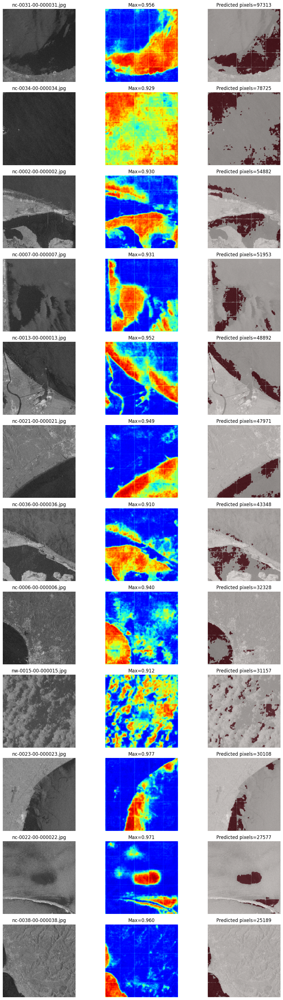

In [61]:
# ============================================================
# CELL — INSPECT REMAINING FINE-TUNED FALSE POSITIVES
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import torch


# ------------------------------------------------------------
# Get false positives from the tiled benchmark
# ------------------------------------------------------------

new_fp = new_results[
    (new_results["actual"] == 0) &
    (new_results["predicted"] == 1)
].copy()


# Sort by predicted oil area
new_fp = new_fp.sort_values(
    "oil_pixels",
    ascending=False
).reset_index(drop=True)


print("=" * 70)
print("REMAINING FINE-TUNED FALSE POSITIVES")
print("=" * 70)

display(new_fp)


# ------------------------------------------------------------
# Show top 12
# ------------------------------------------------------------

TOP_N = min(
    12,
    len(new_fp)
)


fig, axes = plt.subplots(
    TOP_N,
    3,
    figsize=(12, TOP_N * 3)
)


if TOP_N == 1:
    axes = np.expand_dims(
        axes,
        axis=0
    )


# ------------------------------------------------------------
# Helper:
# find probability map for filename
# ------------------------------------------------------------

new_map_lookup = {
    r["filename"]: r["probability"]
    if "probability" in r
    else None
    for r in new_maps
}


# ------------------------------------------------------------
# Re-run prediction to guarantee maps exist
# ------------------------------------------------------------

for row_idx in range(TOP_N):

    filename = new_fp.iloc[
        row_idx
    ]["filename"]

    path = DARTIS_DIR / filename


    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )


    # -----------------------------------------------
    # TILED MODEL PROBABILITY
    # -----------------------------------------------

    probability = tiled_predict(
        new_model,
        image
    )


    binary = (
        probability >= THRESHOLD
    ).astype(
        np.uint8
    )


    # -----------------------------------------------
    # Clean components
    # -----------------------------------------------

    cleaned = np.zeros_like(
        binary
    )


    n_labels, labels, stats, _ = (
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )
    )


    for label in range(
        1,
        n_labels
    ):

        area = stats[
            label,
            cv2.CC_STAT_AREA
        ]

        if area >= MIN_COMPONENT_AREA:

            cleaned[
                labels == label
            ] = 1


    # -----------------------------------------------
    # Original
    # -----------------------------------------------

    axes[row_idx, 0].imshow(
        image,
        cmap="gray"
    )

    axes[row_idx, 0].set_title(
        f"{filename}"
    )

    axes[row_idx, 0].axis(
        "off"
    )


    # -----------------------------------------------
    # Probability map
    # -----------------------------------------------

    axes[row_idx, 1].imshow(
        probability,
        cmap="jet",
        vmin=0,
        vmax=1
    )

    axes[row_idx, 1].set_title(
        f"Max={probability.max():.3f}"
    )

    axes[row_idx, 1].axis(
        "off"
    )


    # -----------------------------------------------
    # Mask overlay
    # -----------------------------------------------

    axes[row_idx, 2].imshow(
        image,
        cmap="gray"
    )

    axes[row_idx, 2].imshow(
        cleaned,
        cmap="Reds",
        alpha=0.45
    )

    axes[row_idx, 2].set_title(
        f"Predicted pixels={cleaned.sum()}"
    )

    axes[row_idx, 2].axis(
        "off"
    )


plt.tight_layout()
plt.show()

In [62]:
# ============================================================
# CELL — EXTRACT NC COASTAL HARD-NEGATIVE PATCHES
#
# Purpose:
#   Find the areas where the fine-tuned model is strongly
#   activating on NC (NO-OIL + COAST) images.
#
#   These regions become explicit 256x256 zero-mask
#   hard-negative training patches.
#
# This is much more targeted than another generic fine-tune.
# ============================================================

import cv2
import numpy as np
import pandas as pd
import torch

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

HARDNEG_DIR = Path(
    "/kaggle/working/nc_hard_negative_patches"
)

HARDNEG_DIR.mkdir(
    parents=True,
    exist_ok=True
)


TILE_SIZE = 256
STRIDE = 128

THRESHOLD = 0.75

MIN_COMPONENT_AREA = 500

MAX_PATCHES_PER_IMAGE = 5


print("=" * 70)
print("NC COASTAL HARD-NEGATIVE EXTRACTION")
print("=" * 70)

print(
    "Output:",
    HARDNEG_DIR
)


# ============================================================
# 1. GET NC IMAGES EXCLUDING PROTECTED BENCHMARK
# ============================================================

benchmark_nc = {
    f"nc-{i:04d}-00-{i:06d}.jpg"
    for i in range(1, 51)
}


nc_images = sorted([

    p

    for p in DARTIS_DIR.iterdir()

    if p.is_file()

    and p.suffix.lower() == ".jpg"

    and p.name.lower().startswith("nc-")

    and p.name not in benchmark_nc
])


print(
    "NC training candidates:",
    len(nc_images)
)


# ============================================================
# 2. FIND LARGE ACTIVATIONS
# ============================================================

records = []


for image_path in tqdm(
    nc_images,
    desc="Finding NC false positives"
):

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        continue


    H, W = image.shape


    # --------------------------------------------------------
    # Run tiled prediction
    # --------------------------------------------------------

    probability = tiled_predict(
        new_model,
        image
    )


    # --------------------------------------------------------
    # Threshold
    # --------------------------------------------------------

    binary = (
        probability >= THRESHOLD
    ).astype(
        np.uint8
    )


    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    n_labels, labels, stats, centroids = (

        cv2.connectedComponentsWithStats(

            binary,

            connectivity=8
        )
    )


    components = []


    for label in range(
        1,
        n_labels
    ):

        area = int(
            stats[
                label,
                cv2.CC_STAT_AREA
            ]
        )


        if area < MIN_COMPONENT_AREA:
            continue


        x = int(
            stats[
                label,
                cv2.CC_STAT_LEFT
            ]
        )

        y = int(
            stats[
                label,
                cv2.CC_STAT_TOP
            ]
        )

        w = int(
            stats[
                label,
                cv2.CC_STAT_WIDTH
            ]
        )

        h = int(
            stats[
                label,
                cv2.CC_STAT_HEIGHT
            ]
        )


        cx, cy = centroids[
            label
        ]


        component_prob = probability[
            labels == label
        ]


        components.append({

            "label":
                label,

            "x":
                x,

            "y":
                y,

            "w":
                w,

            "h":
                h,

            "cx":
                float(cx),

            "cy":
                float(cy),

            "area":
                area,

            "mean_confidence":
                float(
                    component_prob.mean()
                ),

            "peak_confidence":
                float(
                    component_prob.max()
                )
        })


    # --------------------------------------------------------
    # Sort strongest / largest FP regions
    # --------------------------------------------------------

    components.sort(

        key=lambda c: (
            c["area"],
            c["peak_confidence"]
        ),

        reverse=True
    )


    components = components[
        :MAX_PATCHES_PER_IMAGE
    ]


    # --------------------------------------------------------
    # Extract 256x256 crops centered around each activation
    # --------------------------------------------------------

    for component_idx, comp in enumerate(
        components
    ):

        cx = int(
            round(
                comp["cx"]
            )
        )

        cy = int(
            round(
                comp["cy"]
            )
        )


        # ----------------------------------------------------
        # Centered crop
        # ----------------------------------------------------

        x0 = (
            cx
            - TILE_SIZE // 2
        )

        y0 = (
            cy
            - TILE_SIZE // 2
        )


        # ----------------------------------------------------
        # Clamp to image boundaries
        # ----------------------------------------------------

        x0 = max(
            0,
            min(
                x0,
                max(
                    W - TILE_SIZE,
                    0
                )
            )
        )

        y0 = max(
            0,
            min(
                y0,
                max(
                    H - TILE_SIZE,
                    0
                )
            )
        )


        x1 = x0 + TILE_SIZE
        y1 = y0 + TILE_SIZE


        # ----------------------------------------------------
        # If image is smaller than tile size,
        # pad it.
        # ----------------------------------------------------

        crop = image[
            y0:min(y1, H),
            x0:min(x1, W)
        ]


        if crop.shape != (
            TILE_SIZE,
            TILE_SIZE
        ):

            padded = np.zeros(
                (
                    TILE_SIZE,
                    TILE_SIZE
                ),
                dtype=np.uint8
            )

            padded[
                :crop.shape[0],
                :crop.shape[1]
            ] = crop

            crop = padded


        # ----------------------------------------------------
        # Save patch
        # ----------------------------------------------------

        patch_name = (
            f"{image_path.stem}"
            f"_fp{component_idx:02d}"
            f"_area{comp['area']}"
            f"_conf{comp['peak_confidence']:.3f}"
            ".png"
        )


        patch_path = (
            HARDNEG_DIR /
            patch_name
        )


        cv2.imwrite(
            str(patch_path),
            crop
        )


        records.append({

            "source_image":
                image_path.name,

            "patch":
                patch_name,

            "x":
                x0,

            "y":
                y0,

            "area":
                comp["area"],

            "mean_confidence":
                comp["mean_confidence"],

            "peak_confidence":
                comp["peak_confidence"]
        })


# ============================================================
# 3. SAVE INDEX
# ============================================================

hardneg_df = pd.DataFrame(
    records
)


INDEX_PATH = (
    "/kaggle/working/"
    "nc_hard_negative_patches.csv"
)


hardneg_df.to_csv(
    INDEX_PATH,
    index=False
)


# ============================================================
# 4. SUMMARY
# ============================================================

print()
print("=" * 70)
print("HARD-NEGATIVE EXTRACTION COMPLETE")
print("=" * 70)

print(
    "NC source images:",
    len(nc_images)
)

print(
    "Hard-negative patches:",
    len(hardneg_df)
)

print(
    "Saved to:",
    HARDNEG_DIR
)

print(
    "Index:",
    INDEX_PATH
)


if len(hardneg_df) > 0:

    print()
    print("=" * 70)
    print("STRONGEST NC FALSE-POSITIVE REGIONS")
    print("=" * 70)

    display(
        hardneg_df
        .sort_values(
            [
                "area",
                "peak_confidence"
            ],
            ascending=False
        )
        .head(30)
    )


print()
print(
    "✅ These patches contain ZERO-OIL coastal "
    "hard negatives."
)

NC COASTAL HARD-NEGATIVE EXTRACTION
Output: /kaggle/working/nc_hard_negative_patches
NC training candidates: 301


Finding NC false positives:   0%|          | 0/301 [00:00<?, ?it/s]


HARD-NEGATIVE EXTRACTION COMPLETE
NC source images: 301
Hard-negative patches: 663
Saved to: /kaggle/working/nc_hard_negative_patches
Index: /kaggle/working/nc_hard_negative_patches.csv

STRONGEST NC FALSE-POSITIVE REGIONS


,source_image,patch,x,y,area,mean_confidence,peak_confidence
584,nc-0323-04-000044.jpg,nc-0323-04-000044_fp00_area44623_conf0.937.png,25,265,44623,0.844096,0.937043
585,nc-0323-04-000044.jpg,nc-0323-04-000044_fp01_area40543_conf0.955.png,191,295,40543,0.867516,0.954732
372,nc-0238-03-000003.jpg,nc-0238-03-000003_fp00_area36461_conf0.967.png,384,27,36461,0.865434,0.966894
53,nc-0068-00-000068.jpg,nc-0068-00-000068_fp00_area30254_conf0.971.png,0,283,30254,0.850855,0.971490
104,nc-0096-01-000020.jpg,nc-0096-01-000020_fp00_area28817_conf0.958.png,384,2,28817,0.849910,0.957649
464,nc-0272-03-000037.jpg,nc-0272-03-000037_fp00_area27253_conf0.947.png,0,120,27253,0.842350,0.946765
465,nc-0272-03-000037.jpg,nc-0272-03-000037_fp01_area27004_conf0.931.png,7,384,27004,0.844257,0.930519
58,nc-0071-00-000071.jpg,nc-0071-00-000071_fp00_area26654_conf0.971.png,0,357,26654,0.883868,0.970667
459,nc-0271-03-000036.jpg,nc-0271-03-000036_fp00_area26632_conf0.939.png,0,85,26632,0.829102,0.939277
66,nc-0077-01-000001.jpg,nc-0077-01-000001_fp00_area25150_conf0.939.png,328,127,25150,0.855813,0.939249



✅ These patches contain ZERO-OIL coastal hard negatives.


In [63]:
# ============================================================
# TARGETED NC HARD-NEGATIVE FINE-TUNE
# ============================================================
#
# Starts from:
#   unet_resnet34_hardnegative_finetuned.pt
#
# Adds:
#   573 NC false-positive patches
#
# Goal:
#   Reduce NC false positives without destroying oil recall.
#
# IMPORTANT:
#   Protected 100-image DARTIS benchmark is NOT used.
# ============================================================

import cv2
import copy
import time
import numpy as np
import torch
import pandas as pd
import segmentation_models_pytorch as smp
import albumentations as A

from pathlib import Path
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

START_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

OUTPUT_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_nc_targeted.pt"
)

NC_PATCH_DIR = Path(
    "/kaggle/working/"
    "nc_hard_negative_patches"
)

IMG_SIZE = 256

BATCH_SIZE = 8

EPOCHS = 2

LR = 2e-6

WEIGHT_DECAY = 1e-4

SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)


print("=" * 70)
print("TARGETED NC HARD-NEGATIVE FINE-TUNING")
print("=" * 70)

print("Device :", DEVICE)
print("Epochs :", EPOCHS)
print("LR     :", LR)


# ============================================================
# 1. CHECK REQUIRED DATA
# ============================================================

required = [
    "sos_positive_ft",
    "sos_negative_ft"
]

missing = [
    x for x in required
    if x not in globals()
]

if missing:

    raise RuntimeError(
        "Missing variables: "
        + ", ".join(missing)
        + "\nRun the previous split cell first."
    )


if not NC_PATCH_DIR.exists():

    raise FileNotFoundError(
        f"NC patch directory not found:\n"
        f"{NC_PATCH_DIR}"
    )


# ============================================================
# 2. NC PATCHES
# ============================================================

nc_patches = sorted([

    p

    for p in NC_PATCH_DIR.iterdir()

    if p.is_file()

    and p.suffix.lower() == ".png"

])


print()
print(
    "NC hard-negative patches:",
    len(nc_patches)
)


if len(nc_patches) == 0:

    raise RuntimeError(
        "No NC hard-negative patches found."
    )


# ============================================================
# 3. USE A MANAGEABLE SOS POOL
# ============================================================
#
# Keep enough real oil examples to prevent catastrophic
# suppression, but do not overwhelm the targeted NC signal.
# ============================================================

rng = np.random.default_rng(SEED)

sos_pos = list(
    sos_positive_ft
)

sos_neg = list(
    sos_negative_ft
)


rng.shuffle(
    sos_pos
)

rng.shuffle(
    sos_neg
)

rng.shuffle(
    nc_patches
)


# Use all 255 SOS negatives
# Use up to 1500 positive samples
sos_pos = sos_pos[:1500]

# Use all available SOS negatives
sos_neg = sos_neg[:255]

# Use all NC hard-negative patches
nc_patches = nc_patches


print()
print("=" * 70)
print("TRAINING POOL")
print("=" * 70)

print(
    "SOS positive:",
    len(sos_pos)
)

print(
    "SOS negative:",
    len(sos_neg)
)

print(
    "NC hard patches:",
    len(nc_patches)
)


# ============================================================
# 4. TRANSFORMS
# ============================================================

train_transform = A.Compose([

    A.HorizontalFlip(
        p=0.5
    ),

    A.VerticalFlip(
        p=0.5
    ),

    A.RandomRotate90(
        p=0.5
    ),

    A.Resize(
        IMG_SIZE,
        IMG_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST
    ),

    A.Normalize(
        mean=(0.5,),
        std=(0.5,)
    )
])


# ============================================================
# 5. DATASET
# ============================================================

class TargetedNCDataset(Dataset):

    def __init__(
        self,
        sos_positive,
        sos_negative,
        nc_patches,
        transform
    ):

        self.items = []

        # ----------------------------------------------------
        # SOS POSITIVE
        # ----------------------------------------------------

        for image_path, mask_path in sos_positive:

            self.items.append({

                "image":
                    Path(image_path),

                "mask":
                    Path(mask_path),

                "source":
                    "SOS_POSITIVE"

            })


        # ----------------------------------------------------
        # SOS NEGATIVE
        # ----------------------------------------------------

        for image_path, mask_path in sos_negative:

            self.items.append({

                "image":
                    Path(image_path),

                "mask":
                    Path(mask_path),

                "source":
                    "SOS_NEGATIVE"

            })


        # ----------------------------------------------------
        # NC HARD NEGATIVE
        # ----------------------------------------------------

        for image_path in nc_patches:

            self.items.append({

                "image":
                    Path(image_path),

                "mask":
                    None,

                "source":
                    "NC_HARD_NEGATIVE"

            })


        self.transform = transform


    def __len__(self):

        return len(
            self.items
        )


    def __getitem__(
        self,
        index
    ):

        item = self.items[
            index
        ]


        # ----------------------------------------------------
        # IMAGE
        # ----------------------------------------------------

        image = cv2.imread(

            str(
                item["image"]
            ),

            cv2.IMREAD_GRAYSCALE

        )

        if image is None:

            raise RuntimeError(
                f"Could not read:\n"
                f"{item['image']}"
            )


        # ----------------------------------------------------
        # MASK
        # ----------------------------------------------------

        if item["mask"] is None:

            # NC hard-negative:
            # target is completely zero.

            mask = np.zeros_like(
                image,
                dtype=np.uint8
            )

        else:

            mask = cv2.imread(

                str(
                    item["mask"]
                ),

                cv2.IMREAD_GRAYSCALE

            )

            if mask is None:

                raise RuntimeError(
                    f"Could not read mask:\n"
                    f"{item['mask']}"
                )


            mask = (
                mask > 127
            ).astype(
                np.uint8
            )


        # ----------------------------------------------------
        # TRANSFORM
        # ----------------------------------------------------

        transformed = self.transform(

            image=image,

            mask=mask

        )

        image = transformed[
            "image"
        ]

        mask = transformed[
            "mask"
        ]


        # ----------------------------------------------------
        # TENSOR
        # ----------------------------------------------------

        image = torch.from_numpy(
            image
        ).float()

        mask = torch.from_numpy(
            mask
        ).float()


        if image.ndim == 2:

            image = image.unsqueeze(0)

        if mask.ndim == 2:

            mask = mask.unsqueeze(0)


        return {

            "image":
                image,

            "mask":
                mask,

            "source":
                item["source"],

            "filename":
                item["image"].name
        }


# ============================================================
# 6. DATASET
# ============================================================

dataset = TargetedNCDataset(

    sos_positive=sos_pos,

    sos_negative=sos_neg,

    nc_patches=nc_patches,

    transform=train_transform
)


print()
print(
    "Total samples:",
    len(dataset)
)


# ============================================================
# 7. WEIGHTED SAMPLING
# ============================================================
#
# Desired approximate exposure:
#
#   SOS positive      ~55%
#   SOS negative      ~10%
#   NC hard negative  ~35%
#
# This is intentionally NOT 50/50.
# ============================================================

weights = []

for item in dataset.items:

    source = item["source"]


    if source == "SOS_POSITIVE":

        weight = 0.55 / max(
            len(sos_pos),
            1
        )


    elif source == "SOS_NEGATIVE":

        weight = 0.10 / max(
            len(sos_neg),
            1
        )


    else:

        weight = 0.35 / max(
            len(nc_patches),
            1
        )


    weights.append(
        weight
    )


weights = torch.tensor(
    weights,
    dtype=torch.double
)


sampler = WeightedRandomSampler(

    weights=weights,

    num_samples=len(dataset),

    replacement=True,

    generator=torch.Generator()
        .manual_seed(SEED)

)


# ============================================================
# 8. LOADER
# ============================================================

loader = DataLoader(

    dataset,

    batch_size=BATCH_SIZE,

    sampler=sampler,

    num_workers=2,

    pin_memory=torch.cuda.is_available(),

    persistent_workers=True

)


print(
    "Batches per epoch:",
    len(loader)
)


# ============================================================
# 9. LOAD CURRENT BEST MODEL
# ============================================================

print()
print("=" * 70)
print("LOADING CURRENT BEST MODEL")
print("=" * 70)


model = smp.Unet(

    encoder_name="resnet34",

    encoder_weights=None,

    in_channels=1,

    classes=1,

    activation=None

)


checkpoint = torch.load(

    START_MODEL,

    map_location=DEVICE,

    weights_only=False

)


if isinstance(
    checkpoint,
    dict
):

    if "model_state_dict" in checkpoint:

        state = checkpoint[
            "model_state_dict"
        ]

    elif "state_dict" in checkpoint:

        state = checkpoint[
            "state_dict"
        ]

    else:

        state = checkpoint

else:

    state = checkpoint


clean_state = {}

for key, value in state.items():

    if key.startswith("module."):

        key = key.replace(
            "module.",
            "",
            1
        )

    clean_state[key] = value


model.load_state_dict(
    clean_state
)

model.to(DEVICE)
model.eval()


print(
    "✅ Model loaded"
)


# ============================================================
# 10. LOSS
# ============================================================

dice_loss = smp.losses.DiceLoss(

    mode="binary",

    from_logits=True

)

bce_loss = smp.losses.SoftBCEWithLogitsLoss()


def combined_loss(
    logits,
    targets
):

    return (

        dice_loss(
            logits,
            targets
        )

        +

        bce_loss(
            logits,
            targets
        )

    )


# ============================================================
# 11. OPTIMIZER
# ============================================================

optimizer = torch.optim.AdamW(

    model.parameters(),

    lr=LR,

    weight_decay=WEIGHT_DECAY

)


# ============================================================
# 12. AMP
# ============================================================

use_amp = (
    DEVICE.type == "cuda"
)


scaler = torch.amp.GradScaler(
    "cuda",
    enabled=use_amp
)


# ============================================================
# 13. TRAIN
# ============================================================

history = []


print()
print("=" * 70)
print("STARTING TARGETED NC FINE-TUNE")
print("=" * 70)


for epoch in range(
    1,
    EPOCHS + 1
):

    model.train()

    running_loss = 0.0

    positive_seen = 0
    sos_negative_seen = 0
    nc_seen = 0


    start = time.time()


    progress = tqdm(

        loader,

        desc=f"Epoch {epoch}/{EPOCHS}",

        leave=True

    )


    for batch in progress:

        images = batch[
            "image"
        ].to(
            DEVICE,
            non_blocking=True
        )

        masks = batch[
            "mask"
        ].to(
            DEVICE,
            non_blocking=True
        )


        for source in batch[
            "source"
        ]:

            if source == "SOS_POSITIVE":

                positive_seen += 1

            elif source == "SOS_NEGATIVE":

                sos_negative_seen += 1

            else:

                nc_seen += 1


        optimizer.zero_grad(
            set_to_none=True
        )


        with torch.autocast(

            device_type=DEVICE.type,

            dtype=torch.float16,

            enabled=use_amp

        ):

            logits = model(
                images
            )

            loss = combined_loss(
                logits,
                masks
            )


        scaler.scale(
            loss
        ).backward()


        scaler.step(
            optimizer
        )


        scaler.update()


        running_loss += (
            loss.item()
        )


        progress.set_postfix(
            loss=f"{loss.item():.4f}"
        )


    epoch_loss = (
        running_loss /
        len(loader)
    )


    elapsed = (
        time.time()
        - start
    )


    history.append({

        "epoch":
            epoch,

        "loss":
            epoch_loss,

        "SOS_positive":
            positive_seen,

        "SOS_negative":
            sos_negative_seen,

        "NC_hard_negative":
            nc_seen,

        "time_sec":
            elapsed

    })


    print()
    print("=" * 70)
    print(
        f"EPOCH {epoch}/{EPOCHS}"
    )
    print("=" * 70)

    print(
        f"Loss              : "
        f"{epoch_loss:.5f}"
    )

    print(
        f"SOS positive      : "
        f"{positive_seen}"
    )

    print(
        f"SOS negative      : "
        f"{sos_negative_seen}"
    )

    print(
        f"NC hard negative  : "
        f"{nc_seen}"
    )

    print(
        f"Time              : "
        f"{elapsed:.1f}s"
    )


# ============================================================
# 14. SAVE
# ============================================================

torch.save(
    model.state_dict(),
    OUTPUT_MODEL
)


history_df = pd.DataFrame(
    history
)


print()
print("=" * 70)
print("TARGETED FINE-TUNE COMPLETE")
print("=" * 70)

display(
    history_df.round(5)
)

print()
print(
    "✅ Saved:"
)

print(
    OUTPUT_MODEL
)

TARGETED NC HARD-NEGATIVE FINE-TUNING
Device : cuda
Epochs : 2
LR     : 2e-06

NC hard-negative patches: 663

TRAINING POOL
SOS positive: 1500
SOS negative: 255
NC hard patches: 663

Total samples: 2418
Batches per epoch: 303

LOADING CURRENT BEST MODEL
✅ Model loaded

STARTING TARGETED NC FINE-TUNE


Epoch 1/2:   0%|          | 0/303 [00:00<?, ?it/s]


EPOCH 1/2
Loss              : 0.86500
SOS positive      : 1329
SOS negative      : 228
NC hard negative  : 861
Time              : 21.8s


Epoch 2/2:   0%|          | 0/303 [00:00<?, ?it/s]


EPOCH 2/2
Loss              : 0.84540
SOS positive      : 1317
SOS negative      : 244
NC hard negative  : 857
Time              : 21.6s

TARGETED FINE-TUNE COMPLETE


,epoch,loss,SOS_positive,SOS_negative,NC_hard_negative,time_sec
0,1,0.8650,1329,228,861,21.79055
1,2,0.8454,1317,244,857,21.63277



✅ Saved:
/kaggle/working/unet_resnet34_nc_targeted.pt


In [64]:
# ============================================================
# FINAL 3-WAY MODEL COMPARISON
#
# Models:
#   1. ORIGINAL
#   2. HARD-NEGATIVE FINETUNED
#   3. NC-TARGETED FINETUNED
#
# Protected benchmark:
#   OW = 50
#   OC = 50
#   NW = 50
#   NC = 50
#
# Tiled inference:
#   tile = 256
#   stride = 128
#
# Production threshold:
#   0.75
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

DARTIS_DIR = Path(
    "/kaggle/working/dartis_images"
)

ORIGINAL_MODEL = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

HARDNEG_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

NC_TARGETED_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_nc_targeted.pt"
)

IMG_SIZE = 256
STRIDE = 128

THRESHOLD = 0.75
MIN_AREA = 20


# ============================================================
# MODEL LOADER
# ============================================================

def load_model(path):

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=1,
        classes=1,
        activation=None
    )

    checkpoint = torch.load(
        path,
        map_location=DEVICE,
        weights_only=False
    )

    if isinstance(checkpoint, dict):

        if "model_state_dict" in checkpoint:
            state = checkpoint["model_state_dict"]

        elif "state_dict" in checkpoint:
            state = checkpoint["state_dict"]

        else:
            state = checkpoint

    else:

        state = checkpoint


    clean_state = {}

    for key, value in state.items():

        if key.startswith("module."):
            key = key.replace(
                "module.",
                "",
                1
            )

        clean_state[key] = value


    model.load_state_dict(
        clean_state
    )

    model.to(DEVICE)
    model.eval()

    return model


# ============================================================
# LOAD ALL THREE
# ============================================================

print("=" * 70)
print("LOADING MODELS")
print("=" * 70)


print("\n1. ORIGINAL")
original_model = load_model(
    ORIGINAL_MODEL
)
print("✅")


print("\n2. HARD-NEGATIVE")
hardneg_model = load_model(
    HARDNEG_MODEL
)
print("✅")


print("\n3. NC-TARGETED")
nc_model = load_model(
    NC_TARGETED_MODEL
)
print("✅")


# ============================================================
# BENCHMARK
# ============================================================

def first_50(prefix):

    files = sorted([

        p

        for p in DARTIS_DIR.iterdir()

        if p.is_file()

        and p.suffix.lower() == ".jpg"

        and p.name.lower().startswith(prefix)

    ])

    return files[:50]


benchmark = (
    first_50("ow-")
    + first_50("oc-")
    + first_50("nw-")
    + first_50("nc-")
)


assert len(benchmark) == 200


print()
print("=" * 70)
print("BENCHMARK")
print("=" * 70)

print("OW:", len(first_50("ow-")))
print("OC:", len(first_50("oc-")))
print("NW:", len(first_50("nw-")))
print("NC:", len(first_50("nc-")))
print("TOTAL:", len(benchmark))


# ============================================================
# GROUND TRUTH
# ============================================================

def gt(path):

    prefix = path.name[:2].lower()

    if prefix in ("ow", "oc"):
        return 1

    if prefix in ("nw", "nc"):
        return 0

    raise ValueError(
        path.name
    )


# ============================================================
# TILE POSITIONS
# ============================================================

def tile_starts(length):

    if length <= IMG_SIZE:
        return [0]

    starts = list(
        range(
            0,
            length - IMG_SIZE + 1,
            STRIDE
        )
    )

    final = length - IMG_SIZE

    if starts[-1] != final:
        starts.append(final)

    return starts


# ============================================================
# TILED INFERENCE
# ============================================================

@torch.no_grad()
def tiled_probability(
    model,
    image
):

    H, W = image.shape

    prob_sum = np.zeros(
        (H, W),
        dtype=np.float32
    )

    count = np.zeros(
        (H, W),
        dtype=np.float32
    )


    ys = tile_starts(H)
    xs = tile_starts(W)


    for y in ys:

        for x in xs:

            tile = image[
                y:y + IMG_SIZE,
                x:x + IMG_SIZE
            ]

            tile_h, tile_w = tile.shape


            # -----------------------------------------------
            # Pad edge tile
            # -----------------------------------------------

            if (
                tile_h != IMG_SIZE
                or tile_w != IMG_SIZE
            ):

                padded = np.zeros(
                    (
                        IMG_SIZE,
                        IMG_SIZE
                    ),
                    dtype=np.uint8
                )

                padded[
                    :tile_h,
                    :tile_w
                ] = tile

                tile = padded


            # -----------------------------------------------
            # Preprocessing
            # -----------------------------------------------

            tile = (
                tile.astype(
                    np.float32
                ) / 255.0
            )

            tile = (
                tile - 0.5
            ) / 0.5


            x_tensor = (
                torch.from_numpy(tile)
                .float()
                .unsqueeze(0)
                .unsqueeze(0)
                .to(DEVICE)
            )


            # -----------------------------------------------
            # Prediction
            # -----------------------------------------------

            logits = model(
                x_tensor
            )

            probability = (
                torch.sigmoid(
                    logits
                )
                .squeeze()
                .cpu()
                .numpy()
            )


            # -----------------------------------------------
            # Reconstruct
            # -----------------------------------------------

            prob_sum[
                y:y + tile_h,
                x:x + tile_w
            ] += probability[
                :tile_h,
                :tile_w
            ]

            count[
                y:y + tile_h,
                x:x + tile_w
            ] += 1


    return (
        prob_sum /
        np.maximum(
            count,
            1e-8
        )
    )


# ============================================================
# POST PROCESSING
# ============================================================

def get_components(probability):

    binary = (
        probability >= THRESHOLD
    ).astype(
        np.uint8
    )


    num_labels, labels, stats, centroids = (

        cv2.connectedComponentsWithStats(

            binary,

            connectivity=8

        )

    )


    components = []


    for label in range(
        1,
        num_labels
    ):

        area = int(
            stats[
                label,
                cv2.CC_STAT_AREA
            ]
        )

        if area < MIN_AREA:
            continue


        component_mask = (
            labels == label
        )


        component_probs = (
            probability[
                component_mask
            ]
        )


        components.append({

            "area":
                area,

            "mean_confidence":
                float(
                    component_probs.mean()
                ),

            "peak_confidence":
                float(
                    component_probs.max()
                ),

            "centroid":
                centroids[label].tolist()
        })


    return components


# ============================================================
# RUN MODEL
# ============================================================

def run_model(
    model,
    model_name
):

    rows = []


    print()
    print("=" * 70)
    print(
        f"RUNNING {model_name}"
    )
    print("=" * 70)


    for path in tqdm(
        benchmark,
        desc=model_name
    ):

        image = cv2.imread(
            str(path),
            cv2.IMREAD_GRAYSCALE
        )

        if image is None:
            raise RuntimeError(
                f"Cannot read {path}"
            )


        probability = tiled_probability(
            model,
            image
        )


        components = get_components(
            probability
        )


        detected = (
            len(components) > 0
        )


        rows.append({

            "filename":
                path.name,

            "subset":
                path.name[:2].upper(),

            "actual":
                gt(path),

            "predicted":
                int(detected),

            "oil_pixels":
                int(
                    sum(
                        c["area"]
                        for c in components
                    )
                ),

            "num_components":
                len(components),

            "max_probability":
                float(
                    probability.max()
                ),

            "mean_component_confidence":
                float(
                    np.mean([
                        c["mean_confidence"]
                        for c in components
                    ])
                )
                if components
                else 0.0
        })


    return pd.DataFrame(
        rows
    )


# ============================================================
# RUN ALL THREE
# ============================================================

original_results = run_model(
    original_model,
    "ORIGINAL"
)

hardneg_results = run_model(
    hardneg_model,
    "HARD-NEGATIVE"
)

nc_results = run_model(
    nc_model,
    "NC-TARGETED"
)


# ============================================================
# METRICS
# ============================================================

def metrics(df):

    actual = df["actual"].to_numpy()
    pred = df["predicted"].to_numpy()


    TP = int(
        (
            (actual == 1)
            &
            (pred == 1)
        ).sum()
    )

    TN = int(
        (
            (actual == 0)
            &
            (pred == 0)
        ).sum()
    )

    FP = int(
        (
            (actual == 0)
            &
            (pred == 1)
        ).sum()
    )

    FN = int(
        (
            (actual == 1)
            &
            (pred == 0)
        ).sum()
    )


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) /
        len(df)
    )


    return {
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1": f1
    }


m_original = metrics(
    original_results
)

m_hardneg = metrics(
    hardneg_results
)

m_nc = metrics(
    nc_results
)


# ============================================================
# OVERALL COMPARISON
# ============================================================

overall = pd.DataFrame({

    "Metric": [
        "TP",
        "FP",
        "FN",
        "TN",
        "Accuracy",
        "Precision",
        "Recall",
        "F1"
    ],

    "ORIGINAL": [
        m_original["TP"],
        m_original["FP"],
        m_original["FN"],
        m_original["TN"],
        m_original["Accuracy"],
        m_original["Precision"],
        m_original["Recall"],
        m_original["F1"]
    ],

    "HARD_NEGATIVE": [
        m_hardneg["TP"],
        m_hardneg["FP"],
        m_hardneg["FN"],
        m_hardneg["TN"],
        m_hardneg["Accuracy"],
        m_hardneg["Precision"],
        m_hardneg["Recall"],
        m_hardneg["F1"]
    ],

    "NC_TARGETED": [
        m_nc["TP"],
        m_nc["FP"],
        m_nc["FN"],
        m_nc["TN"],
        m_nc["Accuracy"],
        m_nc["Precision"],
        m_nc["Recall"],
        m_nc["F1"]
    ]
})


print()
print("=" * 70)
print("FINAL 3-MODEL COMPARISON")
print("=" * 70)

display(
    overall.round(4)
)


# ============================================================
# PER SUBSET
# ============================================================

subset_rows = []


for subset in [
    "OW",
    "OC",
    "NW",
    "NC"
]:

    a = metrics(
        original_results[
            original_results["subset"] == subset
        ]
    )

    b = metrics(
        hardneg_results[
            hardneg_results["subset"] == subset
        ]
    )

    c = metrics(
        nc_results[
            nc_results["subset"] == subset
        ]
    )


    subset_rows.append({

        "subset":
            subset,

        "original_TP":
            a["TP"],

        "original_FP":
            a["FP"],

        "original_FN":
            a["FN"],

        "hardneg_TP":
            b["TP"],

        "hardneg_FP":
            b["FP"],

        "hardneg_FN":
            b["FN"],

        "nc_targeted_TP":
            c["TP"],

        "nc_targeted_FP":
            c["FP"],

        "nc_targeted_FN":
            c["FN"]
    })


subset_df = pd.DataFrame(
    subset_rows
)


print()
print("=" * 70)
print("PER-SUBSET COMPARISON")
print("=" * 70)

display(
    subset_df
)


# ============================================================
# NC FPs
# ============================================================

print()
print("=" * 70)
print("NC FALSE POSITIVES")
print("=" * 70)


old_nc_fp = original_results[
    (original_results["subset"] == "NC")
    &
    (original_results["predicted"] == 1)
]


hard_nc_fp = hardneg_results[
    (hardneg_results["subset"] == "NC")
    &
    (hardneg_results["predicted"] == 1)
]


new_nc_fp = nc_results[
    (nc_results["subset"] == "NC")
    &
    (nc_results["predicted"] == 1)
]


print(
    "Original NC FP:",
    len(old_nc_fp)
)

print(
    "Hard-negative NC FP:",
    len(hard_nc_fp)
)

print(
    "NC-targeted NC FP:",
    len(new_nc_fp)
)


# ============================================================
# NC TARGETED FALSE POSITIVES
# ============================================================

print()
print("Remaining NC false positives:")

display(
    new_nc_fp.sort_values(
        "oil_pixels",
        ascending=False
    )
)


# ============================================================
# SAVE
# ============================================================

overall.to_csv(
    "/kaggle/working/"
    "final_three_model_comparison.csv",
    index=False
)

subset_df.to_csv(
    "/kaggle/working/"
    "final_three_model_subset_comparison.csv",
    index=False
)

original_results.to_csv(
    "/kaggle/working/"
    "final_original_results.csv",
    index=False
)

hardneg_results.to_csv(
    "/kaggle/working/"
    "final_hardnegative_results.csv",
    index=False
)

nc_results.to_csv(
    "/kaggle/working/"
    "final_nc_targeted_results.csv",
    index=False
)


print()
print("=" * 70)
print("✅ FINAL COMPARISON SAVED")
print("=" * 70)

LOADING MODELS

1. ORIGINAL
✅

2. HARD-NEGATIVE
✅

3. NC-TARGETED
✅

BENCHMARK
OW: 50
OC: 50
NW: 50
NC: 50
TOTAL: 200

RUNNING ORIGINAL


ORIGINAL:   0%|          | 0/200 [00:00<?, ?it/s]


RUNNING HARD-NEGATIVE


HARD-NEGATIVE:   0%|          | 0/200 [00:00<?, ?it/s]


RUNNING NC-TARGETED


NC-TARGETED:   0%|          | 0/200 [00:00<?, ?it/s]


FINAL 3-MODEL COMPARISON


,Metric,ORIGINAL,HARD_NEGATIVE,NC_TARGETED
0,TP,12.0000,90.0000,58.0000
1,FP,19.0000,71.0000,27.0000
2,FN,88.0000,10.0000,42.0000
3,TN,81.0000,29.0000,73.0000
4,Accuracy,0.4650,0.5950,0.6550
5,Precision,0.3871,0.5590,0.6824
6,Recall,0.1200,0.9000,0.5800
7,F1,0.1832,0.6897,0.6270



PER-SUBSET COMPARISON


,subset,original_TP,original_FP,original_FN,hardneg_TP,hardneg_FP,hardneg_FN,nc_targeted_TP,nc_targeted_FP,nc_targeted_FN
0,OW,10,0,40,41,0,9,36,0,14
1,OC,2,0,48,49,0,1,22,0,28
2,NW,0,18,0,0,29,0,0,12,0
3,NC,0,1,0,0,42,0,0,15,0



NC FALSE POSITIVES
Original NC FP: 1
Hard-negative NC FP: 42
NC-targeted NC FP: 15

Remaining NC false positives:


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence
172,nc-0023-00-000023.jpg,NC,0,1,2305,2,0.917564,0.791518
158,nc-0009-00-000009.jpg,NC,0,1,2061,6,0.955332,0.803200
176,nc-0027-00-000027.jpg,NC,0,1,1912,3,0.906340,0.791821
186,nc-0037-00-000037.jpg,NC,0,1,1698,2,0.912548,0.798588
162,nc-0013-00-000013.jpg,NC,0,1,1250,2,0.883228,0.792799
187,nc-0038-00-000038.jpg,NC,0,1,924,1,0.929664,0.831765
170,nc-0021-00-000021.jpg,NC,0,1,434,4,0.836848,0.769644
179,nc-0030-00-000030.jpg,NC,0,1,311,1,0.879179,0.803861
155,nc-0006-00-000006.jpg,NC,0,1,226,2,0.804155,0.767370
183,nc-0034-00-000034.jpg,NC,0,1,134,1,0.852094,0.781510



✅ FINAL COMPARISON SAVED


In [65]:
# ============================================================
# FINAL THRESHOLD / AREA SWEEP
# HARD-NEGATIVE MODEL ONLY
# ============================================================

import cv2
import numpy as np
import pandas as pd


MODEL = hardneg_model

THRESHOLDS = [
    0.55,
    0.60,
    0.65,
    0.70,
    0.75,
    0.80,
    0.85,
    0.90
]

MIN_AREAS = [
    10,
    20,
    30,
    50,
    75,
    100,
    150
]


# ============================================================
# EVALUATE
# ============================================================

def evaluate_operating_point(
    probability_records,
    threshold,
    min_area
):

    TP = FP = TN = FN = 0

    for record in probability_records:

        probability = record["probability"]

        binary = (
            probability >= threshold
        ).astype(np.uint8)


        n_labels, labels, stats, _ = (
            cv2.connectedComponentsWithStats(
                binary,
                connectivity=8
            )
        )


        detected = False

        for label in range(
            1,
            n_labels
        ):

            area = int(
                stats[
                    label,
                    cv2.CC_STAT_AREA
                ]
            )

            if area >= min_area:

                detected = True
                break


        actual = int(
            record["actual"]
        )


        if actual == 1 and detected:
            TP += 1

        elif actual == 0 and detected:
            FP += 1

        elif actual == 1 and not detected:
            FN += 1

        else:
            TN += 1


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0
    )

    accuracy = (
        (TP + TN) / 200
    )


    return {
        "threshold": threshold,
        "min_area": min_area,
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


# ============================================================
# IMPORTANT:
# Reconstruct probability records using the existing
# tiled hard-negative model.
# ============================================================

probability_records = []

print("=" * 70)
print("GENERATING HARD-NEGATIVE PROBABILITY MAPS")
print("=" * 70)


for path in tqdm(
    benchmark,
    desc="Hard-negative model"
):

    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    probability = tiled_probability(
        hardneg_model,
        image
    )

    probability_records.append({

        "filename":
            path.name,

        "subset":
            path.name[:2].upper(),

        "actual":
            gt(path),

        "probability":
            probability
    })


# ============================================================
# SWEEP
# ============================================================

results = []

for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        result = evaluate_operating_point(
            probability_records,
            threshold,
            min_area
        )

        results.append(
            result
        )


results_df = pd.DataFrame(
    results
)


# ============================================================
# BEST BY F1
# ============================================================

print()
print("=" * 70)
print("TOP 15 BY F1")
print("=" * 70)

display(
    results_df
    .sort_values(
        "f1",
        ascending=False
    )
    .head(15)
    .round(4)
)


# ============================================================
# BEST HIGH-RECALL OPERATING POINTS
# ============================================================

print()
print("=" * 70)
print("BEST CONFIGURATIONS WITH RECALL >= 0.80")
print("=" * 70)

high_recall = results_df[
    results_df["recall"] >= 0.80
].sort_values(
    "f1",
    ascending=False
)

if len(high_recall) > 0:

    display(
        high_recall
        .head(15)
        .round(4)
    )

else:

    print(
        "No configuration reached recall >= 0.80"
    )


# ============================================================
# BEST PRECISION / RECALL BALANCE
# ============================================================

print()
print("=" * 70)
print("BEST CONFIGURATIONS WITH PRECISION >= 0.70")
print("=" * 70)

high_precision = results_df[
    results_df["precision"] >= 0.70
].sort_values(
    "f1",
    ascending=False
)

display(
    high_precision
    .head(15)
    .round(4)
)


# ============================================================
# SAVE
# ============================================================

SWEEP_PATH = (
    "/kaggle/working/"
    "hardnegative_threshold_area_sweep.csv"
)

results_df.to_csv(
    SWEEP_PATH,
    index=False
)

print()
print(
    f"✅ Saved: {SWEEP_PATH}"
)

GENERATING HARD-NEGATIVE PROBABILITY MAPS


Hard-negative model:   0%|          | 0/200 [00:00<?, ?it/s]


TOP 15 BY F1


,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1
38,0.80,50,83,48,17,52,0.675,0.6336,0.83,0.7186
39,0.80,75,81,46,19,54,0.675,0.6378,0.81,0.7137
43,0.85,20,76,39,24,61,0.685,0.6609,0.76,0.7070
37,0.80,30,83,53,17,47,0.650,0.6103,0.83,0.7034
40,0.80,100,78,44,22,56,0.670,0.6393,0.78,0.7027
45,0.85,50,72,33,28,67,0.695,0.6857,0.72,0.7024
33,0.75,100,86,59,14,41,0.635,0.5931,0.86,0.7020
42,0.85,10,76,41,24,59,0.675,0.6496,0.76,0.7005
31,0.75,50,89,67,11,33,0.610,0.5705,0.89,0.6953
44,0.85,30,73,37,27,63,0.680,0.6636,0.73,0.6952



BEST CONFIGURATIONS WITH RECALL >= 0.80


,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1
38,0.80,50,83,48,17,52,0.675,0.6336,0.83,0.7186
39,0.80,75,81,46,19,54,0.675,0.6378,0.81,0.7137
37,0.80,30,83,53,17,47,0.650,0.6103,0.83,0.7034
33,0.75,100,86,59,14,41,0.635,0.5931,0.86,0.7020
31,0.75,50,89,67,11,33,0.610,0.5705,0.89,0.6953
36,0.80,20,83,56,17,44,0.635,0.5971,0.83,0.6946
34,0.75,150,82,55,18,45,0.635,0.5985,0.82,0.6920
32,0.75,75,86,63,14,37,0.615,0.5772,0.86,0.6908
29,0.75,20,90,71,10,29,0.595,0.5590,0.90,0.6897
27,0.70,150,88,68,12,32,0.600,0.5641,0.88,0.6875



BEST CONFIGURATIONS WITH PRECISION >= 0.70


,threshold,min_area,TP,FP,FN,TN,accuracy,precision,recall,f1



✅ Saved: /kaggle/working/hardnegative_threshold_area_sweep.csv


In [66]:
# ============================================================
# FINAL OPERATING-POINT TEST BY SUBSET
# ============================================================

import cv2
import numpy as np
import pandas as pd


TEST_POINTS = [
    (0.55, 10),
    (0.60, 20),
    (0.65, 20),
    (0.70, 20),
    (0.75, 20),
]


def evaluate_subset_point(
    records,
    threshold,
    min_area,
    subset
):

    subset_records = [
        r
        for r in records
        if r["subset"] == subset
    ]

    TP = FP = TN = FN = 0

    for record in subset_records:

        probability = record["probability"]

        binary = (
            probability >= threshold
        ).astype(np.uint8)

        n_labels, labels, stats, _ = (
            cv2.connectedComponentsWithStats(
                binary,
                connectivity=8
            )
        )

        detected = False

        for label in range(1, n_labels):

            area = int(
                stats[
                    label,
                    cv2.CC_STAT_AREA
                ]
            )

            if area >= min_area:
                detected = True
                break

        actual = record["actual"]

        if actual == 1 and detected:
            TP += 1

        elif actual == 0 and detected:
            FP += 1

        elif actual == 1 and not detected:
            FN += 1

        else:
            TN += 1

    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0
    )

    return {
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


rows = []

for threshold, min_area in TEST_POINTS:

    for subset in [
        "OW",
        "OC",
        "NW",
        "NC"
    ]:

        r = evaluate_subset_point(
            probability_records,
            threshold,
            min_area,
            subset
        )

        rows.append({

            "threshold":
                threshold,

            "min_area":
                min_area,

            "subset":
                subset,

            "TP":
                r["TP"],

            "FP":
                r["FP"],

            "FN":
                r["FN"],

            "TN":
                r["TN"],

            "precision":
                r["precision"],

            "recall":
                r["recall"],

            "f1":
                r["f1"]
        })


final_operating_df = pd.DataFrame(
    rows
)


print("=" * 80)
print("OPERATING POINT BY SUBSET")
print("=" * 80)

display(
    final_operating_df.round(4)
)


# ============================================================
# COMPACT VIEW
# ============================================================

for threshold, min_area in TEST_POINTS:

    print()
    print(
        f"--- threshold={threshold}, min_area={min_area} ---"
    )

    display(
        final_operating_df[
            (final_operating_df["threshold"] == threshold)
            &
            (final_operating_df["min_area"] == min_area)
        ][
            [
                "subset",
                "TP",
                "FP",
                "FN",
                "TN",
                "precision",
                "recall",
                "f1"
            ]
        ].round(4)
    )


# ============================================================
# SAVE
# ============================================================

final_operating_df.to_csv(
    "/kaggle/working/"
    "final_operating_points_by_subset.csv",
    index=False
)

print()
print(
    "✅ Saved:"
)

print(
    "/kaggle/working/"
    "final_operating_points_by_subset.csv"
)

OPERATING POINT BY SUBSET


,threshold,min_area,subset,TP,FP,FN,TN,precision,recall,f1
0,0.55,10,OW,47,0,3,0,1.0,0.94,0.9691
1,0.55,10,OC,50,0,0,0,1.0,1.00,1.0000
2,0.55,10,NW,0,47,0,3,0.0,0.00,0.0000
3,0.55,10,NC,0,47,0,3,0.0,0.00,0.0000
4,0.60,20,OW,47,0,3,0,1.0,0.94,0.9691
5,0.60,20,OC,50,0,0,0,1.0,1.00,1.0000
6,0.60,20,NW,0,45,0,5,0.0,0.00,0.0000
7,0.60,20,NC,0,47,0,3,0.0,0.00,0.0000
8,0.65,20,OW,45,0,5,0,1.0,0.90,0.9474
9,0.65,20,OC,50,0,0,0,1.0,1.00,1.0000



--- threshold=0.55, min_area=10 ---


,subset,TP,FP,FN,TN,precision,recall,f1
0,OW,47,0,3,0,1.0,0.94,0.9691
1,OC,50,0,0,0,1.0,1.00,1.0000
2,NW,0,47,0,3,0.0,0.00,0.0000
3,NC,0,47,0,3,0.0,0.00,0.0000



--- threshold=0.6, min_area=20 ---


,subset,TP,FP,FN,TN,precision,recall,f1
4,OW,47,0,3,0,1.0,0.94,0.9691
5,OC,50,0,0,0,1.0,1.00,1.0000
6,NW,0,45,0,5,0.0,0.00,0.0000
7,NC,0,47,0,3,0.0,0.00,0.0000



--- threshold=0.65, min_area=20 ---


,subset,TP,FP,FN,TN,precision,recall,f1
8,OW,45,0,5,0,1.0,0.9,0.9474
9,OC,50,0,0,0,1.0,1.0,1.0000
10,NW,0,40,0,10,0.0,0.0,0.0000
11,NC,0,46,0,4,0.0,0.0,0.0000



--- threshold=0.7, min_area=20 ---


,subset,TP,FP,FN,TN,precision,recall,f1
12,OW,44,0,6,0,1.0,0.88,0.9362
13,OC,49,0,1,0,1.0,0.98,0.9899
14,NW,0,36,0,14,0.0,0.00,0.0000
15,NC,0,45,0,5,0.0,0.00,0.0000



--- threshold=0.75, min_area=20 ---


,subset,TP,FP,FN,TN,precision,recall,f1
16,OW,41,0,9,0,1.0,0.82,0.9011
17,OC,49,0,1,0,1.0,0.98,0.9899
18,NW,0,29,0,21,0.0,0.00,0.0000
19,NC,0,42,0,8,0.0,0.00,0.0000



✅ Saved:
/kaggle/working/final_operating_points_by_subset.csv


In [67]:
# ============================================================
# ANALYZE COMPONENT SIZE DISTRIBUTION
# HARD-NEGATIVE MODEL
# ============================================================

import numpy as np
import pandas as pd


df_analysis = pd.concat(
    [
        # Positive classes
        new_results[
            new_results["subset"].isin(["OW", "OC"])
        ].assign(class_type="OIL"),

        # Negative classes
        new_results[
            new_results["subset"].isin(["NW", "NC"])
        ].assign(class_type="NO_OIL")
    ],
    ignore_index=True
)


print("=" * 70)
print("OIL vs NO-OIL PREDICTED REGION SIZE")
print("=" * 70)

print("\nOIL (OW + OC)")
display(
    df_analysis[
        df_analysis["class_type"] == "OIL"
    ][
        [
            "subset",
            "filename",
            "oil_pixels",
            "num_components",
            "max_probability"
        ]
    ].describe()
)


print("\nNO-OIL (NW + NC)")
display(
    df_analysis[
        df_analysis["class_type"] == "NO_OIL"
    ][
        [
            "subset",
            "filename",
            "oil_pixels",
            "num_components",
            "max_probability"
        ]
    ].describe()
)


print()
print("=" * 70)
print("LARGEST OIL PREDICTIONS")
print("=" * 70)

display(
    df_analysis[
        df_analysis["class_type"] == "OIL"
    ]
    .sort_values(
        "oil_pixels",
        ascending=False
    )
    .head(20)
)


print()
print("=" * 70)
print("LARGEST NO-OIL PREDICTIONS")
print("=" * 70)

display(
    df_analysis[
        df_analysis["class_type"] == "NO_OIL"
    ]
    .sort_values(
        "oil_pixels",
        ascending=False
    )
    .head(20)
)

OIL vs NO-OIL PREDICTED REGION SIZE

OIL (OW + OC)


,oil_pixels,num_components,max_probability
count,100.000000,100.000000,100.000000
mean,6149.000000,7.160000,0.889981
std,8646.071376,6.839753,0.103280
min,0.000000,0.000000,0.424940
25%,310.750000,1.000000,0.871478
50%,2360.000000,4.500000,0.924744
75%,7979.750000,12.000000,0.948261
max,45646.000000,30.000000,0.978291



NO-OIL (NW + NC)


,oil_pixels,num_components,max_probability
count,100.000000,100.000000,100.000000
mean,8093.060000,9.260000,0.825312
std,17057.443414,15.075983,0.120095
min,0.000000,0.000000,0.451410
25%,0.000000,0.000000,0.775654
50%,458.000000,4.000000,0.837030
75%,6270.000000,11.000000,0.915652
max,97313.000000,77.000000,0.977249



LARGEST OIL PREDICTIONS


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence,class_type
85,oc-0036.jpg,OC,1,1,45646,19,0.959008,0.804349,OIL
73,oc-0024.jpg,OC,1,1,34402,19,0.943104,0.791084,OIL
83,oc-0034.jpg,OC,1,1,31445,13,0.950043,0.805404,OIL
72,oc-0023.jpg,OC,1,1,26528,12,0.969466,0.798922,OIL
59,oc-0010.jpg,OC,1,1,23101,22,0.959462,0.782344,OIL
90,oc-0041.jpg,OC,1,1,22899,12,0.973779,0.800025,OIL
65,oc-0016.jpg,OC,1,1,21603,21,0.944435,0.790767,OIL
63,oc-0014.jpg,OC,1,1,20498,13,0.920666,0.778116,OIL
78,oc-0029.jpg,OC,1,1,20344,18,0.943335,0.800331,OIL
84,oc-0035.jpg,OC,1,1,20271,13,0.954698,0.800231,OIL



LARGEST NO-OIL PREDICTIONS


,filename,subset,actual,predicted,oil_pixels,num_components,max_probability,mean_component_confidence,class_type
180,nc-0031-00-000031.jpg,NC,0,1,97313,33,0.955874,0.789353,NO_OIL
183,nc-0034-00-000034.jpg,NC,0,1,78725,74,0.928572,0.773972,NO_OIL
151,nc-0002-00-000002.jpg,NC,0,1,54882,39,0.929578,0.783491,NO_OIL
156,nc-0007-00-000007.jpg,NC,0,1,51953,27,0.931244,0.778691,NO_OIL
162,nc-0013-00-000013.jpg,NC,0,1,48892,22,0.952386,0.793286,NO_OIL
170,nc-0021-00-000021.jpg,NC,0,1,47971,22,0.949284,0.790357,NO_OIL
185,nc-0036-00-000036.jpg,NC,0,1,43348,48,0.909727,0.777607,NO_OIL
155,nc-0006-00-000006.jpg,NC,0,1,32328,16,0.939626,0.787264,NO_OIL
114,nw-0015-00-000015.jpg,NW,0,1,31157,70,0.911879,0.777868,NO_OIL
172,nc-0023-00-000023.jpg,NC,0,1,30108,11,0.977249,0.803252,NO_OIL


In [68]:
# ============================================================
# SOS VALIDATION — 3 MODEL COMPARISON
# ============================================================
#
# Evaluates pixel-level segmentation on the untouched
# SOS validation set.
#
# Models:
#   1. ORIGINAL
#   2. HARD-NEGATIVE
#   3. NC-TARGETED
#
# Metrics:
#   Pixel IoU
#   Dice
#   Precision
#   Recall
#   F1
# ============================================================

import cv2
import torch
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

SOS_VAL_IMG = Path(
    "/kaggle/working/sos_dataset/images/images/val"
)

SOS_VAL_MSK = Path(
    "/kaggle/working/sos_dataset/masks/masks/val"
)

ORIGINAL_MODEL = (
    "/kaggle/input/models/"
    "siddhug01/unet-resnet34-dartis/"
    "pytorch/default/1/"
    "unet_resnet34_dartis_final.pt"
)

HARDNEG_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_hardnegative_finetuned.pt"
)

NC_TARGETED_MODEL = (
    "/kaggle/working/"
    "unet_resnet34_nc_targeted.pt"
)

IMG_SIZE = 256

THRESHOLDS = [
    0.50,
    0.55,
    0.60,
    0.65,
    0.70,
    0.75
]


# ============================================================
# MODEL LOADER
# ============================================================

def load_model(path):

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=1,
        classes=1,
        activation=None
    )

    checkpoint = torch.load(
        path,
        map_location=DEVICE,
        weights_only=False
    )

    if isinstance(checkpoint, dict):

        if "model_state_dict" in checkpoint:
            state = checkpoint["model_state_dict"]

        elif "state_dict" in checkpoint:
            state = checkpoint["state_dict"]

        else:
            state = checkpoint

    else:

        state = checkpoint


    clean_state = {}

    for key, value in state.items():

        if key.startswith("module."):

            key = key.replace(
                "module.",
                "",
                1
            )

        clean_state[key] = value


    model.load_state_dict(
        clean_state
    )

    model.to(DEVICE)
    model.eval()

    return model


print("=" * 70)
print("LOADING MODELS")
print("=" * 70)


original_model = load_model(
    ORIGINAL_MODEL
)

print("✅ Original")


hardneg_model = load_model(
    HARDNEG_MODEL
)

print("✅ Hard-negative")


nc_model = load_model(
    NC_TARGETED_MODEL
)

print("✅ NC-targeted")


# ============================================================
# BUILD VALIDATION PAIRS
# ============================================================

image_files = sorted([
    p
    for p in SOS_VAL_IMG.iterdir()
    if p.is_file()
    and p.suffix.lower() in {
        ".png",
        ".jpg",
        ".jpeg",
        ".tif",
        ".tiff"
    }
])


mask_files = sorted([
    p
    for p in SOS_VAL_MSK.iterdir()
    if p.is_file()
    and p.suffix.lower() in {
        ".png",
        ".jpg",
        ".jpeg",
        ".tif",
        ".tiff"
    }
])


mask_map = {
    p.name: p
    for p in mask_files
}


pairs = []

for image_path in image_files:

    mask_path = mask_map.get(
        image_path.name
    )

    if mask_path is not None:

        pairs.append(
            (
                image_path,
                mask_path
            )
        )


print()
print("=" * 70)
print("SOS VALIDATION")
print("=" * 70)

print(
    "Image/mask pairs:",
    len(pairs)
)


# ============================================================
# PREPROCESS
# ============================================================

def preprocess(path):

    image = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:

        raise RuntimeError(
            f"Cannot read image:\n{path}"
        )


    image = cv2.resize(
        image,
        (
            IMG_SIZE,
            IMG_SIZE
        ),
        interpolation=cv2.INTER_LINEAR
    )


    image = (
        image.astype(
            np.float32
        ) / 255.0
    )


    # Same normalization as training
    image = (
        image - 0.5
    ) / 0.5


    x = (
        torch.from_numpy(image)
        .float()
        .unsqueeze(0)
        .unsqueeze(0)
        .to(DEVICE)
    )


    return x


# ============================================================
# GET PROBABILITY MAPS
# ============================================================

@torch.no_grad()
def collect_maps(
    model,
    model_name
):

    records = []

    print()
    print(
        f"Running {model_name}"
    )


    for image_path, mask_path in tqdm(
        pairs,
        desc=model_name
    ):

        x = preprocess(
            image_path
        )

        logits = model(
            x
        )

        prob = (
            torch.sigmoid(
                logits
            )
            .squeeze()
            .cpu()
            .numpy()
        )


        mask = cv2.imread(
            str(mask_path),
            cv2.IMREAD_GRAYSCALE
        )


        if mask is None:

            raise RuntimeError(
                f"Cannot read mask:\n{mask_path}"
            )


        mask = cv2.resize(
            mask,
            (
                IMG_SIZE,
                IMG_SIZE
            ),
            interpolation=cv2.INTER_NEAREST
        )


        mask = (
            mask > 127
        ).astype(
            np.uint8
        )


        records.append({

            "filename":
                image_path.name,

            "probability":
                prob,

            "ground_truth":
                mask
        })


    return records


original_maps = collect_maps(
    original_model,
    "ORIGINAL"
)

hardneg_maps = collect_maps(
    hardneg_model,
    "HARD-NEGATIVE"
)

nc_maps = collect_maps(
    nc_model,
    "NC-TARGETED"
)


# ============================================================
# PIXEL METRICS
# ============================================================

def calculate_pixel_metrics(
    records,
    threshold
):

    TP = 0
    FP = 0
    FN = 0
    TN = 0


    for record in records:

        pred = (
            record["probability"]
            >= threshold
        ).astype(
            np.uint8
        )

        truth = (
            record["ground_truth"]
        )


        TP += int(
            np.logical_and(
                pred == 1,
                truth == 1
            ).sum()
        )

        FP += int(
            np.logical_and(
                pred == 1,
                truth == 0
            ).sum()
        )

        FN += int(
            np.logical_and(
                pred == 0,
                truth == 1
            ).sum()
        )

        TN += int(
            np.logical_and(
                pred == 0,
                truth == 0
            ).sum()
        )


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )

    iou = (
        TP /
        (TP + FP + FN)
        if TP + FP + FN > 0
        else 0.0
    )

    dice = (
        2 * TP /
        (2 * TP + FP + FN)
        if 2 * TP + FP + FN > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) /
        (
            TP + TN + FP + FN
        )
    )


    return {

        "threshold":
            threshold,

        "TP":
            TP,

        "FP":
            FP,

        "FN":
            FN,

        "TN":
            TN,

        "accuracy":
            accuracy,

        "precision":
            precision,

        "recall":
            recall,

        "f1":
            f1,

        "iou":
            iou,

        "dice":
            dice
    }


# ============================================================
# EVALUATE ALL MODELS
# ============================================================

results = []


for threshold in THRESHOLDS:

    for name, records in [

        ("ORIGINAL", original_maps),

        ("HARD_NEGATIVE", hardneg_maps),

        ("NC_TARGETED", nc_maps)

    ]:

        metrics = calculate_pixel_metrics(
            records,
            threshold
        )


        metrics["model"] = name

        results.append(
            metrics
        )


results_df = pd.DataFrame(
    results
)


# ============================================================
# DISPLAY
# ============================================================

print()
print("=" * 70)
print("SOS PIXEL-LEVEL RESULTS")
print("=" * 70)

display(
    results_df[
        [
            "model",
            "threshold",
            "precision",
            "recall",
            "f1",
            "iou",
            "dice",
            "accuracy",
            "TP",
            "FP",
            "FN"
        ]
    ]
    .sort_values(
        [
            "model",
            "f1"
        ],
        ascending=[
            True,
            False
        ]
    )
    .round(4)
)


# ============================================================
# BEST F1 PER MODEL
# ============================================================

print()
print("=" * 70)
print("BEST SOS CONFIGURATION PER MODEL")
print("=" * 70)


best_rows = []

for model_name in [
    "ORIGINAL",
    "HARD_NEGATIVE",
    "NC_TARGETED"
]:

    best = (
        results_df[
            results_df["model"] == model_name
        ]
        .sort_values(
            "f1",
            ascending=False
        )
        .iloc[0]
    )

    best_rows.append(
        best
    )


best_df = pd.DataFrame(
    best_rows
)

display(
    best_df.round(4)
)


# ============================================================
# SAVE
# ============================================================

results_df.to_csv(
    "/kaggle/working/"
    "sos_validation_three_model_results.csv",
    index=False
)

best_df.to_csv(
    "/kaggle/working/"
    "sos_validation_best_models.csv",
    index=False
)


print()
print("=" * 70)
print("✅ SOS VALIDATION COMPLETE")
print("=" * 70)

print(
    "/kaggle/working/"
    "sos_validation_three_model_results.csv"
)

LOADING MODELS
✅ Original
✅ Hard-negative
✅ NC-targeted

SOS VALIDATION
Image/mask pairs: 1615

Running ORIGINAL


ORIGINAL:   0%|          | 0/1615 [00:00<?, ?it/s]


Running HARD-NEGATIVE


HARD-NEGATIVE:   0%|          | 0/1615 [00:00<?, ?it/s]


Running NC-TARGETED


NC-TARGETED:   0%|          | 0/1615 [00:00<?, ?it/s]


SOS PIXEL-LEVEL RESULTS


,model,threshold,precision,recall,f1,iou,dice,accuracy,TP,FP,FN
10,HARD_NEGATIVE,0.65,0.7879,0.8427,0.8144,0.6869,0.8144,0.8961,24124653,6494130,4504471
7,HARD_NEGATIVE,0.60,0.7609,0.8732,0.8132,0.6852,0.8132,0.8915,24999665,7857610,3629459
13,HARD_NEGATIVE,0.70,0.8141,0.8040,0.8090,0.6793,0.8090,0.8973,23018200,5256265,5610924
4,HARD_NEGATIVE,0.55,0.7339,0.8975,0.8075,0.6771,0.8075,0.8842,25693335,9317765,2935789
1,HARD_NEGATIVE,0.50,0.7078,0.9163,0.7986,0.6648,0.7986,0.8750,26232411,10832073,2396713
16,HARD_NEGATIVE,0.75,0.8406,0.7544,0.7952,0.6600,0.7952,0.8949,21598192,4096701,7030932
11,NC_TARGETED,0.65,0.7649,0.8561,0.8079,0.6778,0.8079,0.8899,24508507,7531326,4120617
14,NC_TARGETED,0.70,0.7900,0.8233,0.8063,0.6755,0.8063,0.8930,23570559,6265610,5058565
8,NC_TARGETED,0.60,0.7398,0.8828,0.8050,0.6736,0.8050,0.8843,25274206,8890501,3354918
5,NC_TARGETED,0.55,0.7147,0.9049,0.7986,0.6647,0.7986,0.8765,25905130,10342077,2723994



BEST SOS CONFIGURATION PER MODEL


,threshold,TP,FP,FN,TN,accuracy,precision,recall,f1,iou,dice,model
0,0.50,11712407,15281032,16916717,61930484,0.6958,0.4339,0.4091,0.4211,0.2667,0.4211,ORIGINAL
10,0.65,24124653,6494130,4504471,70717386,0.8961,0.7879,0.8427,0.8144,0.6869,0.8144,HARD_NEGATIVE
11,0.65,24508507,7531326,4120617,69680190,0.8899,0.7649,0.8561,0.8079,0.6778,0.8079,NC_TARGETED



✅ SOS VALIDATION COMPLETE
/kaggle/working/sos_validation_three_model_results.csv


# dartis + sos operating point test

In [69]:
# ============================================================
# FINAL DARTIS + SOS OPERATING POINT TEST
#
# Uses:
#   HARD-NEGATIVE MODEL
#
# Post-processing:
#   threshold
#   minimum component area
#   maximum component area fraction
#
# This is much closer to the actual API logic.
# ============================================================

import cv2
import numpy as np
import pandas as pd


# ============================================================
# CONFIG
# ============================================================

THRESHOLDS = [
    0.50,
    0.55,
    0.60,
    0.65,
    0.70,
    0.75,
    0.80
]

MIN_AREAS = [
    10,
    20,
    30,
    50,
    100
]

MAX_AREA_FRACTIONS = [
    0.02,
    0.04,
    0.06,
    0.08,
    0.10
]


# ============================================================
# DARTIS IMAGE-LEVEL EVALUATION
# ============================================================

def evaluate_dartis_config(
    records,
    threshold,
    min_area,
    max_area_fraction
):

    TP = 0
    FP = 0
    FN = 0
    TN = 0

    for record in records:

        probability = record["probability"]

        H, W = probability.shape

        max_allowed_area = (
            max_area_fraction *
            H *
            W
        )


        binary = (
            probability >= threshold
        ).astype(
            np.uint8
        )


        num_labels, labels, stats, _ = (
            cv2.connectedComponentsWithStats(
                binary,
                connectivity=8
            )
        )


        detected = False


        for label in range(
            1,
            num_labels
        ):

            area = int(
                stats[
                    label,
                    cv2.CC_STAT_AREA
                ]
            )


            # -----------------------------------------------
            # Remove tiny regions
            # -----------------------------------------------

            if area < min_area:
                continue


            # -----------------------------------------------
            # Remove giant regions
            # -----------------------------------------------

            if area > max_allowed_area:
                continue


            detected = True

            break


        actual = int(
            record["actual"]
        )


        if actual == 1 and detected:
            TP += 1

        elif actual == 0 and detected:
            FP += 1

        elif actual == 1 and not detected:
            FN += 1

        else:
            TN += 1


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )

    accuracy = (
        (TP + TN) / 200
    )


    return {
        "threshold": threshold,
        "min_area": min_area,
        "max_area_fraction": max_area_fraction,
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


# ============================================================
# RUN DARTIS SWEEP
# ============================================================

dartis_results = []


print("=" * 70)
print("DARTIS POST-PROCESSING SWEEP")
print("=" * 70)


for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        for max_fraction in MAX_AREA_FRACTIONS:

            result = evaluate_dartis_config(
                probability_records,
                threshold,
                min_area,
                max_fraction
            )

            dartis_results.append(
                result
            )


dartis_df = pd.DataFrame(
    dartis_results
)


# ============================================================
# BEST DARTIS BY F1
# ============================================================

print()
print("=" * 70)
print("TOP 20 DARTIS CONFIGURATIONS BY F1")
print("=" * 70)

display(
    dartis_df
    .sort_values(
        "f1",
        ascending=False
    )
    .head(20)
    .round(4)
)


# ============================================================
# CONFIGS WITH RECALL >= 0.80
# ============================================================

high_recall = dartis_df[
    dartis_df["recall"] >= 0.80
].sort_values(
    "f1",
    ascending=False
)


print()
print("=" * 70)
print("DARTIS CONFIGS WITH RECALL >= 0.80")
print("=" * 70)

if len(high_recall) > 0:

    display(
        high_recall
        .head(20)
        .round(4)
    )

else:

    print(
        "No configuration achieved recall >= 0.80"
    )


# ============================================================
# CONFIGS WITH PRECISION >= 0.70
# ============================================================

high_precision = dartis_df[
    dartis_df["precision"] >= 0.70
].sort_values(
    "f1",
    ascending=False
)


print()
print("=" * 70)
print("DARTIS CONFIGS WITH PRECISION >= 0.70")
print("=" * 70)

if len(high_precision) > 0:

    display(
        high_precision
        .head(20)
        .round(4)
    )

else:

    print(
        "No configuration achieved precision >= 0.70"
    )


# ============================================================
# ============================================================
# SOS IMAGE-LEVEL TEST
# ============================================================
#
# We also check how different threshold / component rules
# affect SOS image detection.
#
# An SOS image is positive when at least one valid
# connected component remains.
# ============================================================

print()
print("=" * 70)
print("SOS IMAGE-LEVEL TEST")
print("=" * 70)


# ------------------------------------------------------------
# Build SOS probability records
# ------------------------------------------------------------

sos_records = []


for record in hardneg_maps:

    sos_records.append({

        "filename":
            record["filename"],

        "probability":
            record["probability"],

        "mask":
            record["ground_truth"]
            if "ground_truth" in record
            else None

    })


# We need image-level ground truth.
#
# SOS is positive if its mask contains oil.
# ------------------------------------------------------------

for record in sos_records:

    if record["mask"] is not None:

        record["actual"] = int(
            np.count_nonzero(
                record["mask"]
            ) > 0
        )


# ============================================================
# EVALUATE SOS IMAGE-LEVEL CONFIGURATION
# ============================================================

def evaluate_sos_config(
    records,
    threshold,
    min_area,
    max_area_fraction
):

    TP = FP = FN = TN = 0


    for record in records:

        probability = record["probability"]

        H, W = probability.shape

        max_allowed_area = (
            max_area_fraction *
            H *
            W
        )


        binary = (
            probability >= threshold
        ).astype(
            np.uint8
        )


        num_labels, labels, stats, _ = (
            cv2.connectedComponentsWithStats(
                binary,
                connectivity=8
            )
        )


        detected = False


        for label in range(
            1,
            num_labels
        ):

            area = int(
                stats[
                    label,
                    cv2.CC_STAT_AREA
                ]
            )


            if area < min_area:
                continue


            if area > max_allowed_area:
                continue


            detected = True

            break


        actual = int(
            record["actual"]
        )


        if actual == 1 and detected:
            TP += 1

        elif actual == 0 and detected:
            FP += 1

        elif actual == 1 and not detected:
            FN += 1

        else:
            TN += 1


    precision = (
        TP / (TP + FP)
        if TP + FP > 0
        else 0.0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN > 0
        else 0.0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall > 0
        else 0.0
    )


    return {
        "threshold": threshold,
        "min_area": min_area,
        "max_area_fraction": max_area_fraction,
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "TN": TN,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


# ============================================================
# SOS SWEEP
# ============================================================

sos_results = []


for threshold in THRESHOLDS:

    for min_area in MIN_AREAS:

        for max_fraction in MAX_AREA_FRACTIONS:

            result = evaluate_sos_config(
                sos_records,
                threshold,
                min_area,
                max_fraction
            )

            sos_results.append(
                result
            )


sos_df = pd.DataFrame(
    sos_results
)


# ============================================================
# TOP SOS CONFIGS
# ============================================================

print()
print("=" * 70)
print("TOP SOS IMAGE-LEVEL CONFIGURATIONS")
print("=" * 70)

display(
    sos_df
    .sort_values(
        "f1",
        ascending=False
    )
    .head(20)
    .round(4)
)


# ============================================================
# SAVE
# ============================================================

dartis_df.to_csv(
    "/kaggle/working/"
    "final_dartis_postprocessing_sweep.csv",
    index=False
)

sos_df.to_csv(
    "/kaggle/working/"
    "final_sos_image_postprocessing_sweep.csv",
    index=False
)


print()
print("=" * 70)
print("✅ FINAL POST-PROCESSING SWEEP COMPLETE")
print("=" * 70)

DARTIS POST-PROCESSING SWEEP

TOP 20 DARTIS CONFIGURATIONS BY F1


,threshold,min_area,max_area_fraction,TP,FP,FN,TN,accuracy,precision,recall,f1
166,0.80,50,0.04,83,48,17,52,0.675,0.6336,0.83,0.7186
168,0.80,50,0.08,83,48,17,52,0.675,0.6336,0.83,0.7186
169,0.80,50,0.10,83,48,17,52,0.675,0.6336,0.83,0.7186
167,0.80,50,0.06,83,48,17,52,0.675,0.6336,0.83,0.7186
165,0.80,50,0.02,83,48,17,52,0.675,0.6336,0.83,0.7186
164,0.80,30,0.10,83,53,17,47,0.650,0.6103,0.83,0.7034
160,0.80,30,0.02,83,53,17,47,0.650,0.6103,0.83,0.7034
161,0.80,30,0.04,83,53,17,47,0.650,0.6103,0.83,0.7034
163,0.80,30,0.08,83,53,17,47,0.650,0.6103,0.83,0.7034
162,0.80,30,0.06,83,53,17,47,0.650,0.6103,0.83,0.7034



DARTIS CONFIGS WITH RECALL >= 0.80


,threshold,min_area,max_area_fraction,TP,FP,FN,TN,accuracy,precision,recall,f1
168,0.80,50,0.08,83,48,17,52,0.675,0.6336,0.83,0.7186
166,0.80,50,0.04,83,48,17,52,0.675,0.6336,0.83,0.7186
169,0.80,50,0.10,83,48,17,52,0.675,0.6336,0.83,0.7186
167,0.80,50,0.06,83,48,17,52,0.675,0.6336,0.83,0.7186
165,0.80,50,0.02,83,48,17,52,0.675,0.6336,0.83,0.7186
160,0.80,30,0.02,83,53,17,47,0.650,0.6103,0.83,0.7034
161,0.80,30,0.04,83,53,17,47,0.650,0.6103,0.83,0.7034
164,0.80,30,0.10,83,53,17,47,0.650,0.6103,0.83,0.7034
162,0.80,30,0.06,83,53,17,47,0.650,0.6103,0.83,0.7034
163,0.80,30,0.08,83,53,17,47,0.650,0.6103,0.83,0.7034



DARTIS CONFIGS WITH PRECISION >= 0.70
No configuration achieved precision >= 0.70

SOS IMAGE-LEVEL TEST

TOP SOS IMAGE-LEVEL CONFIGURATIONS


,threshold,min_area,max_area_fraction,TP,FP,FN,TN,precision,recall,f1
154,0.80,10,0.10,1443,3,96,73,0.9979,0.9376,0.9668
153,0.80,10,0.08,1439,3,100,73,0.9979,0.9350,0.9654
152,0.80,10,0.06,1432,3,107,73,0.9979,0.9305,0.9630
129,0.75,10,0.10,1432,12,107,64,0.9917,0.9305,0.9601
151,0.80,10,0.04,1420,3,119,73,0.9979,0.9227,0.9588
128,0.75,10,0.08,1426,12,113,64,0.9917,0.9266,0.9580
127,0.75,10,0.06,1423,12,116,64,0.9916,0.9246,0.9570
159,0.80,20,0.10,1408,2,131,74,0.9986,0.9149,0.9549
126,0.75,10,0.04,1415,12,124,64,0.9916,0.9194,0.9541
158,0.80,20,0.08,1404,2,135,74,0.9986,0.9123,0.9535



✅ FINAL POST-PROCESSING SWEEP COMPLETE


In [70]:
#jrhgwoihgiwrhffj# ============================================================
# DOWNLOAD TRUJILLO PART II — MASKS ONLY FIRST
#
# We inspect the tiny mask archives first.
# DO NOT download the 46 GB image archives yet.
# ============================================================

import requests
import zipfile
import tarfile
import io
from pathlib import Path

BASE = "https://zenodo.org/records/8253899/files"

OUT = Path("/kaggle/working/trujillo_part2")
OUT.mkdir(parents=True, exist_ok=True)

FILES = {
    "lookalike_mask":
        "01_Train_Val_Lookalike_mask.7z",

    "no_oil_mask":
        "01_Train_Val_No_Oil_mask.7z"
}

print("=" * 70)
print("TRUJILLO PART II")
print("=" * 70)

for name, filename in FILES.items():

    url = f"{BASE}/{filename}"

    print()
    print(f"Downloading {filename}")

    r = requests.get(
        url,
        timeout=120
    )

    print(
        "HTTP:",
        r.status_code
    )

    if r.status_code != 200:
        raise RuntimeError(
            f"Failed: {filename}"
        )

    path = OUT / filename

    path.write_bytes(
        r.content
    )

    print(
        f"Saved: {path}"
    )

print()
print("✅ Mask archives downloaded.")

TRUJILLO PART II

HTTP: 200
Saved: /kaggle/working/trujillo_part2/01_Train_Val_Lookalike_mask.7z

HTTP: 200
Saved: /kaggle/working/trujillo_part2/01_Train_Val_No_Oil_mask.7z

✅ Mask archives downloaded.


In [71]:
# ============================================================
# INSPECT TRUJILLO PART II MASK ARCHIVES
# ============================================================

import subprocess
from pathlib import Path

BASE = Path("/kaggle/working/trujillo_part2")

archives = [
    BASE / "01_Train_Val_Lookalike_mask.7z",
    BASE / "01_Train_Val_No_Oil_mask.7z"
]

print("=" * 70)
print("TRUJILLO PART II MASK ARCHIVE INSPECTION")
print("=" * 70)

# ------------------------------------------------------------
# Install 7z if necessary
# ------------------------------------------------------------

result = subprocess.run(
    ["bash", "-lc", "command -v 7z || command -v 7zz || true"],
    capture_output=True,
    text=True
)

sevenzip = result.stdout.strip()

if not sevenzip:

    print("Installing p7zip...")

    subprocess.run(
        [
            "bash",
            "-lc",
            "apt-get update -qq && "
            "apt-get install -y -qq p7zip-full"
        ],
        check=True
    )

    sevenzip = "7z"


print("Using:", sevenzip)


# ------------------------------------------------------------
# List each archive
# ------------------------------------------------------------

for archive in archives:

    print()
    print("-" * 70)
    print("ARCHIVE:")
    print(archive.name)
    print("-" * 70)

    if not archive.exists():

        print("❌ Missing archive")
        continue

    cmd = [
        sevenzip,
        "l",
        str(archive)
    ]

    result = subprocess.run(
        cmd,
        capture_output=True,
        text=True
    )

    if result.returncode != 0:

        print("❌ Could not inspect archive")
        print(result.stderr)
        continue

    lines = result.stdout.splitlines()

    # Print useful portion
    for line in lines[-40:]:

        print(line)

print()
print("=" * 70)
print("✅ ARCHIVE INSPECTION COMPLETE")
print("=" * 70)

TRUJILLO PART II MASK ARCHIVE INSPECTION
Using: /usr/bin/7z

----------------------------------------------------------------------
ARCHIVE:
01_Train_Val_Lookalike_mask.7z
----------------------------------------------------------------------
2023-02-23 21:23:09 ....A      4211084               Mask_lookalike/00648.tif
2023-02-23 21:23:15 ....A      4211084               Mask_lookalike/00649.tif
2023-02-23 21:23:19 ....A      4211084               Mask_lookalike/00650.tif
2023-02-23 21:23:25 ....A      4211084               Mask_lookalike/00651.tif
2023-02-23 21:23:30 ....A      4211084               Mask_lookalike/00652.tif
2023-02-23 21:23:35 ....A      4211084               Mask_lookalike/00653.tif
2023-02-23 21:23:40 ....A      4211084               Mask_lookalike/00654.tif
2023-02-23 21:23:45 ....A      4211084               Mask_lookalike/00655.tif
2023-02-23 21:23:50 ....A      4211084               Mask_lookalike/00656.tif
2023-02-23 21:23:55 ....A      4211084               Ma

In [72]:
# ============================================================
# TRUJILLO PART II — INSPECT IMAGE FILES FROM ZENODO
# ============================================================

import requests
import re
import pandas as pd

RECORD_URL = "https://zenodo.org/api/records/8253899"

print("=" * 70)
print("READING TRUJILLO PART II ZENODO RECORD")
print("=" * 70)

response = requests.get(
    RECORD_URL,
    timeout=120
)

response.raise_for_status()

record = response.json()

files = record.get(
    "files",
    []
)

print(
    "Files in record:",
    len(files)
)

rows = []

for f in files:

    key = f.get(
        "key",
        ""
    )

    size = f.get(
        "size",
        0
    )

    links = f.get(
        "links",
        {}
    )

    rows.append({

        "filename":
            key,

        "size_GB":
            size / (1024 ** 3),

        "download_url":
            links.get("self")
    })


files_df = pd.DataFrame(
    rows
)

print()
display(
    files_df[
        [
            "filename",
            "size_GB"
        ]
    ]
)

READING TRUJILLO PART II ZENODO RECORD
Files in record: 4



,filename,size_GB
0,01_Train_Val_No_Oil_Images.7z,21.356367
1,01_Train_Val_Lookalike_mask.7z,0.000397
2,01_Train_Val_No_Oil_mask.7z,0.000388
3,01_Train_Val_Lookalike_images.7z,21.414694


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 2.6 MB/s eta 0:00:00
OSSDD STREAMING INSPECTION
Shard URL:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000000.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)



Samples loaded: 8

----------------------------------------------------------------------
SAMPLE 1
Key: 29f8_1033_239
VV shape: (700, 700)
VH shape: (700, 700)
Ships: 1
Metadata: {'file_name': '29f8_1033_239.tif', 'text': 'An aerial view of ships on open water.', 'land_fraction': 0.0, 'split': 'train'}
First boxes: [[649.0, 676.0, 662.0, 700.0]]

----------------------------------------------------------------------
SAMPLE 2
Key: 29f8_1034_240
VV shape: (700, 700)
VH shape: (700, 700)
Ships: 2
Metadata: {'file_name': '29f8_1034_240.tif', 'text': 'An aerial view of ships on open water.', 'land_fraction': 0.0, 'split': 'train'}
First boxes: [[300.0, 676.0, 312.0, 700.0], [662.0, 1.0, 671.0, 17.0]]

----------------------------------------------------------------------
SAMPLE 3
Key: 29f8_1035_241
VV shape: (700, 700)
VH shape: (700, 700)
Ships: 1
Metadata: {'file_name': '29f8_1035_241.tif', 'text': 'An aerial view of ships on open water.', 'land_fraction': 0.0, 'split': 'train'}
First bo

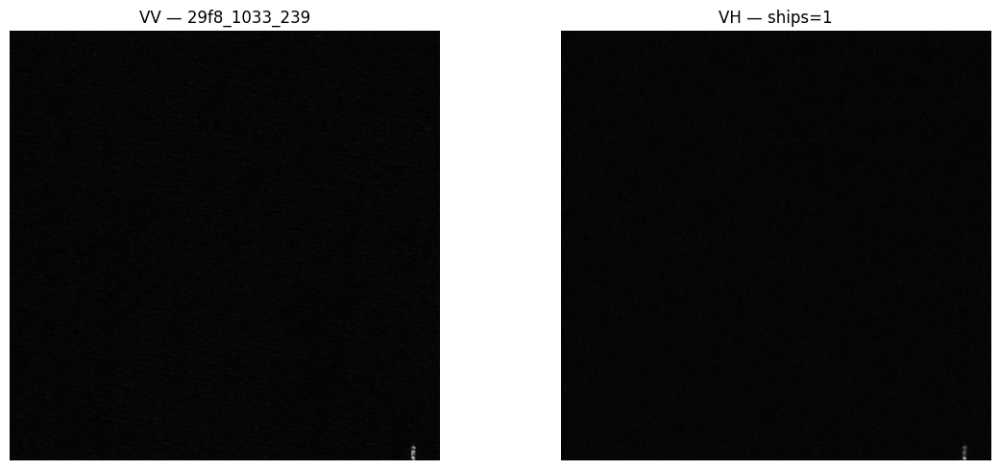


✅ OSSDD SAMPLE INSPECTION COMPLETE


In [73]:
# ============================================================
# OSSDD — STREAM A SMALL SAMPLE
# NO FULL DATASET DOWNLOAD
# ============================================================

!pip install -q webdataset rasterio huggingface_hub

import io
import json
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import webdataset as wds

from huggingface_hub import hf_hub_url


REPO_ID = "sylviaHoch/OpenSARShip-Ship-Detection-Dataset"


# ------------------------------------------------------------
# Current OSSDD repo structure
# ------------------------------------------------------------

print("=" * 70)
print("OSSDD STREAMING INSPECTION")
print("=" * 70)


# First training shard.
# We will inspect it before deciding how much data to use.

shard_url = hf_hub_url(
    repo_id=REPO_ID,
    filename="webdataset/train/train-000000.tar",
    repo_type="dataset"
)

print("Shard URL:")
print(shard_url)


# ------------------------------------------------------------
# Decode TIFF
# ------------------------------------------------------------

def decode_tif(data):

    with rasterio.open(
        io.BytesIO(data)
    ) as src:

        return src.read(1).astype(
            np.float32
        )


# ------------------------------------------------------------
# Decode AABB
# ------------------------------------------------------------

def decode_aabb(data):

    text = data.decode(
        "utf-8"
    )

    lines = [
        x.strip()
        for x in text.splitlines()
        if x.strip()
    ]

    boxes = []

    for line in lines[1:]:

        parts = line.split()

        if len(parts) < 5:
            continue

        boxes.append([
            float(parts[1]),
            float(parts[2]),
            float(parts[3]),
            float(parts[4])
        ])

    return boxes


# ------------------------------------------------------------
# Decode metadata
# ------------------------------------------------------------

def decode_meta(data):

    return json.loads(
        data.decode("utf-8")
    )


# ------------------------------------------------------------
# Stream examples
# ------------------------------------------------------------

dataset = (
    wds.WebDataset(
        shard_url,
        shardshuffle=False
    )
    .map(
        lambda sample: {
            **sample,
            "vv_array": decode_tif(
                sample["vv.tif"]
            ),
            "vh_array": decode_tif(
                sample["vh.tif"]
            ),
            "boxes": decode_aabb(
                sample["aabb.txt"]
            ),
            "meta": decode_meta(
                sample["meta.json"]
            )
        }
    )
)


samples = []

for sample in dataset:

    samples.append(
        sample
    )

    if len(samples) >= 8:
        break


# ------------------------------------------------------------
# Inspect
# ------------------------------------------------------------

print()
print(
    "Samples loaded:",
    len(samples)
)


for i, sample in enumerate(
    samples
):

    print()
    print("-" * 70)
    print(
        f"SAMPLE {i+1}"
    )

    print(
        "Key:",
        sample["__key__"]
    )

    print(
        "VV shape:",
        sample["vv_array"].shape
    )

    print(
        "VH shape:",
        sample["vh_array"].shape
    )

    print(
        "Ships:",
        len(sample["boxes"])
    )

    print(
        "Metadata:",
        sample["meta"]
    )

    print(
        "First boxes:",
        sample["boxes"][:3]
    )


# ------------------------------------------------------------
# Visualize one sample
# ------------------------------------------------------------

sample = samples[0]

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 5)
)


axes[0].imshow(
    sample["vv_array"],
    cmap="gray"
)

axes[0].set_title(
    f"VV — {sample['__key__']}"
)

axes[0].axis("off")


axes[1].imshow(
    sample["vh_array"],
    cmap="gray"
)

axes[1].set_title(
    f"VH — ships={len(sample['boxes'])}"
)

axes[1].axis("off")


plt.tight_layout()
plt.show()


print()
print("=" * 70)
print("✅ OSSDD SAMPLE INSPECTION COMPLETE")
print("=" * 70)

In [74]:
# ============================================================
# OSSDD — STREAM AND SAVE SMALL TRAINING SUBSET
#
# Saves:
#   /kaggle/working/ossdd_small/
#
# Structure:
#   images/
#   labels/
#   metadata/
#
# We use:
#   2000 train samples
#    200 validation samples
#
# The source dataset contains:
#   VV
#   VH
#   AABB annotations
#
# ============================================================

!pip install -q webdataset rasterio huggingface_hub

import io
import json
import os
import numpy as np
import rasterio
import webdataset as wds

from pathlib import Path
from huggingface_hub import hf_hub_url
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

REPO_ID = (
    "sylviaHoch/"
    "OpenSARShip-Ship-Detection-Dataset"
)

OUT_DIR = Path(
    "/kaggle/working/ossdd_small"
)

IMG_DIR = OUT_DIR / "images"
LABEL_DIR = OUT_DIR / "labels"
META_DIR = OUT_DIR / "metadata"

IMG_DIR.mkdir(
    parents=True,
    exist_ok=True
)

LABEL_DIR.mkdir(
    parents=True,
    exist_ok=True
)

META_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TARGET_TRAIN = 2000
TARGET_VAL = 200

# Keep open-water + coastal samples.
# We don't want extremely land-heavy scenes dominating.
MAX_LAND_FRACTION = 0.50


# ============================================================
# SHARD URL HELPER
# ============================================================

def shard_url(split, index):

    filename = (
        f"webdataset/"
        f"{split}/"
        f"{split}-{index:06d}.tar"
    )

    return hf_hub_url(
        repo_id=REPO_ID,
        filename=filename,
        repo_type="dataset"
    )


# ============================================================
# SAVE SAMPLE
# ============================================================

def save_sample(
    sample,
    sample_number,
    split
):

    key = sample[
        "__key__"
    ]


    # --------------------------------------------------------
    # Read VV / VH
    # --------------------------------------------------------

    with rasterio.open(
        io.BytesIO(
            sample["vv.tif"]
        )
    ) as src:

        vv = src.read(
            1
        ).astype(
            np.float32
        )


    with rasterio.open(
        io.BytesIO(
            sample["vh.tif"]
        )
    ) as src:

        vh = src.read(
            1
        ).astype(
            np.float32
        )


    # --------------------------------------------------------
    # Read metadata
    # --------------------------------------------------------

    meta = json.loads(
        sample["meta.json"].decode(
            "utf-8"
        )
    )


    land_fraction = float(
        meta.get(
            "land_fraction",
            0.0
        )
    )


    if land_fraction > MAX_LAND_FRACTION:
        return False


    # --------------------------------------------------------
    # Save VV
    # --------------------------------------------------------

    base = (
        f"{split}_{sample_number:05d}"
    )


    np.save(
        IMG_DIR / f"{base}_vv.npy",
        vv
    )


    np.save(
        IMG_DIR / f"{base}_vh.npy",
        vh
    )


    # --------------------------------------------------------
    # Save AABB annotation
    #
    # Format:
    #   class x1 y1 x2 y2
    #
    # We use class 0 = ship.
    # --------------------------------------------------------

    aabb_text = sample[
        "aabb.txt"
    ].decode(
        "utf-8"
    )


    boxes = []


    for line in aabb_text.splitlines():

        line = line.strip()

        if not line:
            continue

        parts = line.split()

        if len(parts) < 5:
            continue

        # Dataset stores:
        # ship_id x1 y1 x2 y2

        try:

            x1 = float(parts[1])
            y1 = float(parts[2])
            x2 = float(parts[3])
            y2 = float(parts[4])

        except ValueError:

            continue


        boxes.append(
            [
                0,
                x1,
                y1,
                x2,
                y2
            ]
        )


    # --------------------------------------------------------
    # Save labels
    # --------------------------------------------------------

    with open(
        LABEL_DIR / f"{base}.txt",
        "w"
    ) as f:

        for box in boxes:

            f.write(
                " ".join(
                    str(x)
                    for x in box
                )
                + "\n"
            )


    # --------------------------------------------------------
    # Save metadata
    # --------------------------------------------------------

    with open(
        META_DIR / f"{base}.json",
        "w"
    ) as f:

        json.dump(
            {
                "source_key":
                    key,

                "dataset_filename":
                    meta.get(
                        "file_name"
                    ),

                "land_fraction":
                    land_fraction,

                "text":
                    meta.get(
                        "text",
                        ""
                    ),

                "num_ships":
                    len(boxes),

                "split":
                    split
            },
            f,
            indent=2
        )


    return True


# ============================================================
# STREAM TRAIN
# ============================================================

print("=" * 70)
print("STREAMING OSSDD TRAINING DATA")
print("=" * 70)

train_saved = 0
train_seen = 0

SHARD_INDEX = 0

while train_saved < TARGET_TRAIN:

    url = shard_url(
        "train",
        SHARD_INDEX
    )

    print(
        f"\nShard {SHARD_INDEX}:"
    )

    print(url)


    try:

        dataset = (
            wds.WebDataset(
                url,
                shardshuffle=False
            )
        )

    except Exception as e:

        print(
            "Could not open shard:",
            e
        )

        SHARD_INDEX += 1
        continue


    for sample in dataset:

        train_seen += 1


        saved = save_sample(
            sample,
            train_saved,
            "train"
        )


        if saved:

            train_saved += 1


            if train_saved % 100 == 0:

                print(
                    f"Saved "
                    f"{train_saved}/"
                    f"{TARGET_TRAIN}"
                )


        if train_saved >= TARGET_TRAIN:
            break


    SHARD_INDEX += 1


# ============================================================
# STREAM VALIDATION
# ============================================================

print()
print("=" * 70)
print("STREAMING OSSDD VALIDATION DATA")
print("=" * 70)

val_saved = 0
val_seen = 0

SHARD_INDEX = 0

while val_saved < TARGET_VAL:

    url = shard_url(
        "validation",
        SHARD_INDEX
    )

    print(
        f"\nShard {SHARD_INDEX}:"
    )

    print(url)


    try:

        dataset = (
            wds.WebDataset(
                url,
                shardshuffle=False
            )
        )

    except Exception as e:

        print(
            "Could not open shard:",
            e
        )

        SHARD_INDEX += 1
        continue


    for sample in dataset:

        val_seen += 1


        saved = save_sample(
            sample,
            val_saved,
            "val"
        )


        if saved:

            val_saved += 1


            if val_saved % 50 == 0:

                print(
                    f"Saved "
                    f"{val_saved}/"
                    f"{TARGET_VAL}"
                )


        if val_saved >= TARGET_VAL:
            break


    SHARD_INDEX += 1


# ============================================================
# FINAL REPORT
# ============================================================

train_vv = list(
    IMG_DIR.glob(
        "train_*_vv.npy"
    )
)

train_vh = list(
    IMG_DIR.glob(
        "train_*_vh.npy"
    )

)

val_vv = list(
    IMG_DIR.glob(
        "val_*_vv.npy"
    )
)

val_vh = list(
    IMG_DIR.glob(
        "val_*_vh.npy"
    )
)


print()
print("=" * 70)
print("OSSDD SUBSET READY")
print("=" * 70)

print(
    "Training VV:",
    len(train_vv)
)

print(
    "Training VH:",
    len(train_vh)
)

print(
    "Validation VV:",
    len(val_vv)
)

print(
    "Validation VH:",
    len(val_vh)
)

print()
print(
    "Saved to:",
    OUT_DIR
)

print()
print(
    "✅ No full 72 GB OSSDD download performed."
)

STREAMING OSSDD TRAINING DATA

Shard 0:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000000.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 100/2000

Shard 1:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000001.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 200/2000

Shard 2:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000002.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 300/2000

Shard 3:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000003.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 400/2000

Shard 4:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000004.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 500/2000

Shard 5:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000005.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 600/2000

Shard 6:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000006.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 700/2000

Shard 7:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000007.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 800/2000

Shard 8:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000008.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 900/2000

Shard 9:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000009.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1000/2000
Saved 1100/2000

Shard 10:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000010.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1200/2000

Shard 11:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000011.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1300/2000

Shard 12:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000012.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1400/2000

Shard 13:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000013.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1500/2000

Shard 14:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000014.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1600/2000

Shard 15:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000015.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1700/2000
Saved 1800/2000

Shard 16:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000016.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 1900/2000

Shard 17:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/train/train-000017.tar


/usr/local/lib/python3.12/dist-packages/rasterio/io.py:140: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  rd = DatasetReader(mempath, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Saved 2000/2000

STREAMING OSSDD VALIDATION DATA

Shard 0:
https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/validation/validation-000000.tar


OSError: ("((['curl', '--connect-timeout', '30', '--retry', '30', '--retry-delay', '2', '-f', '-s', '-L', 'https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/validation/validation-000000.tar'],), {'bufsize': 8192}): exit 22 (read) {}", <webdataset.gopen.Pipe object at 0x788b7c2fd760>, 'https://huggingface.co/datasets/sylviaHoch/OpenSARShip-Ship-Detection-Dataset/resolve/main/webdataset/validation/validation-000000.tar')

# getting ossdd datset 

In [ ]:
# ============================================================
# OSSDD — BUILD PAIRED VALIDATION SET
# CORRECT SPLIT: "val"
# ============================================================

!pip install -q webdataset rasterio huggingface_hub

import io
import json
import numpy as np
import rasterio
import webdataset as wds

from pathlib import Path
from huggingface_hub import hf_hub_url


# ============================================================
# CONFIG
# ============================================================

REPO_ID = (
    "sylviaHoch/"
    "OpenSARShip-Ship-Detection-Dataset"
)

OUT_DIR = Path(
    "/kaggle/working/ossdd_paired"
)

VAL_DIR = (
    OUT_DIR / "val"
)

VAL_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TARGET_VAL = 200

MAX_LAND_FRACTION = 0.50


# ============================================================
# HELPERS
# ============================================================

def val_shard_url(index):

    filename = (
        f"webdataset/val/"
        f"val-{index:06d}.tar"
    )

    return hf_hub_url(
        repo_id=REPO_ID,
        filename=filename,
        repo_type="dataset"
    )


def existing_sample_count(directory):

    if not directory.exists():
        return 0

    count = 0

    for p in directory.iterdir():

        if not p.is_dir():
            continue

        required = [
            p / "vv.npy",
            p / "vh.npy",
            p / "boxes.json",
            p / "meta.json"
        ]

        if all(
            x.exists()
            for x in required
        ):
            count += 1

    return count


def next_sample_id(directory):

    ids = []

    for p in directory.iterdir():

        if not p.is_dir():
            continue

        try:
            ids.append(
                int(p.name)
            )
        except ValueError:
            pass

    if not ids:
        return 0

    return max(ids) + 1


def read_tif(data):

    with rasterio.open(
        io.BytesIO(data)
    ) as src:

        return src.read(
            1
        ).astype(
            np.float32
        )


def parse_boxes(data):

    text = data.decode(
        "utf-8"
    )

    boxes = []

    lines = [
        line.strip()
        for line in text.splitlines()
        if line.strip()
    ]

    # First line = number of boxes
    for line in lines[1:]:

        parts = line.split()

        if len(parts) < 5:
            continue

        try:

            x1 = float(parts[1])
            y1 = float(parts[2])
            x2 = float(parts[3])
            y2 = float(parts[4])

        except ValueError:

            continue

        boxes.append({
            "x1": x1,
            "y1": y1,
            "x2": x2,
            "y2": y2
        })

    return boxes


def save_sample(
    sample,
    sample_id
):

    meta = json.loads(
        sample["meta.json"].decode(
            "utf-8"
        )
    )

    land_fraction = float(
        meta.get(
            "land_fraction",
            0.0
        )
    )

    if land_fraction > MAX_LAND_FRACTION:
        return False


    vv = read_tif(
        sample["vv.tif"]
    )

    vh = read_tif(
        sample["vh.tif"]
    )


    if vv.shape != vh.shape:

        raise RuntimeError(
            f"VV/VH mismatch: "
            f"{vv.shape} vs {vh.shape}"
        )


    boxes = parse_boxes(
        sample["aabb.txt"]
    )


    sample_dir = (
        VAL_DIR /
        f"{sample_id:05d}"
    )

    sample_dir.mkdir(
        parents=True,
        exist_ok=False
    )


    # --------------------------------------------------------
    # PAIRED POLARIZATIONS
    # --------------------------------------------------------

    np.save(
        sample_dir / "vv.npy",
        vv
    )

    np.save(
        sample_dir / "vh.npy",
        vh
    )


    # --------------------------------------------------------
    # SHIP BOXES
    # --------------------------------------------------------

    with open(
        sample_dir / "boxes.json",
        "w"
    ) as f:

        json.dump(
            boxes,
            f,
            indent=2
        )


    # --------------------------------------------------------
    # METADATA
    # --------------------------------------------------------

    metadata = {

        "source_key":
            sample["__key__"],

        "dataset_filename":
            meta.get(
                "file_name",
                ""
            ),

        "description":
            meta.get(
                "text",
                ""
            ),

        "land_fraction":
            land_fraction,

        "num_ships":
            len(boxes),

        "vv_shape":
            list(vv.shape),

        "vh_shape":
            list(vh.shape),

        "split":
            "val"
    }


    with open(
        sample_dir / "meta.json",
        "w"
    ) as f:

        json.dump(
            metadata,
            f,
            indent=2
        )


    return True


# ============================================================
# RESUME
# ============================================================

val_count = existing_sample_count(
    VAL_DIR
)

print("=" * 70)
print("OSSDD VALIDATION — CORRECTED")
print("=" * 70)

print(
    "Existing valid samples:",
    val_count
)

print(
    "Target:",
    TARGET_VAL
)


# ============================================================
# STREAM ACTUAL val/ SHARDS
# ============================================================

shard_index = 0


while val_count < TARGET_VAL:

    url = val_shard_url(
        shard_index
    )

    print()
    print("=" * 70)
    print(
        f"VAL SHARD {shard_index}"
    )
    print("=" * 70)

    print(url)


    try:

        dataset = wds.WebDataset(
            url,
            shardshuffle=False,
            handler=wds.handlers.warn_and_continue,
            empty_check=False
        )


        for sample in dataset:

            if val_count >= TARGET_VAL:
                break


            try:

                saved = save_sample(
                    sample,
                    next_sample_id(
                        VAL_DIR
                    )
                )

            except Exception as e:

                print(
                    "⚠️ Sample skipped:",
                    str(e)[:200]
                )

                continue


            if saved:

                val_count += 1


                if val_count % 25 == 0:

                    print(
                        f"Saved "
                        f"{val_count}/"
                        f"{TARGET_VAL}"
                    )


        print(
            f"✅ Finished val shard "
            f"{shard_index}"
        )


        shard_index += 1


    except Exception as e:

        print(
            "⚠️ Could not read shard:"
        )

        print(
            str(e)[:500]
        )

        shard_index += 1


        # If a shard is unavailable,
        # continue to the next one.


# ============================================================
# VERIFY
# ============================================================

samples = sorted(
    p
    for p in VAL_DIR.iterdir()
    if p.is_dir()
)


good = 0
bad = []


for sample_dir in samples:

    required = [
        sample_dir / "vv.npy",
        sample_dir / "vh.npy",
        sample_dir / "boxes.json",
        sample_dir / "meta.json"
    ]

    if not all(
        x.exists()
        for x in required
    ):

        bad.append(
            sample_dir.name
        )

        continue


    vv = np.load(
        sample_dir / "vv.npy"
    )

    vh = np.load(
        sample_dir / "vh.npy"
    )


    if vv.shape != vh.shape:

        bad.append(
            sample_dir.name
        )

        continue


    good += 1


# ============================================================
# FINAL
# ============================================================

print()
print("=" * 70)
print("OSSDD VALIDATION READY")
print("=" * 70)

print(
    "Total validation directories:",
    len(samples)
)

print(
    "Valid paired samples:",
    good
)

print(
    "Invalid samples:",
    len(bad)
)

if good >= TARGET_VAL and not bad:

    print()
    print(
        "✅ Validation set complete."
    )

    print(
        "Each sample contains:"
    )

    print(
        "  VV"
    )

    print(
        "  VH"
    )

    print(
        "  ship boxes"
    )

    print(
        "  metadata"
    )

else:

    print()
    print(
        "⚠️ Validation set is incomplete."
    )

In [ ]:
# ============================================================
# OSSDD — SHIP DETECTOR TRAINING
#
# Input:
#   2-channel SAR = [VV, VH]
#
# Target:
#   Ship bounding boxes
#
# Dataset:
#   2000 train
#    200 val
#
# Model:
#   YOLO-style lightweight detector
#
# ============================================================

!pip install -q ultralytics

import json
import shutil
import numpy as np

from pathlib import Path
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

SRC_ROOT = Path(
    "/kaggle/working/ossdd_paired"
)

TRAIN_SRC = SRC_ROOT / "train"
VAL_SRC = SRC_ROOT / "val"

YOLO_ROOT = Path(
    "/kaggle/working/ossdd_yolo"
)

TRAIN_IMG = YOLO_ROOT / "images/train"
VAL_IMG = YOLO_ROOT / "images/val"

TRAIN_LBL = YOLO_ROOT / "labels/train"
VAL_LBL = YOLO_ROOT / "labels/val"

for p in [
    TRAIN_IMG,
    VAL_IMG,
    TRAIN_LBL,
    VAL_LBL
]:
    p.mkdir(
        parents=True,
        exist_ok=True
    )


IMAGE_SIZE = 700


# ============================================================
# NOTE
# ============================================================
#
# YOLO expects 3-channel images in the standard pipeline.
#
# We therefore create a 3-channel representation:
#
#   R = normalized VV
#   G = normalized VH
#   B = mean(VV, VH)
#
# This preserves both SAR polarizations while remaining
# compatible with an off-the-shelf YOLO detector.
#
# ============================================================


def normalize_channel(x):

    x = x.astype(
        np.float32
    )

    lo = np.percentile(
        x,
        2
    )

    hi = np.percentile(
        x,
        98
    )

    if hi <= lo:

        return np.zeros_like(
            x,
            dtype=np.float32
        )

    x = (
        x - lo
    ) / (
        hi - lo
    )

    return np.clip(
        x,
        0,
        1
    )


# ============================================================
# CONVERT ONE SAMPLE
# ============================================================

def convert_sample(
    sample_dir,
    output_img_dir,
    output_lbl_dir,
    index
):

    vv_path = (
        sample_dir /
        "vv.npy"
    )

    vh_path = (
        sample_dir /
        "vh.npy"
    )

    boxes_path = (
        sample_dir /
        "boxes.json"
    )


    vv = np.load(
        vv_path
    )

    vh = np.load(
        vh_path
    )


    # --------------------------------------------------------
    # Make dimensions equal
    # --------------------------------------------------------

    if vv.shape != vh.shape:

        raise RuntimeError(
            f"VV/VH shape mismatch "
            f"in {sample_dir}"
        )


    H, W = vv.shape


    # --------------------------------------------------------
    # Normalize
    # --------------------------------------------------------

    vv_n = normalize_channel(
        vv
    )

    vh_n = normalize_channel(
        vh
    )


    mean_n = (
        vv_n +
        vh_n
    ) / 2.0


    # --------------------------------------------------------
    # 3-channel image
    # --------------------------------------------------------

    rgb = np.stack(
        [
            vv_n,
            vh_n,
            mean_n
        ],
        axis=2
    )


    rgb = (
        rgb * 255
    ).astype(
        np.uint8
    )


    # --------------------------------------------------------
    # Save PNG
    # --------------------------------------------------------

    image_name = (
        f"{index:05d}.png"
    )

    image_path = (
        output_img_dir /
        image_name
    )


    import cv2

    cv2.imwrite(
        str(image_path),
        cv2.cvtColor(
            rgb,
            cv2.COLOR_RGB2BGR
        )
    )


    # --------------------------------------------------------
    # Load boxes
    # --------------------------------------------------------

    with open(
        boxes_path,
        "r"
    ) as f:

        boxes = json.load(
            f
        )


    # --------------------------------------------------------
    # YOLO labels
    #
    # class cx cy width height
    # normalized 0..1
    # --------------------------------------------------------

    label_path = (
        output_lbl_dir /
        f"{index:05d}.txt"
    )


    with open(
        label_path,
        "w"
    ) as f:

        for box in boxes:

            x1 = float(
                box["x1"]
            )

            y1 = float(
                box["y1"]
            )

            x2 = float(
                box["x2"]
            )

            y2 = float(
                box["y2"]
            )


            # Clamp coordinates

            x1 = np.clip(
                x1,
                0,
                W
            )

            x2 = np.clip(
                x2,
                0,
                W
            )

            y1 = np.clip(
                y1,
                0,
                H
            )

            y2 = np.clip(
                y2,
                0,
                H
            )


            width = (
                x2 - x1
            )

            height = (
                y2 - y1
            )


            if (
                width <= 0
                or
                height <= 0
            ):
                continue


            cx = (
                x1 + x2
            ) / 2

            cy = (
                y1 + y2
            ) / 2


            # Normalize

            cx /= W
            cy /= H

            width /= W
            height /= H


            f.write(
                f"0 "
                f"{cx:.8f} "
                f"{cy:.8f} "
                f"{width:.8f} "
                f"{height:.8f}\n"
            )


# ============================================================
# TRAIN CONVERSION
# ============================================================

train_samples = sorted(
    p
    for p in TRAIN_SRC.iterdir()
    if p.is_dir()
)


print("=" * 70)
print("CONVERTING TRAINING DATA")
print("=" * 70)


for idx, sample_dir in tqdm(
    enumerate(train_samples),
    total=len(train_samples),
    desc="Train"
):

    convert_sample(
        sample_dir,
        TRAIN_IMG,
        TRAIN_LBL,
        idx
    )


# ============================================================
# VALIDATION CONVERSION
# ============================================================

val_samples = sorted(
    p
    for p in VAL_SRC.iterdir()
    if p.is_dir()
)


print()
print("=" * 70)
print("CONVERTING VALIDATION DATA")
print("=" * 70)


for idx, sample_dir in tqdm(
    enumerate(val_samples),
    total=len(val_samples),
    desc="Val"
):

    convert_sample(
        sample_dir,
        VAL_IMG,
        VAL_LBL,
        idx
    )


# ============================================================
# CREATE DATASET YAML
# ============================================================

DATA_YAML = (
    YOLO_ROOT /
    "ossdd.yaml"
)


yaml_text = f"""
path: {YOLO_ROOT}

train: images/train
val: images/val

names:
  0: ship
"""


DATA_YAML.write_text(
    yaml_text.strip()
)


# ============================================================
# SUMMARY
# ============================================================

train_images = len(
    list(
        TRAIN_IMG.glob("*.png")
    )
)

val_images = len(
    list(
        VAL_IMG.glob("*.png")
    )
)

train_labels = len(
    list(
        TRAIN_LBL.glob("*.txt")
    )
)

val_labels = len(
    list(
        VAL_LBL.glob("*.txt")
    )
)


print()
print("=" * 70)
print("YOLO DATASET READY")
print("=" * 70)

print(
    "Train images:",
    train_images
)

print(
    "Train labels:",
    train_labels
)

print(
    "Val images:",
    val_images
)

print(
    "Val labels:",
    val_labels
)

print()
print(
    "Dataset YAML:",
    DATA_YAML
)

print()
print(
    "✅ VV + VH preserved in 3-channel representation."
)